In [ ]:
!pip install gymnasium

In [ ]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Define waste types as an enumeration
# This class represents different types of waste that can exist in the environment
class WasteType:
    # Each waste type is represented by a unique integer
    EMPTY = 0      # Represents a clean cell with no waste
    ORGANIC = 1    # Organic waste (e.g., food scraps)
    GLASS = 2      # Glass waste
    PLASTIC = 3    # Plastic waste
    PAPER = 4      # Paper waste
# تعريف أنواع الأثاث
class FurnitureType:
    BED = 1
    SOFA = 2
    TABLE = 3
    CABINET = 4
    DESK = 5

class Room:
    def __init__(self, name, start_x, start_y, width, height, waste_types_distribution, furniture_layout=None):
        self.name = name
        self.start_x = start_x
        self.start_y = start_y
        self.width = width
        self.height = height
        self.waste_types_distribution = self.generate_waste_distribution(waste_types_distribution)
        self.furniture_layout = furniture_layout or self.get_default_furniture()

    def get_default_furniture(self):
        furniture = []
        if self.name == "Bedroom":
            furniture.append({"type": FurnitureType.BED, "x": self.start_x + 1, "y": self.start_y + 1, "width": 2, "height": 3})
        elif self.name == "Living Room":
            furniture.append({"type": FurnitureType.SOFA, "x": self.start_x + 1, "y": self.start_y + 1, "width": 3, "height": 1})
        elif self.name == "Office":
            furniture.append({"type": FurnitureType.DESK, "x": self.start_x + 1, "y": self.start_y + 1, "width": 2, "height": 1})
        return furniture

    def generate_waste_distribution(self, priorities):
        """
        Generate random waste distribution based on given priorities.
        :param priorities: A dictionary with WasteType as keys and priority weights as values.
        :return: A dictionary with WasteType as keys and normalized percentages as values.
        """
        weights = {waste: random.uniform(0.8, 1.2) * weight for waste, weight in priorities.items()}
        total = sum(weights.values())
        return {waste: weight / total for waste, weight in weights.items()}
# Custom OpenAI Gym environment for a Cleaning Robot
# This environment simulates a robot's task of cleaning up different types of waste
class CleaningRobotEnv(gym.Env):
    def __init__(self, map_size=15, rooms=None, max_time_steps=150):
        super().__init__()

        # Define rooms with realistic waste distributions
        self.rooms = rooms or [
            Room("Kitchen", 0, 0, 5, 5, {
                WasteType.ORGANIC: 0.5,    # Food scraps
                WasteType.PLASTIC: 0.3,    # Food packaging
                WasteType.GLASS: 0.2       # Bottles
            }),
            Room("Living Room", 5, 0, 5, 5, {
                WasteType.PAPER: 0.4,      # Magazines, newspapers
                WasteType.PLASTIC: 0.3,    # Packaging
                WasteType.GLASS: 0.3       # Drink containers
            }),
            Room("Bedroom", 10, 0, 5, 5, {
                WasteType.PAPER: 0.3,      # Notes, receipts
                WasteType.PLASTIC: 0.4,    # Packaging
                WasteType.ORGANIC: 0.3     # Small organic waste
            }),
            Room("Office", 0, 5, 5, 5, {
                WasteType.PAPER: 0.6,      # Documents, notes
                WasteType.PLASTIC: 0.4     # Office supplies
            }),
            Room("Guest Room", 5, 5, 5, 5, {
                WasteType.PAPER: 0.3,
                WasteType.PLASTIC: 0.4,
                WasteType.GLASS: 0.3
            })
        ]

        # Update map size and other parameters
        self.map_size = map_size
        self.max_time_steps = max_time_steps
        self.furniture_penalty = -2    # تخفيف عقوبة الاصطدام
        self.time_penalty_factor = -0.001  # تخفيف عقوبة الوقت بشكل كبير
        self.furniture_map = np.zeros((map_size, map_size))
        # Rest of the initialization remains the same
        self.waste_points = {
            WasteType.ORGANIC: 25,    # زيادة المكافآت
            WasteType.GLASS: 30,
            WasteType.PLASTIC: 20,
            WasteType.PAPER: 15
        }
        # إعداد الأثاث في كل غرفة
        self._setup_furniture()
        self.action_space = gym.spaces.Discrete(4)
        self.observation_space = gym.spaces.Box(
            low=0, high=4,
            shape=(map_size, map_size),
            dtype=np.float32
        )

        self.reset()
    def _setup_furniture(self):
        for room in self.rooms:
            for furniture in room.furniture_layout:
                x, y = furniture["x"], furniture["y"]
                width, height = furniture["width"], furniture["height"]
                for dx in range(width):
                    for dy in range(height):
                        self.furniture_map[x + dx, y + dy] = furniture["type"]
    def create_waste_map(self, seed=None):
        if seed is not None:
            random.seed(seed)
            np.random.seed(seed)

        # Initialize an empty waste map
        waste_map = np.zeros((self.map_size, self.map_size), dtype=np.int8)

        # Generate waste for each room
        for room in self.rooms:
            for x in range(room.start_x, room.start_x + room.width):
                for y in range(room.start_y, room.start_y + room.height):
                    # Skip if the cell is already filled with waste
                    if waste_map[x, y] != WasteType.EMPTY:
                        continue

                    # Determine waste placement based on room's distribution
                    if random.random() < 0.4:  # 40% chance of waste in a cell
                        waste_types = list(room.waste_types_distribution.keys())
                        waste_probs = list(room.waste_types_distribution.values())

                        # Choose waste type for this cell
                        waste_type = np.random.choice(waste_types, p=waste_probs)
                        waste_map[x, y] = waste_type

                        # Create waste clusters
                        cluster_prob = 0.6
                        for dx in [-1, 0, 1]:
                            for dy in [-1, 0, 1]:
                                new_x, new_y = x + dx, y + dy
                                # Check bounds and empty cell
                                if (0 <= new_x < self.map_size and
                                    0 <= new_y < self.map_size and
                                    waste_map[new_x, new_y] == WasteType.EMPTY and
                                    random.random() < cluster_prob):
                                    waste_map[new_x, new_y] = waste_type

        return waste_map

    def reset(self, seed=None, options=None):
        # Reset the environment to its initial state
        super().reset(seed=seed)

        # Place the robot at the starting position (top-left corner)
        self.robot_pos = [0, 0]

        # Generate a new waste map
        self.waste_map = self.create_waste_map(seed)

        # Track the total initial waste for performance measurement
        self.total_initial_waste = np.sum(self.waste_map > 0)

        # Reset the step counter
        self.steps_taken = 0

        return self.waste_map, {}

    def step(self, action):
        self.steps_taken += 1

        # حساب الموقع الجديد
        new_x, new_y = self.robot_pos.copy()
        if action == 0: new_y = min(new_y + 1, self.map_size - 1)
        elif action == 1: new_y = max(new_y - 1, 0)
        elif action == 2: new_x = max(new_x - 1, 0)
        elif action == 3: new_x = min(new_x + 1, self.map_size - 1)

        # التحقق من الاصطدام بالأثاث
        if self.furniture_map[new_x, new_y] != 0:
            reward = self.furniture_penalty
            done = False
        else:
            self.robot_pos = [new_x, new_y]
            waste_type = self.waste_map[new_x, new_y]

            # هيكل مكافآت محسن
            base_reward = self.waste_points.get(waste_type, 0)
            time_penalty = self.time_penalty_factor * self.steps_taken
            proximity_bonus = self._calculate_proximity_bonus()

            reward = base_reward + time_penalty + proximity_bonus

            if waste_type > 0:  # إذا تم التقاط نفايات
                reward += 5  # مكافأة إضافية للعمل المفيد

            self.waste_map[new_x, new_y] = WasteType.EMPTY
            current_waste = np.sum(self.waste_map > 0)
            done = current_waste == 0 or self.steps_taken >= self.max_time_steps

            if done and current_waste == 0:
                efficiency_bonus = (self.max_time_steps - self.steps_taken) * 0.5
                reward += 200 + efficiency_bonus  # مكافأة أكبر لإكمال المهمة

        return self.waste_map, reward, done, False, {
            'cleaned_waste_type': waste_type if 'waste_type' in locals() else None,
            'remaining_waste': np.sum(self.waste_map > 0),
            'steps_taken': self.steps_taken,
            'furniture_collision': self.furniture_map[new_x, new_y] != 0
        }
    def _calculate_proximity_bonus(self):
        """حساب مكافأة إضافية بناءً على القرب من النفايات"""
        bonus = 0
        robot_x, robot_y = self.robot_pos
        for dx in [-1, 0, 1]:
            for dy in [-1, 0, 1]:
                x, y = robot_x + dx, robot_y + dy
                if (0 <= x < self.map_size and
                    0 <= y < self.map_size and
                    self.waste_map[x, y] > 0):
                    bonus += 1
        return bonus * 0.5  # مكافأة صغيرة للتحرك نحو النفايات

In [ ]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
from collections import deque
import tensorflow as tf
import pandas as pd
import seaborn as sns

class DeepQLearningAgent:
    def __init__(self, env, state_shape, action_size,
                 learning_rate=0.0001,           # معدل تعلم أقل لتحقيق استقرار أفضل
                 discount_factor=0.99,
                 initial_epsilon=1.0,
                 min_epsilon=0.1,               # زيادة الحد الأدنى للاستكشاف
                 epsilon_decay=0.995,           # تناقص أبطأ لـ epsilon
                 replay_buffer_size=200000,     # ذاكرة أكبر
                 batch_size=128,                # حجم دفعة أكبر
                 tau=0.01):                     # معدل تحديث أبطأ للشبكة الهدف

        self.env = env
        self.state_shape = state_shape
        self.action_size = action_size
        self.lr = learning_rate
        self.gamma = discount_factor
        self.epsilon = initial_epsilon
        self.min_epsilon = min_epsilon
        self.epsilon_decay = epsilon_decay
        self.batch_size = batch_size
        self.tau = tau
        self.gradient_clip_norm = 1.0

        # إضافة متغيرات لتتبع الأداء
        self.training_loss = []
        self.episode_rewards = []
        self.episode_lengths = []
        self.epsilon_values = []
        self.q_values_history = []

        self.replay_buffer = deque(maxlen=replay_buffer_size)
        self.model = self._build_model()
        self.target_model = self._build_model()
        self.update_target_network(tau=1.0)

    def _build_model(self):
        model = tf.keras.Sequential([
            # طبقة المدخلات
            tf.keras.layers.Flatten(input_shape=self.state_shape),

            # الطبقات المخفية
            tf.keras.layers.Dense(256, activation='relu', kernel_initializer='he_normal'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.2),

            tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_normal'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dropout(0.2),

            tf.keras.layers.Dense(64, activation='relu', kernel_initializer='he_normal'),
            tf.keras.layers.BatchNormalization(),

            # طبقة الإخراج
            tf.keras.layers.Dense(self.action_size, activation='linear')
        ])

        optimizer = tf.keras.optimizers.Adam(
            learning_rate=tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate=self.lr,
                decay_steps=10000,
                decay_rate=0.95,
                staircase=True
            ),
            clipnorm=self.gradient_clip_norm
        )

        model.compile(optimizer=optimizer, loss='huber')  # استخدام Huber loss لتحقيق استقرار أفضل
        return model

    def choose_action(self, state):
        if random.uniform(0, 1) < self.epsilon:
            return self.env.action_space.sample()
        else:
            q_values = self.model.predict(state[np.newaxis, :], verbose=0)
            self.q_values_history.append(np.mean(q_values))
            return np.argmax(q_values[0])

    def store_experience(self, state, action, reward, next_state, done):
        self.replay_buffer.append((state, action, reward, next_state, done))

    def train(self):
        if len(self.replay_buffer) < self.batch_size:
            return 0

        # اختيار عينات عشوائية من الذاكرة
        indices = np.random.choice(len(self.replay_buffer), self.batch_size, replace=False)
        batch = [self.replay_buffer[i] for i in indices]
        states, actions, rewards, next_states, dones = zip(*batch)

        states = np.array(states)
        next_states = np.array(next_states)
        rewards = np.array(rewards, dtype=np.float32)
        actions = np.array(actions)
        dones = np.array(dones, dtype=np.float32)

        # تطبيق تقنية Double DQN
        current_q_values = self.model.predict(states, verbose=0)
        next_q_values = self.target_model.predict(next_states, verbose=0)
        next_actions = np.argmax(self.model.predict(next_states, verbose=0), axis=1)

        targets = current_q_values.copy()
        for i in range(self.batch_size):
            if dones[i]:
                targets[i][actions[i]] = rewards[i]
            else:
                targets[i][actions[i]] = rewards[i] + self.gamma * next_q_values[i][next_actions[i]]

        # التدريب
        history = self.model.fit(states, targets, epochs=1, verbose=0, batch_size=self.batch_size)
        loss = history.history['loss'][0]
        self.training_loss.append(loss)
        return loss

    def update_target_network(self, tau=None):
        if tau is None:
            tau = self.tau
        weights = self.model.get_weights()
        target_weights = self.target_model.get_weights()
        for i in range(len(target_weights)):
            target_weights[i] = tau * weights[i] + (1 - tau) * target_weights[i]
        self.target_model.set_weights(target_weights)

    def decay_epsilon(self):
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)
        self.epsilon_values.append(self.epsilon)

    def evaluate(self, num_episodes=10):
        evaluation_rewards = []
        evaluation_lengths = []
        evaluation_success_rate = 0
        total_steps = 0
        q_values_during_eval = []

        for _ in range(num_episodes):
            state, _ = self.env.reset()
            episode_reward = 0
            episode_length = 0
            episode_q_values = []
            done = False

            while not done:
                q_values = self.model.predict(state[np.newaxis, :], verbose=0)
                episode_q_values.append(np.mean(q_values))
                action = np.argmax(q_values[0])

                next_state, reward, done, _, _ = self.env.step(action)
                episode_reward += reward
                episode_length += 1
                state = next_state

                if done and reward > 0:
                    evaluation_success_rate += 1

            evaluation_rewards.append(episode_reward)
            evaluation_lengths.append(episode_length)
            total_steps += episode_length
            q_values_during_eval.append(np.mean(episode_q_values))

        return {
            'mean_reward': np.mean(evaluation_rewards),
            'std_reward': np.std(evaluation_rewards),
            'mean_length': np.mean(evaluation_lengths),
            'std_length': np.std(evaluation_lengths),
            'success_rate': (evaluation_success_rate / num_episodes) * 100,
            'average_q_value': np.mean(q_values_during_eval),
            'total_steps': total_steps
        }

def plot_training_metrics(agent1, agent2=None, window_size=10, agent1_name="DQN Agent", agent2_name="Hybrid Agent"):
    import numpy as np
    import matplotlib.pyplot as plt
    import pandas as pd

    # Set figure style
    plt.rcParams.update({
        'figure.figsize': (16, 20),
        'axes.grid': True,
        'grid.alpha': 0.3,
        'lines.linewidth': 2,
        'axes.titlepad': 15,
        'font.size': 10,
        'axes.labelsize': 11,
        'axes.titlesize': 12
    })

    # Create figure and grid
    fig = plt.figure()
    gs = fig.add_gridspec(4, 2, hspace=0.3, wspace=0.2)

    # Color palette
    colors1 = ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f', '#9b59b6', '#1abc9c']  # القيم الأولى
    colors2 = ['#27ae60', '#2980b9', '#c0392b', '#f39c12', '#8e44ad', '#16a085']  # القيم الثانية (أغمق قليلاً)

    # Prepare rolling averages for agent1
    df_rewards1 = pd.DataFrame({
        'Episode': range(len(agent1.episode_rewards)),
        'Raw Reward': agent1.episode_rewards,
        'Rolling Average': pd.Series(agent1.episode_rewards).rolling(window=window_size).mean()
    })

    df_lengths1 = pd.DataFrame({
        'Episode': range(len(agent1.episode_lengths)),
        'Raw Length': agent1.episode_lengths,
        'Rolling Average': pd.Series(agent1.episode_lengths).rolling(window=window_size).mean()
    })

    # Prepare data for agent2 if provided
    if agent2 is not None:
        df_rewards2 = pd.DataFrame({
            'Episode': range(len(agent2.episode_rewards)),
            'Raw Reward': agent2.episode_rewards,
            'Rolling Average': pd.Series(agent2.episode_rewards).rolling(window=window_size).mean()
        })

        df_lengths2 = pd.DataFrame({
            'Episode': range(len(agent2.episode_lengths)),
            'Raw Length': agent2.episode_lengths,
            'Rolling Average': pd.Series(agent2.episode_lengths).rolling(window=window_size).mean()
        })

    # 1. Episode Rewards Plot
    ax1 = fig.add_subplot(gs[0, :])
    ax1.plot(df_rewards1['Episode'], df_rewards1['Raw Reward'],
             alpha=0.3, color=colors1[0], label=f'{agent1_name} Raw Rewards')
    ax1.plot(df_rewards1['Episode'], df_rewards1['Rolling Average'],
             color=colors1[0], linewidth=2.5, label=f'{agent1_name} Avg (window={window_size})')

    if agent2 is not None:
        ax1.plot(df_rewards2['Episode'], df_rewards2['Raw Reward'],
                 alpha=0.3, color=colors2[0], label=f'{agent2_name} Raw Rewards')
        ax1.plot(df_rewards2['Episode'], df_rewards2['Rolling Average'],
                 color=colors2[0], linewidth=2.5, label=f'{agent2_name} Avg (window={window_size})')

    ax1.set_title('Episode Rewards Over Time')
    ax1.set_xlabel('Episode')
    ax1.set_ylabel('Total Reward')
    ax1.legend()

    # 2. Episode Lengths Plot
    ax2 = fig.add_subplot(gs[1, :])
    ax2.plot(df_lengths1['Episode'], df_lengths1['Raw Length'],
             alpha=0.3, color=colors1[1], label=f'{agent1_name} Raw Lengths')
    ax2.plot(df_lengths1['Episode'], df_lengths1['Rolling Average'],
             color=colors1[1], linewidth=2.5, label=f'{agent1_name} Avg (window={window_size})')

    if agent2 is not None:
        ax2.plot(df_lengths2['Episode'], df_lengths2['Raw Length'],
                 alpha=0.3, color=colors2[1], label=f'{agent2_name} Raw Lengths')
        ax2.plot(df_lengths2['Episode'], df_lengths2['Rolling Average'],
                 color=colors2[1], linewidth=2.5, label=f'{agent2_name} Avg (window={window_size})')

    ax2.set_title('Episode Lengths Over Time')
    ax2.set_xlabel('Episode')
    ax2.set_ylabel('Steps')
    ax2.legend()

    # 3. Epsilon Value Plot
    ax3 = fig.add_subplot(gs[2, 0])
    ax3.plot(range(len(agent1.epsilon_values)), agent1.epsilon_values,
             color=colors1[2], linewidth=2.5, label=f'{agent1_name} Epsilon')

    if agent2 is not None:
        ax3.plot(range(len(agent2.epsilon_values)), agent2.epsilon_values,
                 color=colors2[2], linewidth=2.5, label=f'{agent2_name} Epsilon')

    ax3.set_title('Epsilon Decay Over Time')
    ax3.set_xlabel('Episode')
    ax3.set_ylabel('Epsilon Value')
    ax3.legend()

    # 4. Average Q-Values Plot
    df_qvalues1 = pd.DataFrame({
        'Step': range(len(agent1.q_values_history)),
        'Raw Q-Value': agent1.q_values_history,
        'Rolling Average': pd.Series(agent1.q_values_history).rolling(window=window_size*10).mean()
    })

    ax4 = fig.add_subplot(gs[2, 1])
    ax4.plot(df_qvalues1['Step'], df_qvalues1['Raw Q-Value'],
             alpha=0.3, color=colors1[3], label=f'{agent1_name} Raw Q-Values')
    ax4.plot(df_qvalues1['Step'], df_qvalues1['Rolling Average'],
             color=colors1[3], linewidth=2.5, label=f'{agent1_name} Avg (window={window_size*10})')

    if agent2 is not None:
        df_qvalues2 = pd.DataFrame({
            'Step': range(len(agent2.q_values_history)),
            'Raw Q-Value': agent2.q_values_history,
            'Rolling Average': pd.Series(agent2.q_values_history).rolling(window=window_size*10).mean()
        })
        ax4.plot(df_qvalues2['Step'], df_qvalues2['Raw Q-Value'],
                 alpha=0.3, color=colors2[3], label=f'{agent2_name} Raw Q-Values')
        ax4.plot(df_qvalues2['Step'], df_qvalues2['Rolling Average'],
                 color=colors2[3], linewidth=2.5, label=f'{agent2_name} Avg (window={window_size*10})')

    ax4.set_title('Average Q-Values Over Time')
    ax4.set_xlabel('Training Step')
    ax4.set_ylabel('Average Q-Value')
    ax4.legend()

    # 5. Training Loss Plot
    if agent1.training_loss:
        df_loss1 = pd.DataFrame({
            'Step': range(len(agent1.training_loss)),
            'Raw Loss': agent1.training_loss,
            'Rolling Average': pd.Series(agent1.training_loss).rolling(window=window_size*10).mean()
        })

        ax5 = fig.add_subplot(gs[3, 0])
        ax5.plot(df_loss1['Step'], df_loss1['Raw Loss'],
                 alpha=0.3, color=colors1[4], label=f'{agent1_name} Raw Loss')
        ax5.plot(df_loss1['Step'], df_loss1['Rolling Average'],
                 color=colors1[4], linewidth=2.5, label=f'{agent1_name} Avg (window={window_size*10})')

        if agent2 is not None and agent2.training_loss:
            df_loss2 = pd.DataFrame({
                'Step': range(len(agent2.training_loss)),
                'Raw Loss': agent2.training_loss,
                'Rolling Average': pd.Series(agent2.training_loss).rolling(window=window_size*10).mean()
            })
            ax5.plot(df_loss2['Step'], df_loss2['Raw Loss'],
                     alpha=0.3, color=colors2[4], label=f'{agent2_name} Raw Loss')
            ax5.plot(df_loss2['Step'], df_loss2['Rolling Average'],
                     color=colors2[4], linewidth=2.5, label=f'{agent2_name} Avg (window={window_size*10})')

        ax5.set_title('Training Loss Over Time')
        ax5.set_xlabel('Training Step')
        ax5.set_ylabel('Loss')
        ax5.legend()

    # 6. Reward Distribution Plot
    ax6 = fig.add_subplot(gs[3, 1])
    ax6.hist(agent1.episode_rewards, bins=30, color=colors1[5], alpha=0.5, label=f'{agent1_name}')
    mean_reward1 = np.mean(agent1.episode_rewards)
    ax6.axvline(mean_reward1, color=colors1[5], linestyle='--',
                label=f'{agent1_name} Mean: {mean_reward1:.1f}')

    if agent2 is not None:
        ax6.hist(agent2.episode_rewards, bins=30, color=colors2[5], alpha=0.5, label=f'{agent2_name}')
        mean_reward2 = np.mean(agent2.episode_rewards)
        ax6.axvline(mean_reward2, color=colors2[5], linestyle='--',
                    label=f'{agent2_name} Mean: {mean_reward2:.1f}')

    ax6.set_title('Reward Distribution')
    ax6.set_xlabel('Reward')
    ax6.set_ylabel('Count')
    ax6.legend()

    # 7. Add comparison metrics if both agents are provided
    if agent2 is not None:
        plt.figtext(0.5, 0.01,
                  f"Performance Comparison:\n"
                  f"{agent1_name} - Avg Reward: {mean_reward1:.1f}, Avg Length: {np.mean(agent1.episode_lengths):.1f}\n"
                  f"{agent2_name} - Avg Reward: {mean_reward2:.1f}, Avg Length: {np.mean(agent2.episode_lengths):.1f}\n"
                  f"Improvement: {((mean_reward2 - mean_reward1) / abs(mean_reward1) * 100):.1f}% in rewards",
                  ha="center", fontsize=12, bbox={"facecolor":"orange", "alpha":0.1, "pad":5})

    plt.suptitle('Comparison of DQN vs Hybrid Agent Training Metrics', fontsize=14, y=0.95)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # return fig

def train_agent(env, num_episodes=500):
    import time
    start_time = time.time()

    state_shape = env.observation_space.shape
    action_size = env.action_space.n
    agent = DeepQLearningAgent(env, state_shape=state_shape, action_size=action_size)

    reward_window = deque(maxlen=10)
    best_average_reward = float('-inf')

    for episode in range(num_episodes):
        state, _ = env.reset()
        total_reward = 0
        episode_length = 0

        while True:
            action = agent.choose_action(state)
            next_state, reward, done, _, _ = env.step(action)

            agent.store_experience(state, action, reward, next_state, done)

            if len(agent.replay_buffer) >= agent.batch_size:
                loss = agent.train()
                if loss:
                    agent.training_loss.append(loss)

            state = next_state
            total_reward += reward
            episode_length += 1

            if done:
                break

        agent.decay_epsilon()

        if episode % int(num_episodes/2) == 0:
            agent.update_target_network()

        reward_window.append(total_reward)
        average_reward = np.mean(reward_window)

        if average_reward > best_average_reward:
            best_average_reward = average_reward
            agent.model.save('best_model.h5')  # حفظ أفضل نموذج

        agent.episode_rewards.append(total_reward)
        agent.episode_lengths.append(episode_length)

        print(f"Episode {episode + 1}: Reward = {total_reward:.2f}, "
              f"Average Reward = {average_reward:.2f}, "
              f"Length = {episode_length}, "
              f"Epsilon = {agent.epsilon:.3f}")

    training_duration = time.time() - start_time

    return agent


In [ ]:
env = CleaningRobotEnv(map_size=15)
agent = train_agent(env, num_episodes=30)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Episode 1: Reward = 1288.08, Average Reward = 1288.08, Length = 150, Epsilon = 0.995


Episode 2: Reward = 1368.68, Average Reward = 1328.38, Length = 150, Epsilon = 0.990
Episode 3: Reward = 1098.03, Average Reward = 1251.59, Length = 150, Epsilon = 0.985
Episode 4: Reward = 814.36, Average Reward = 1142.29, Length = 150, Epsilon = 0.980
Episode 5: Reward = 462.90, Average Reward = 1006.41, Length = 150, Epsilon = 0.975
Episode 6: Reward = 916.33, Average Reward = 991.40, Length = 150, Epsilon = 0.970
Episode 7: Reward = 1401.70, Average Reward = 1050.01, Length = 150, Epsilon = 0.966
Episode 8: Reward = 1471.15, Average Reward = 1102.65, Length = 150, Epsilon = 0.961
Episode 9: Reward = 971.44, Average Reward = 1088.07, Length = 150, Epsilon = 0.956
Episode 10: Reward = 1284.69, Average Reward = 1107.74, Length = 151, Epsilon = 0.951
Episode 11: Reward = 1173.09, Average Reward = 1096.24, Length = 150, Epsilon = 0.946
Episode 12: Reward = 1306.68, Average Reward = 1090.04, Length = 150, Epsilon = 0.942
Episode 13: Reward = 462.86, Average Reward = 1026.52, Length = 150

<ipython-input-3-3f519e9b7a8c>:293: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


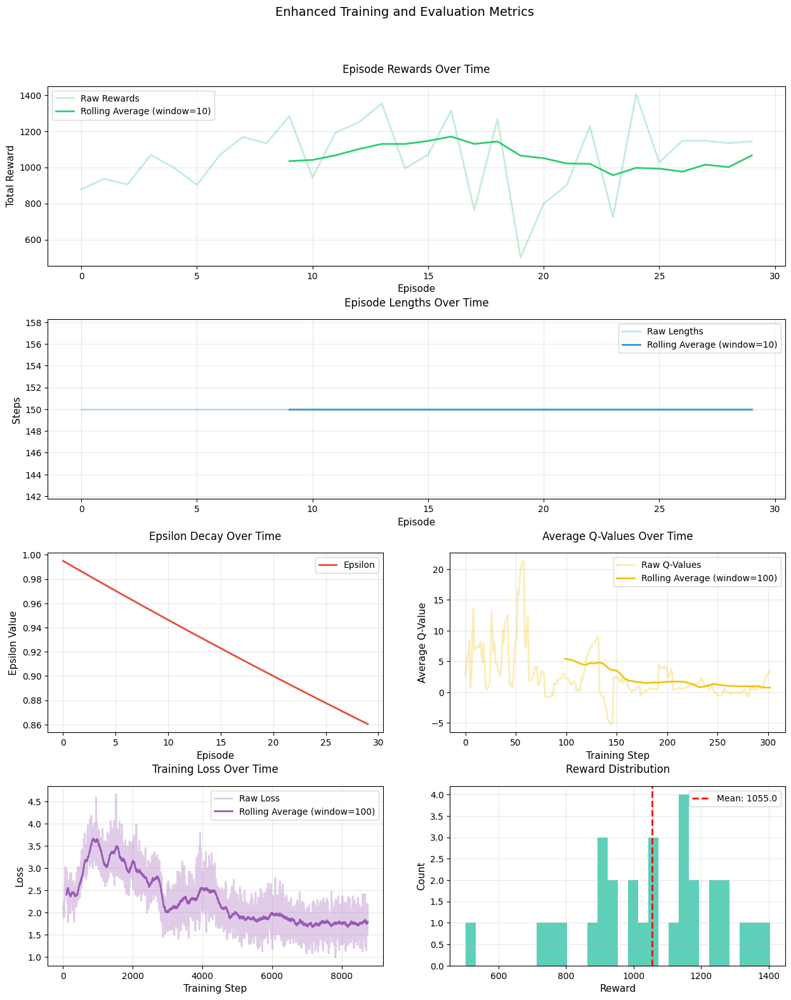

In [ ]:
plot_training_metrics(agent)

In [ ]:
import seaborn as sns

In [ ]:
def test(env, agent, max_steps=60):
    total_reward = 0
    seed = int(np.random.choice([40, 40.5, 41.5, 41]))
    observation, _ = env.reset(seed=seed)
    state = observation
    done = False

    # خريطة ألوان منفصلة للنفايات والأثاث
    waste_colors = ['white', 'green', 'blue', 'red', 'yellow']
    furniture_colors = ['white', 'purple', 'brown', 'gray', 'orange', 'cyan']

    waste_cmap = ListedColormap(waste_colors)
    furniture_cmap = ListedColormap(furniture_colors)

    waste_labels = ["Empty", "Organic", "Glass", "Plastic", "Paper"]
    furniture_labels = ["Empty", "Bed", "Sofa", "Table", "Cabinet", "Desk"]

    plt.figure(figsize=(15, 6))

    for step in range(max_steps):
        if done:
            break

        plt.clf()
        plt.figure(figsize=(15, 6))
        # عرض خريطة النفايات
        plt.subplot(1, 2, 1)
        plt.title("Waste Map")
        waste_img = plt.imshow(env.waste_map, cmap=waste_cmap, vmin=0, vmax=4)
        for room in env.rooms:
            plt.axvline(x=room.start_x + room.width, color='black', linestyle='--', alpha=0.3)
            plt.axhline(y=room.start_y + room.height, color='black', linestyle='--', alpha=0.3)
            plt.text(room.start_x + room.width/2, room.start_y + room.height/2,
                    room.name, fontsize=8, ha='center', va='center')
        plt.scatter(env.robot_pos[1], env.robot_pos[0], color='black', marker='X', s=100, label="Robot")

        # إضافة مفتاح الألوان للنفايات
        waste_patches = [plt.Rectangle((0,0),1,1, fc=waste_colors[i]) for i in range(len(waste_labels))]
        plt.legend(waste_patches, waste_labels, loc='upper right', bbox_to_anchor=(1.3, 1))

        # عرض خريطة الأثاث
        plt.subplot(1, 2, 2)
        plt.title("Furniture Map")
        furniture_img = plt.imshow(env.furniture_map, cmap=furniture_cmap, vmin=0, vmax=5)
        plt.scatter(env.robot_pos[1], env.robot_pos[0], color='black', marker='X', s=100, label="Robot")

        # إضافة مفتاح الألوان للأثاث
        furniture_patches = [plt.Rectangle((0,0),1,1, fc=furniture_colors[i]) for i in range(len(furniture_labels))]
        plt.legend(furniture_patches, furniture_labels, loc='upper right', bbox_to_anchor=(1.3, 1))

        plt.tight_layout()
        plt.pause(0.5)

        action = agent.choose_action(state)
        next_observation, reward, done, _, info = env.step(action)
        state = next_observation
        total_reward += reward
        print(f"Step {step + 1}: Reward = {reward}, Total = {total_reward}")
        if info.get('furniture_collision'):
            print("Warning: Robot collided with furniture!")

    plt.show()
    print(f"Test completed. Total reward: {total_reward}")

<Figure size 1500x600 with 0 Axes>

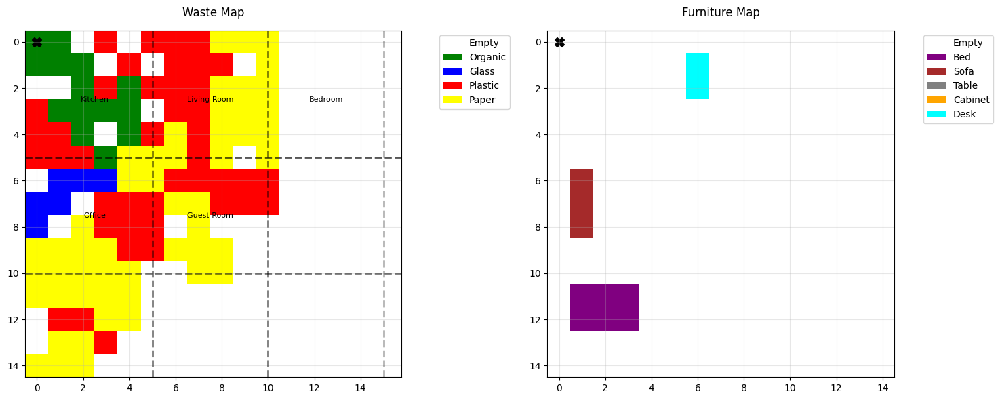

Step 1: Reward = 31.999, Total = 31.999


<Figure size 1500x1800 with 0 Axes>

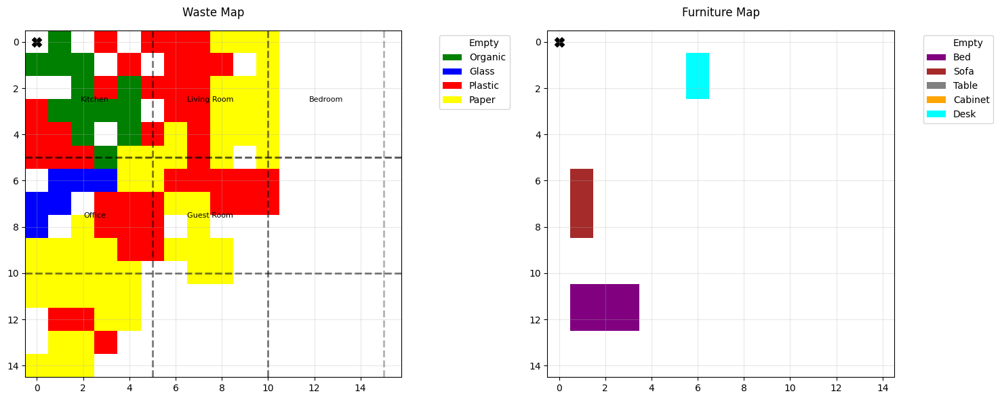

Step 2: Reward = 31.998, Total = 63.997


<Figure size 1500x1800 with 0 Axes>

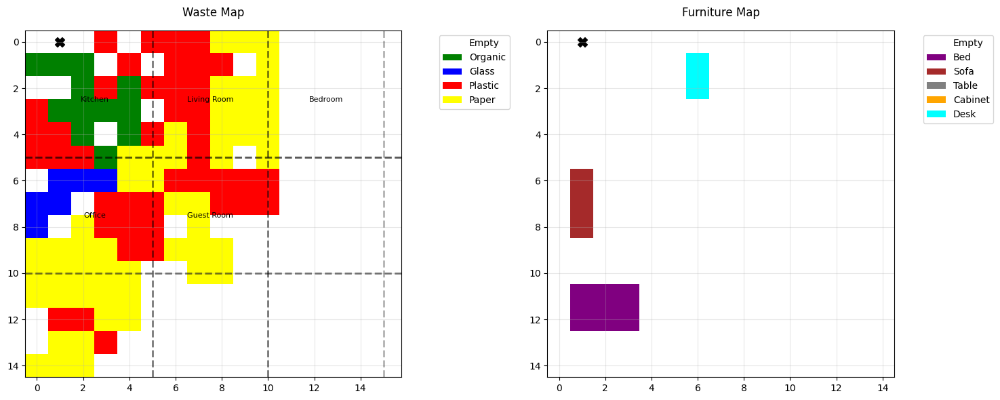

Step 3: Reward = 1.497, Total = 65.494


<Figure size 1500x1800 with 0 Axes>

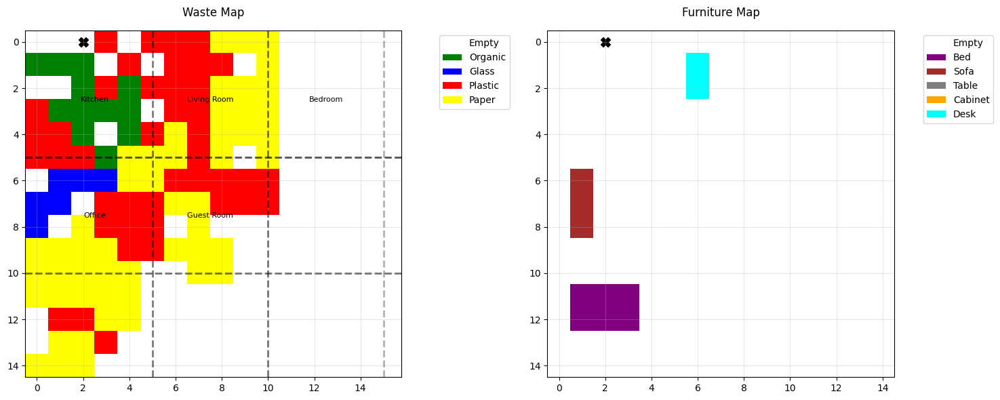

Step 4: Reward = 1.496, Total = 66.99


<Figure size 1500x1800 with 0 Axes>

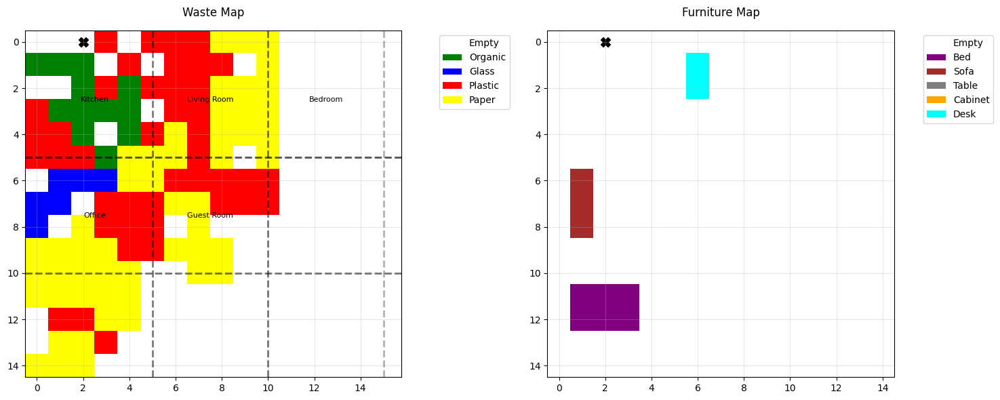

Step 5: Reward = 1.495, Total = 68.485


<Figure size 1500x1800 with 0 Axes>

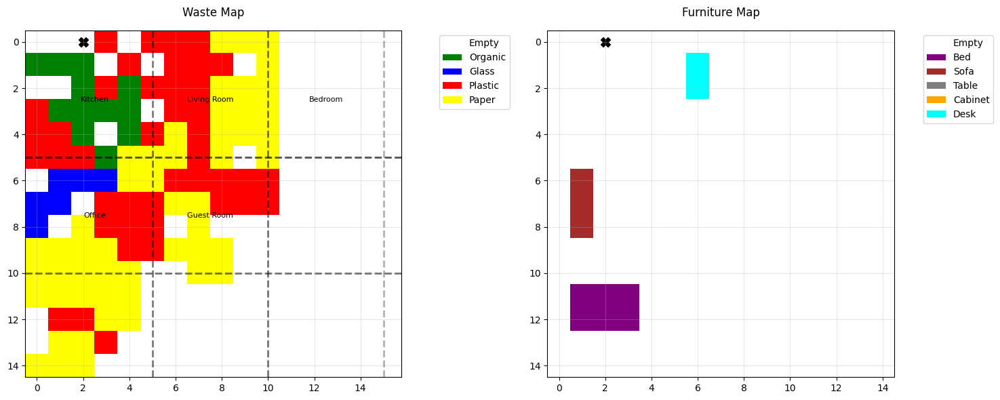

Step 6: Reward = 1.494, Total = 69.979


<Figure size 1500x1800 with 0 Axes>

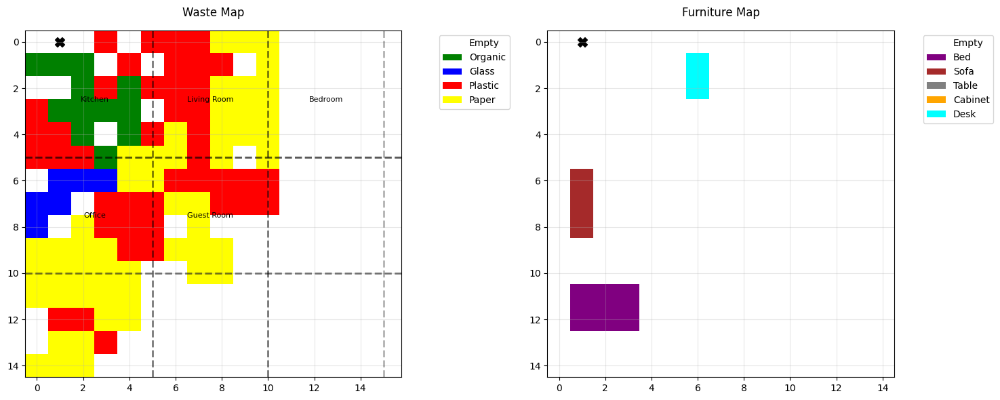

Step 7: Reward = 31.993, Total = 101.972


<Figure size 1500x1800 with 0 Axes>

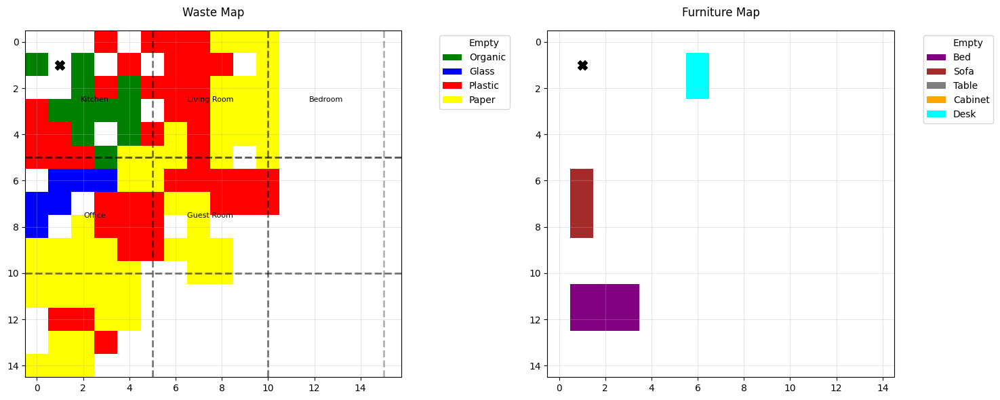

Step 8: Reward = 31.992, Total = 133.964


<Figure size 1500x1800 with 0 Axes>

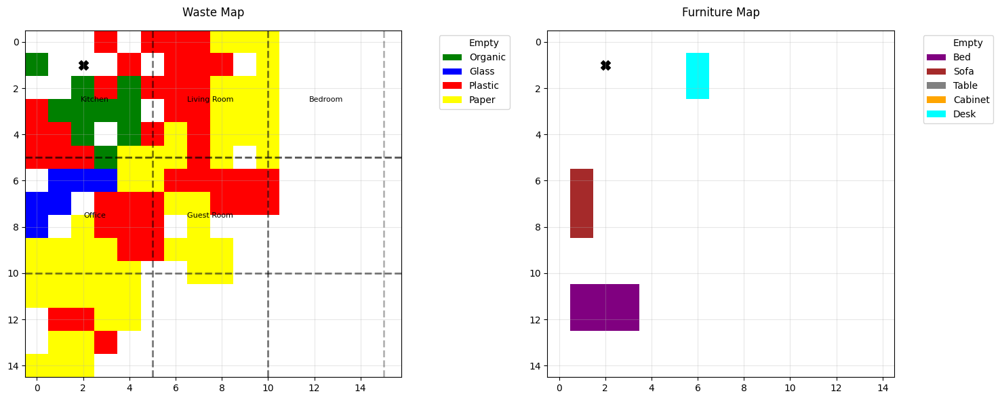

Step 9: Reward = 0.491, Total = 134.455


<Figure size 1500x1800 with 0 Axes>

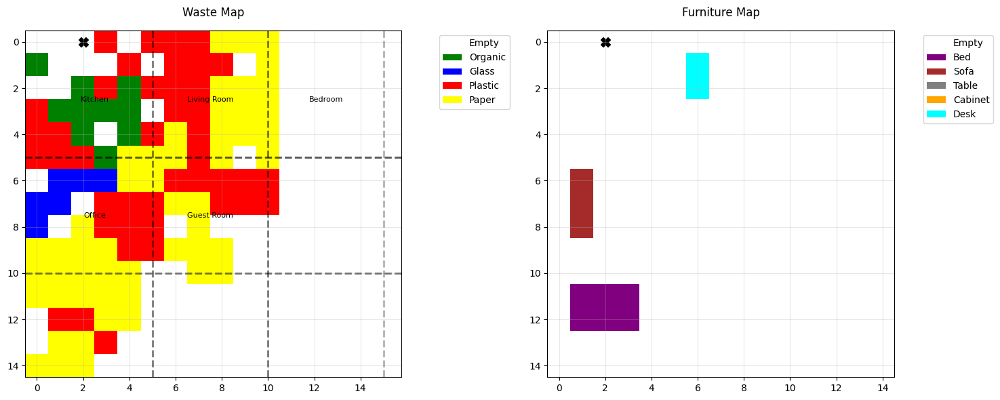

Step 10: Reward = 0.49, Total = 134.94500000000002


<Figure size 1500x1800 with 0 Axes>

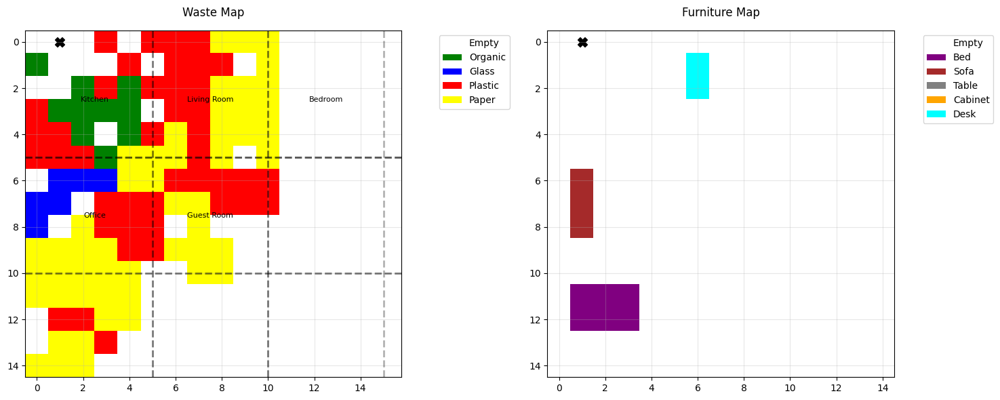

Step 11: Reward = 0.489, Total = 135.43400000000003


<Figure size 1500x1800 with 0 Axes>

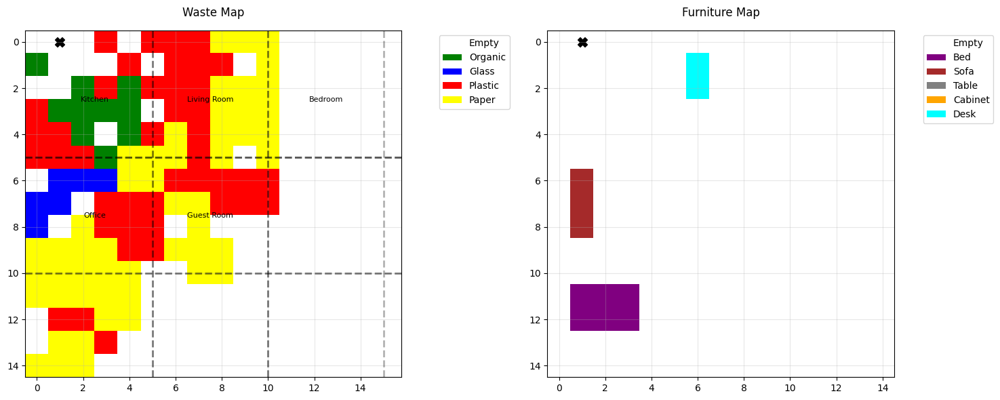

Step 12: Reward = 0.988, Total = 136.42200000000003


<Figure size 1500x1800 with 0 Axes>

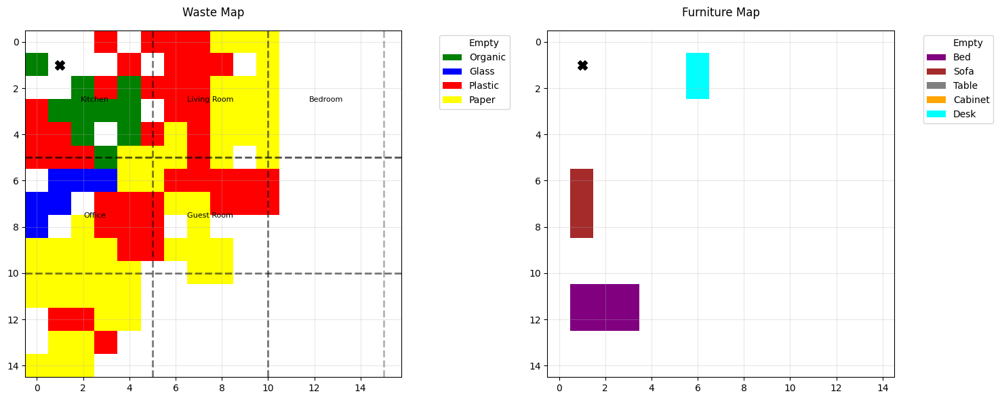

Step 13: Reward = 0.487, Total = 136.90900000000002


<Figure size 1500x1800 with 0 Axes>

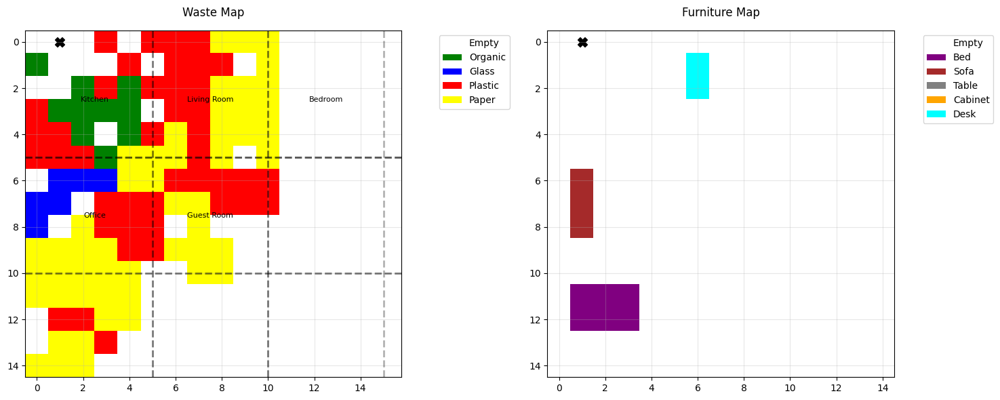

Step 14: Reward = 0.486, Total = 137.395


<Figure size 1500x1800 with 0 Axes>

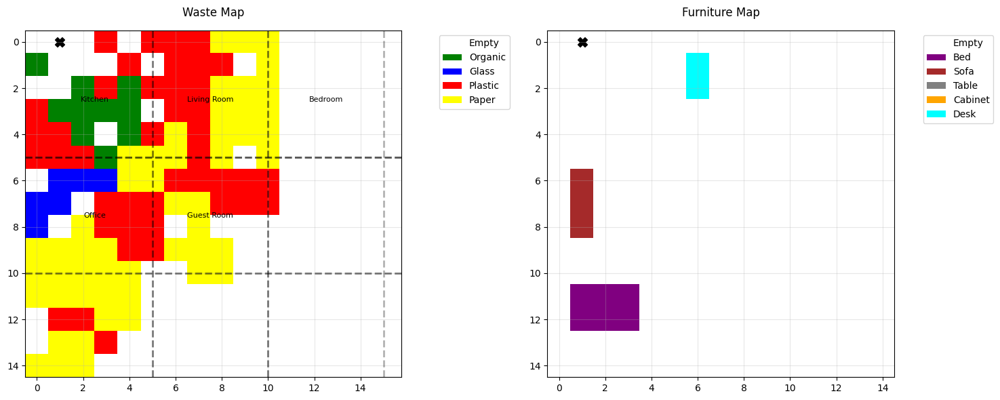

Step 15: Reward = 0.985, Total = 138.38000000000002


<Figure size 1500x1800 with 0 Axes>

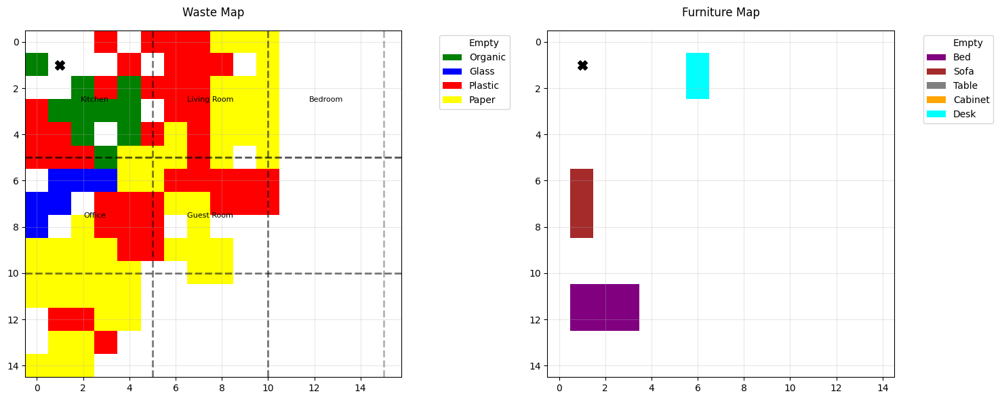

Step 16: Reward = 0.484, Total = 138.86400000000003


<Figure size 1500x1800 with 0 Axes>

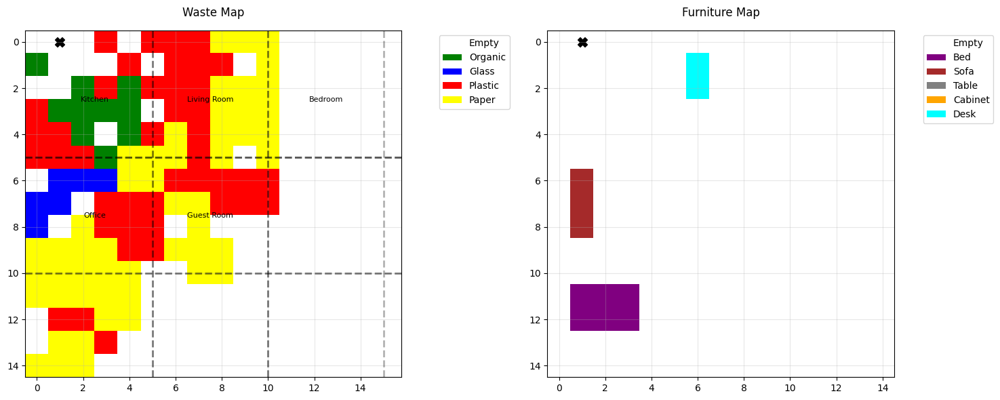

Step 17: Reward = 0.483, Total = 139.34700000000004


<Figure size 1500x1800 with 0 Axes>

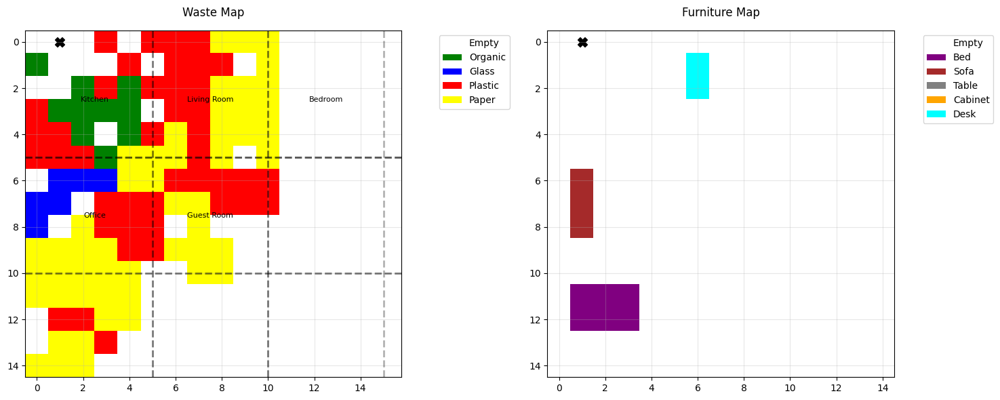

Step 18: Reward = 0.482, Total = 139.82900000000004


<Figure size 1500x1800 with 0 Axes>

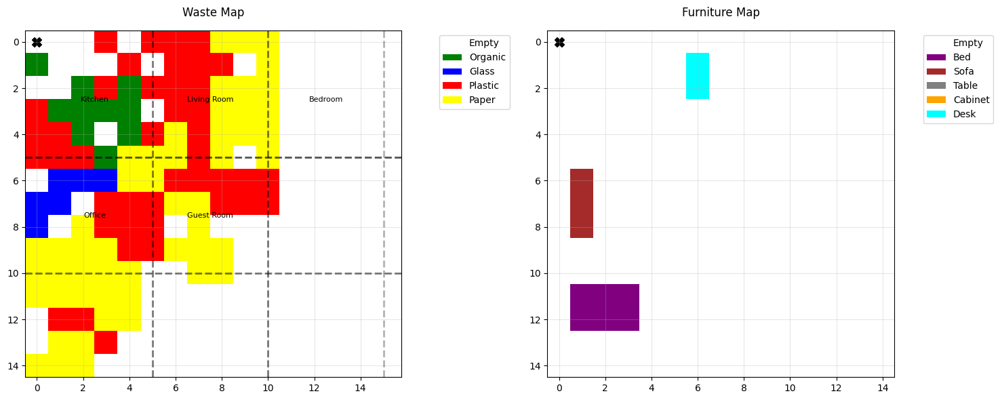

Step 19: Reward = 0.481, Total = 140.31000000000003


<Figure size 1500x1800 with 0 Axes>

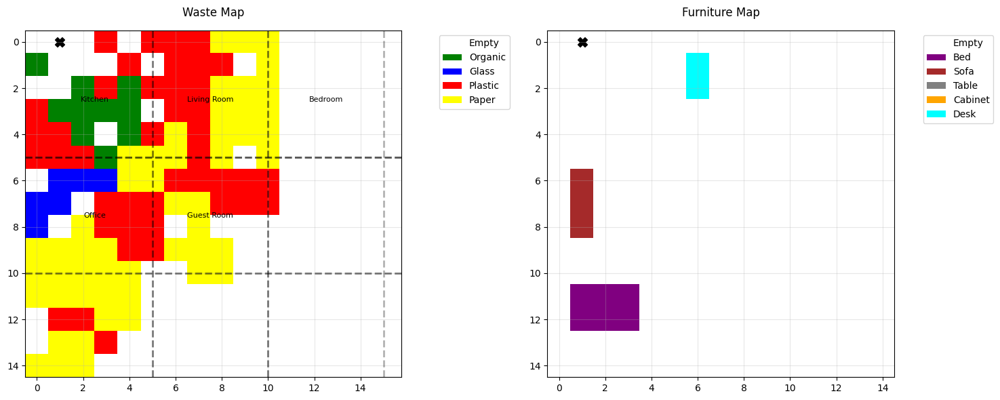

Step 20: Reward = 0.98, Total = 141.29000000000002


<Figure size 1500x1800 with 0 Axes>

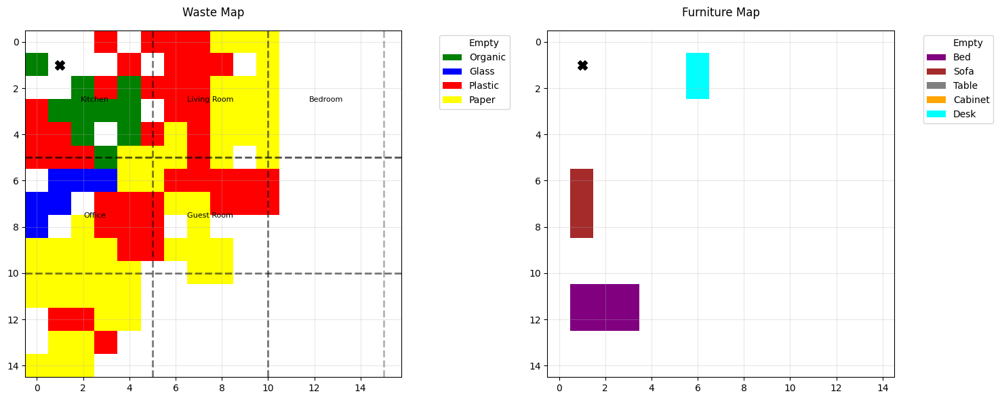

Step 21: Reward = 1.479, Total = 142.76900000000003


<Figure size 1500x1800 with 0 Axes>

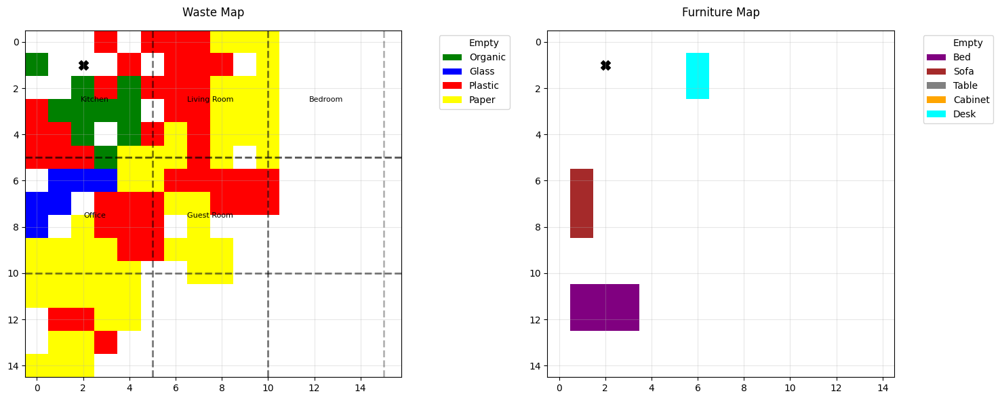

Step 22: Reward = 0.978, Total = 143.74700000000004


<Figure size 1500x1800 with 0 Axes>

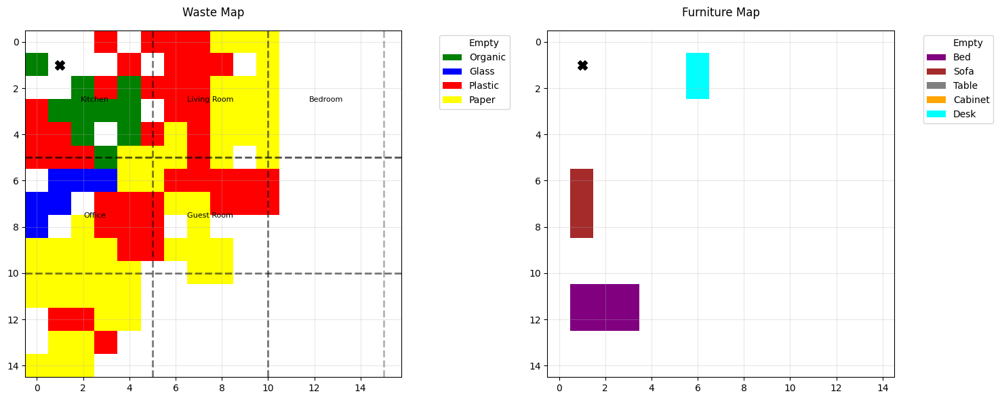

Step 23: Reward = 0.477, Total = 144.22400000000005


<Figure size 1500x1800 with 0 Axes>

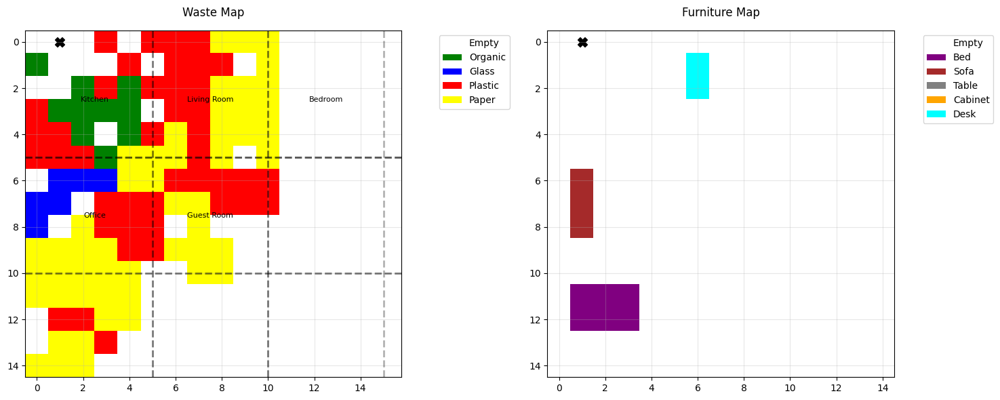

Step 24: Reward = 0.476, Total = 144.70000000000005


<Figure size 1500x1800 with 0 Axes>

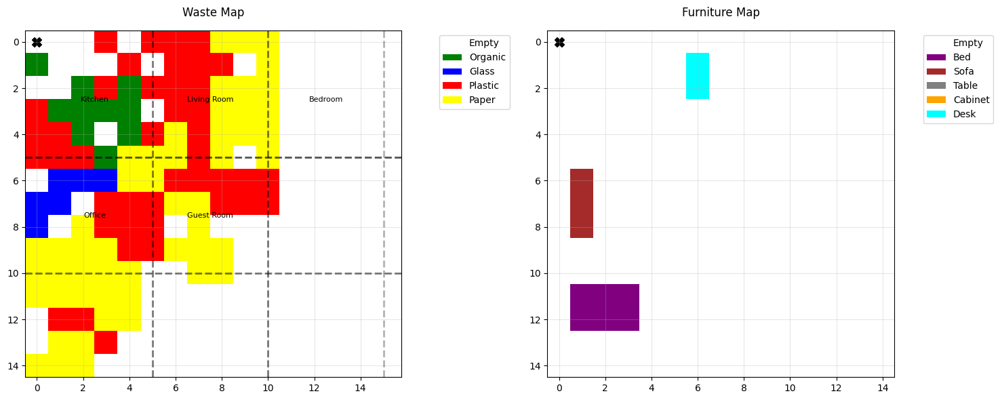

Step 25: Reward = 0.475, Total = 145.17500000000004


<Figure size 1500x1800 with 0 Axes>

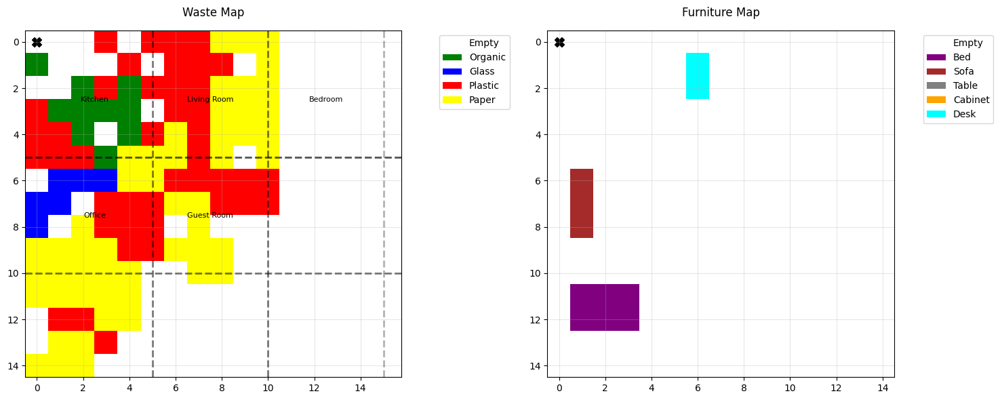

Step 26: Reward = 0.474, Total = 145.64900000000003


<Figure size 1500x1800 with 0 Axes>

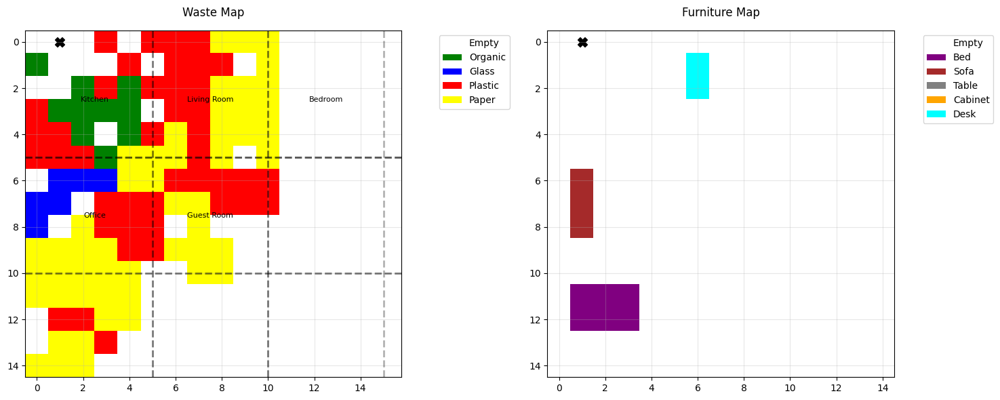

Step 27: Reward = 0.473, Total = 146.12200000000004


<Figure size 1500x1800 with 0 Axes>

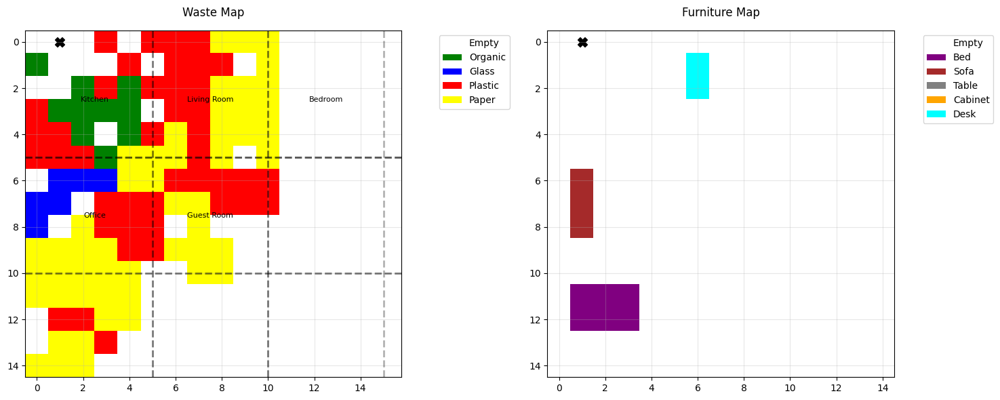

Step 28: Reward = 0.972, Total = 147.09400000000005


<Figure size 1500x1800 with 0 Axes>

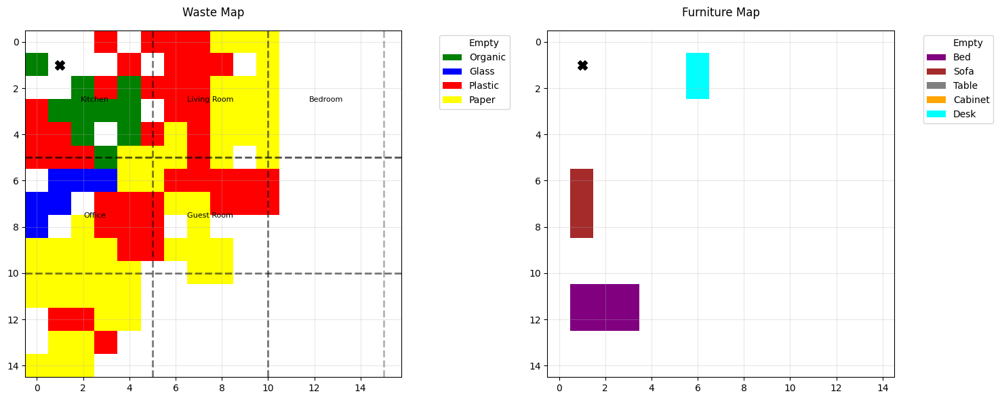

Step 29: Reward = 30.471, Total = 177.56500000000005


<Figure size 1500x1800 with 0 Axes>

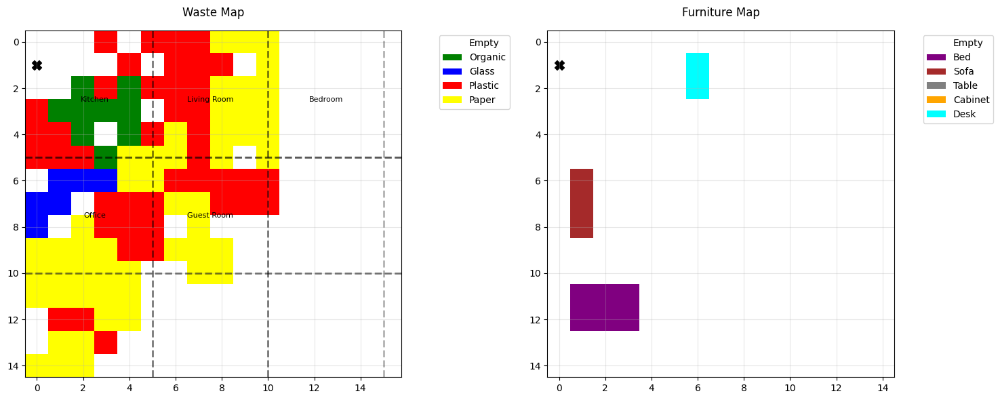

Step 30: Reward = 0.97, Total = 178.53500000000005


<Figure size 1500x1800 with 0 Axes>

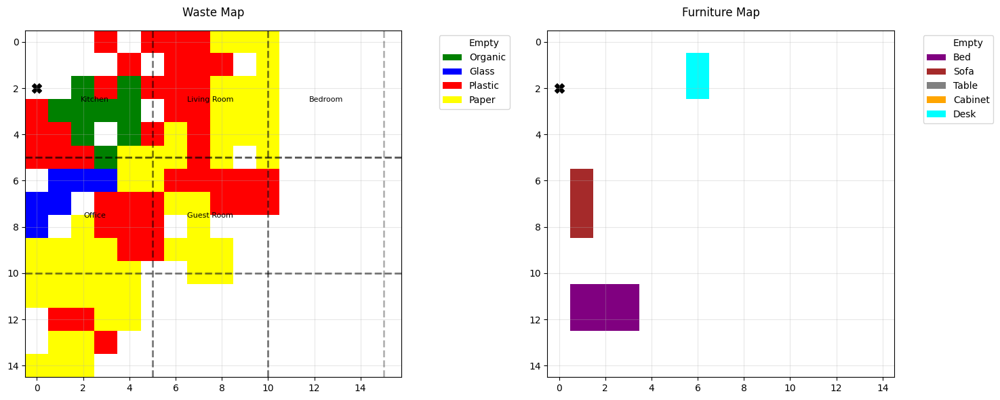

Step 31: Reward = 26.969, Total = 205.50400000000005


<Figure size 1500x1800 with 0 Axes>

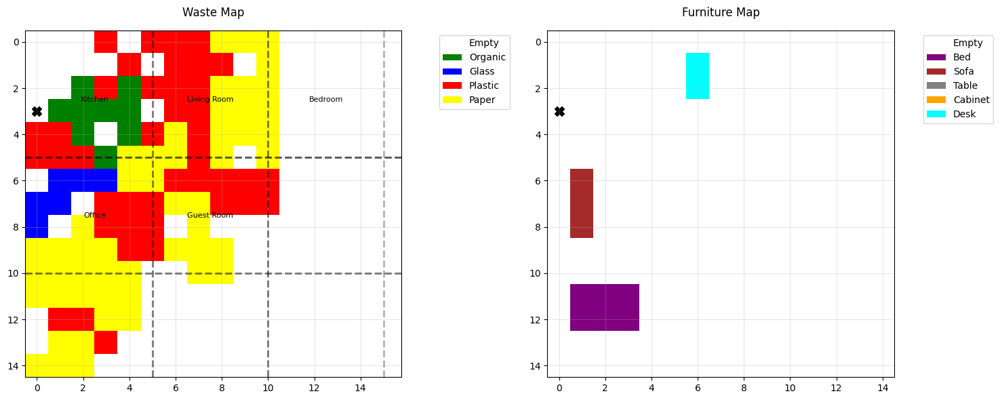

Step 32: Reward = 0.46799999999999997, Total = 205.97200000000004


<Figure size 1500x1800 with 0 Axes>

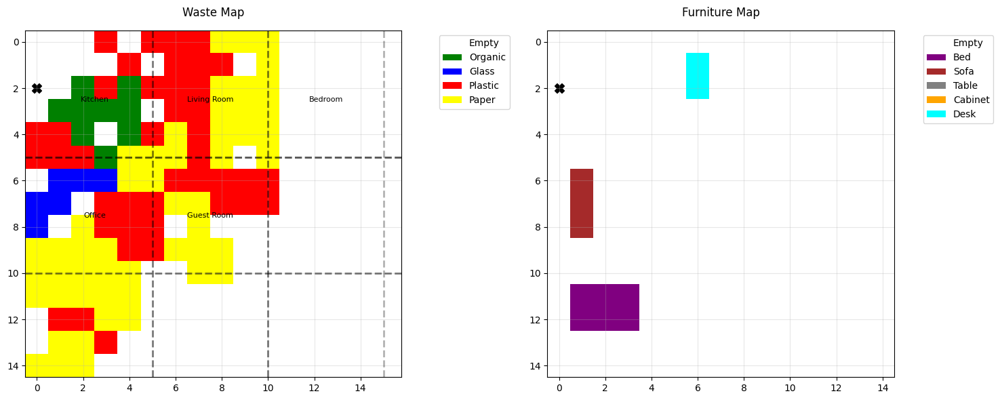

Step 33: Reward = 1.467, Total = 207.43900000000005


<Figure size 1500x1800 with 0 Axes>

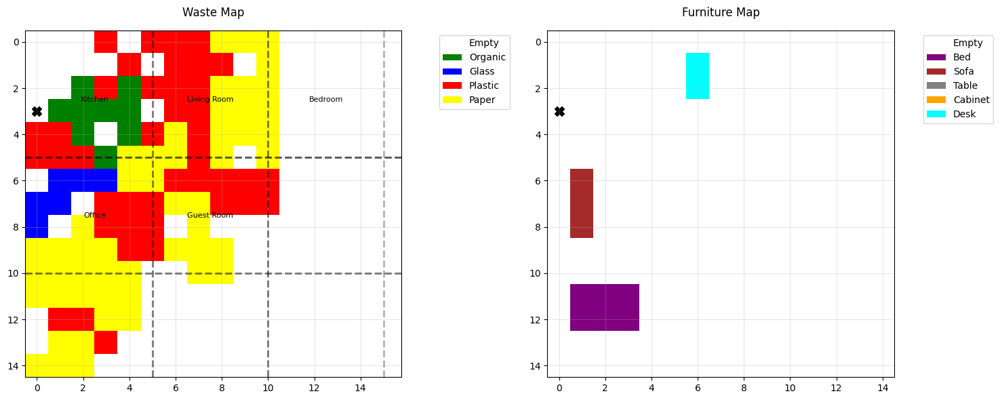

Step 34: Reward = 1.466, Total = 208.90500000000006


<Figure size 1500x1800 with 0 Axes>

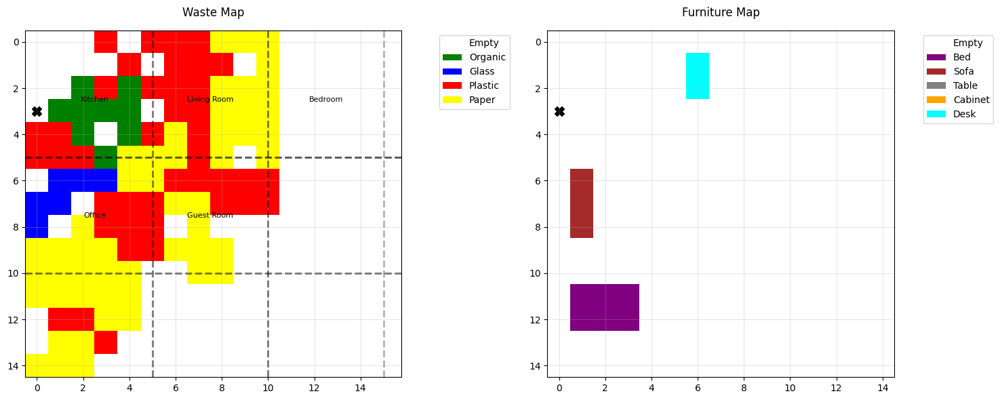

Step 35: Reward = 27.465, Total = 236.37000000000006


<Figure size 1500x1800 with 0 Axes>

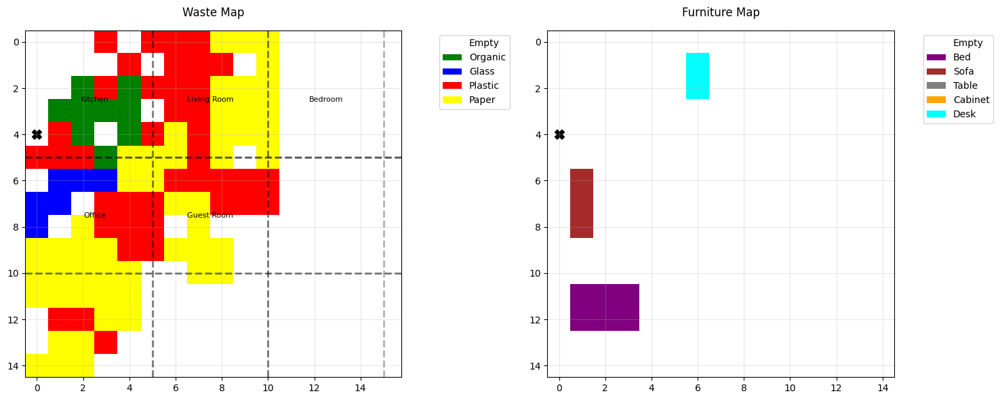

Step 36: Reward = 26.964, Total = 263.33400000000006


<Figure size 1500x1800 with 0 Axes>

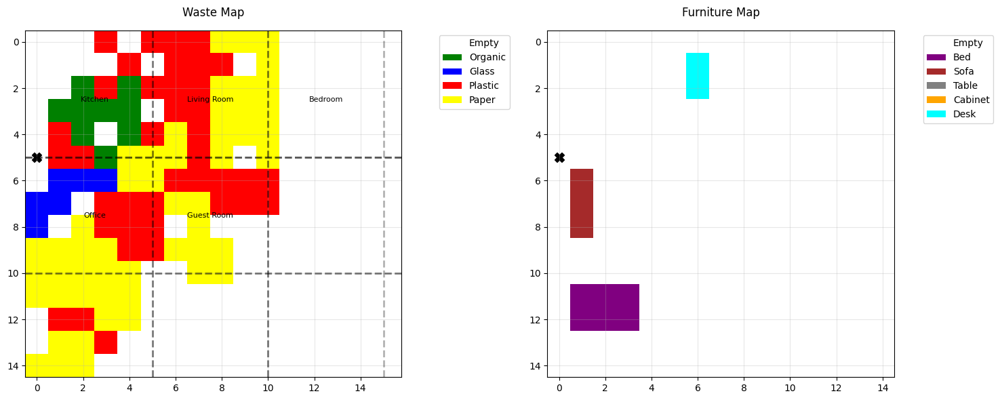

Step 37: Reward = 1.463, Total = 264.7970000000001


<Figure size 1500x1800 with 0 Axes>

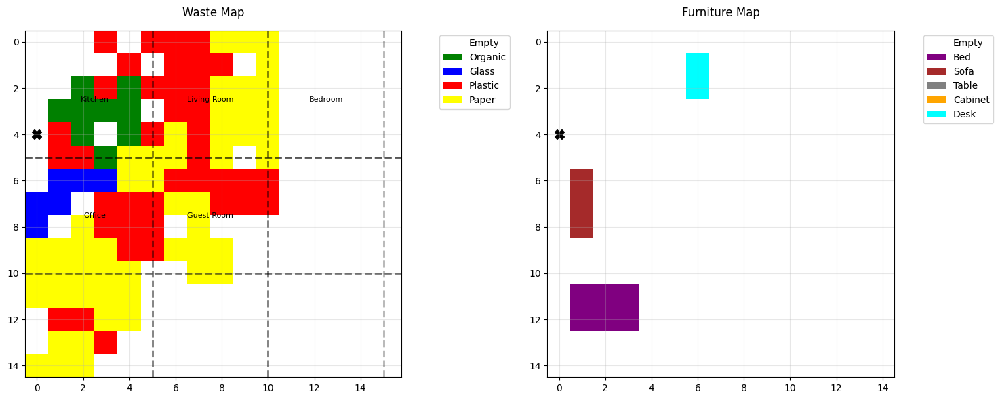

Step 38: Reward = 0.962, Total = 265.75900000000007


<Figure size 1500x1800 with 0 Axes>

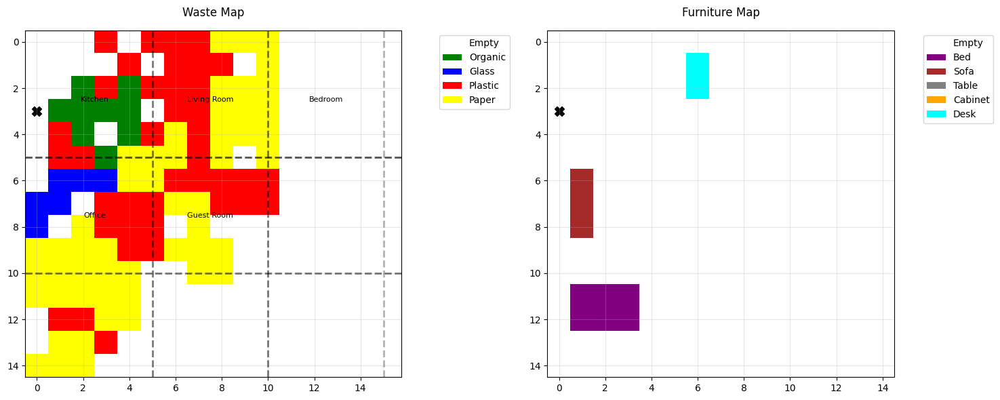

Step 39: Reward = 0.961, Total = 266.7200000000001


<Figure size 1500x1800 with 0 Axes>

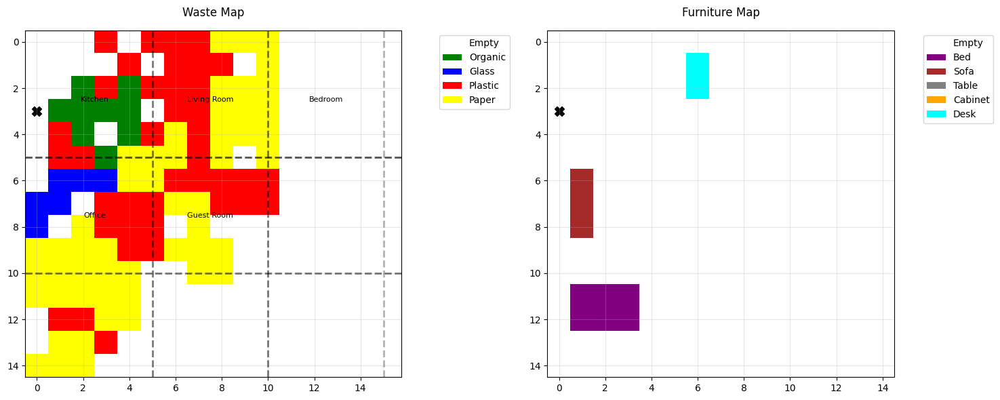

Step 40: Reward = 32.46, Total = 299.18000000000006


<Figure size 1500x1800 with 0 Axes>

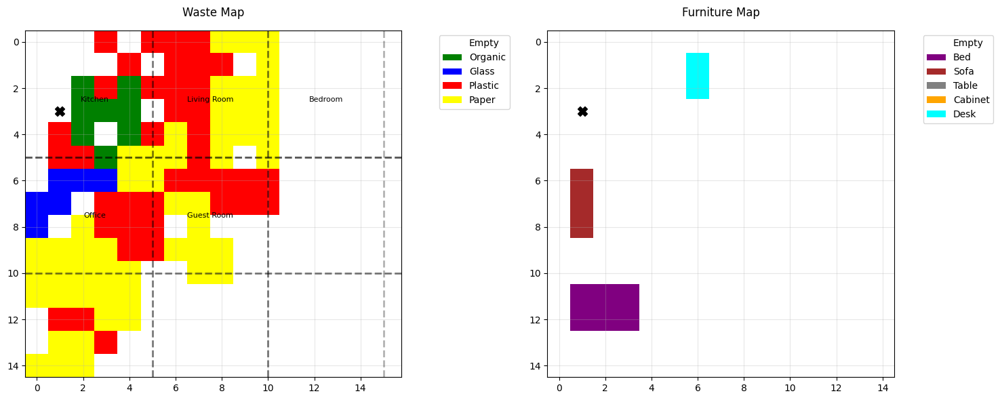

Step 41: Reward = 27.459, Total = 326.63900000000007


<Figure size 1500x1800 with 0 Axes>

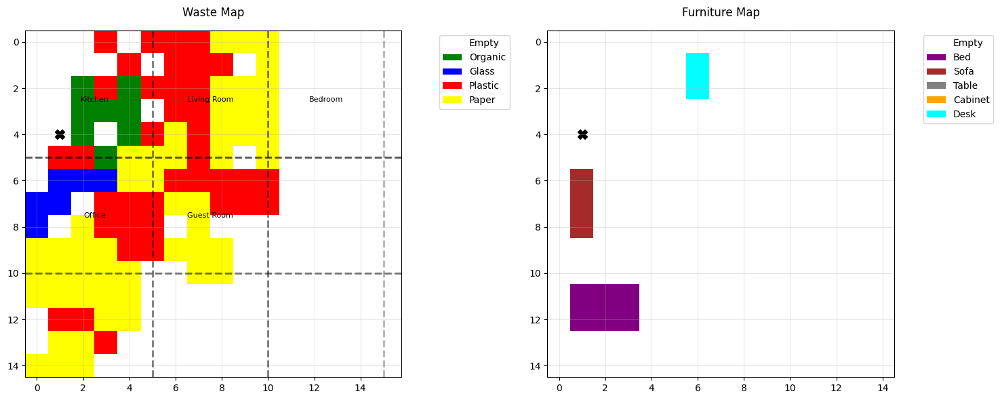

Step 42: Reward = 27.458, Total = 354.0970000000001


<Figure size 1500x1800 with 0 Axes>

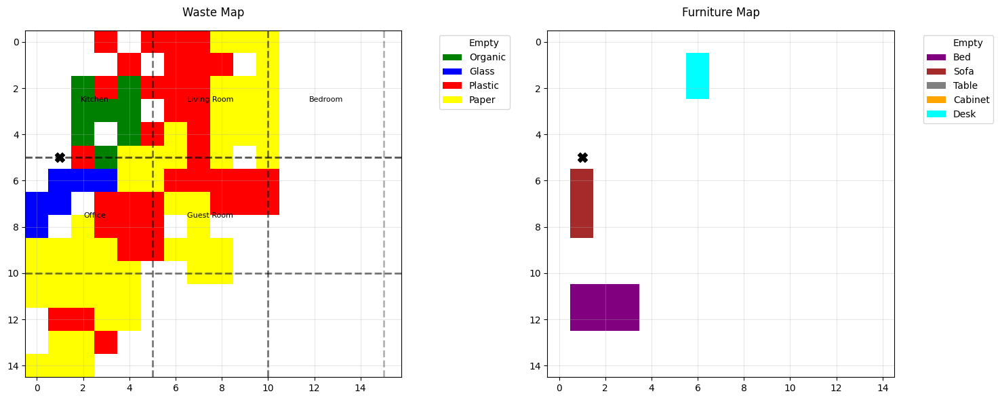

Step 43: Reward = 1.457, Total = 355.5540000000001


<Figure size 1500x1800 with 0 Axes>

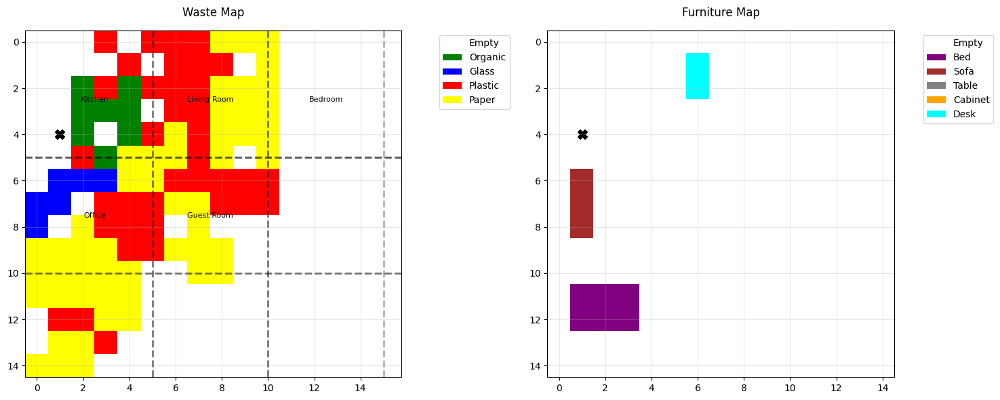

Step 44: Reward = 1.956, Total = 357.5100000000001


<Figure size 1500x1800 with 0 Axes>

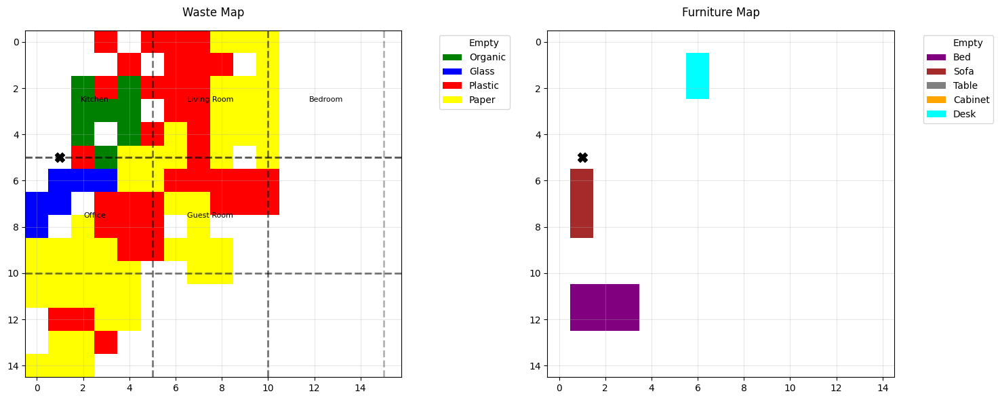

Step 45: Reward = -2, Total = 355.5100000000001


<Figure size 1500x1800 with 0 Axes>

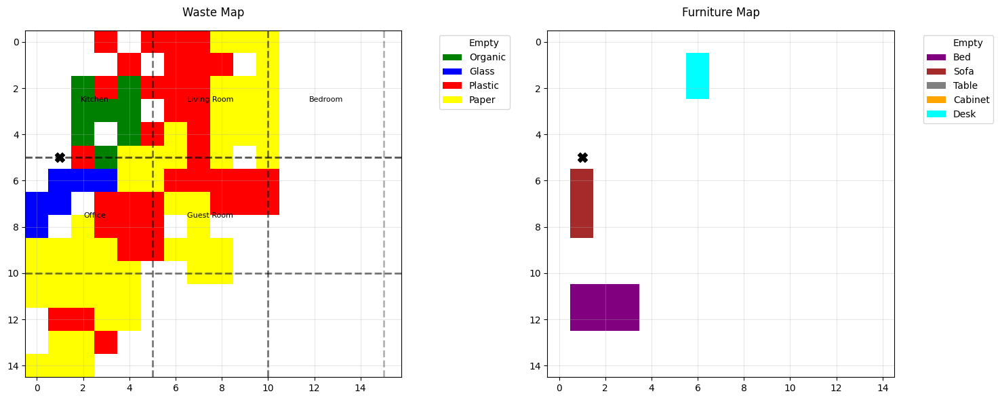

Step 46: Reward = 27.954, Total = 383.4640000000001


<Figure size 1500x1800 with 0 Axes>

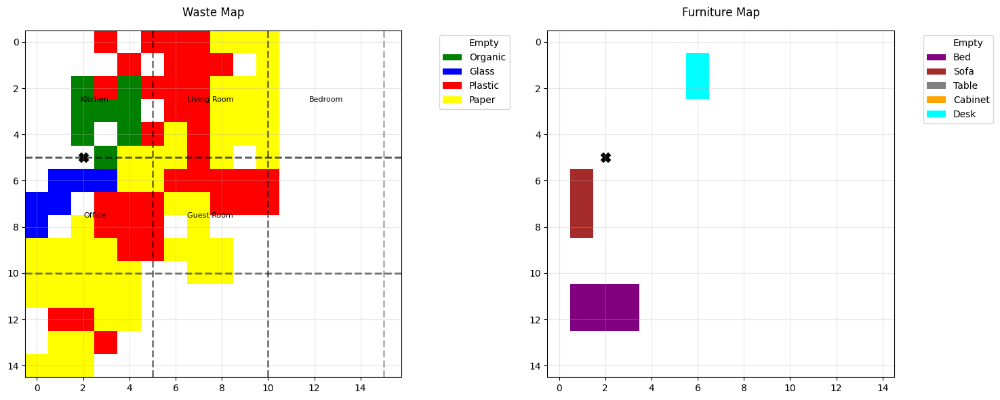

Step 47: Reward = 33.453, Total = 416.91700000000014


<Figure size 1500x1800 with 0 Axes>

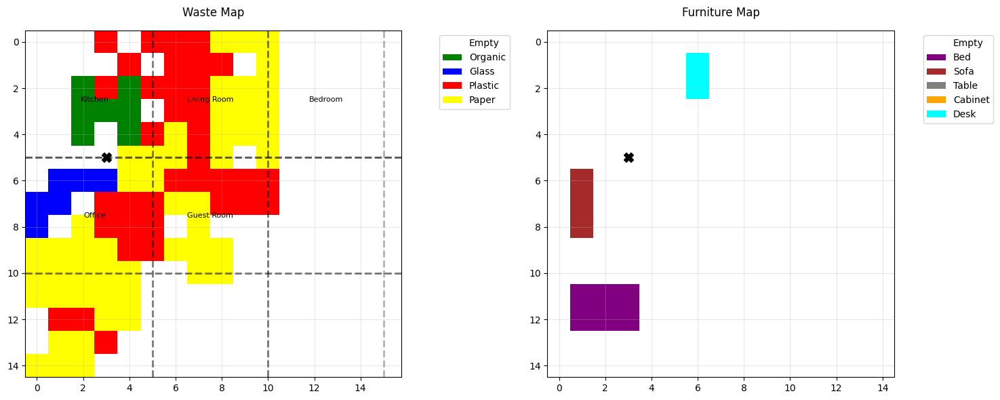

Step 48: Reward = 23.451999999999998, Total = 440.36900000000014


<Figure size 1500x1800 with 0 Axes>

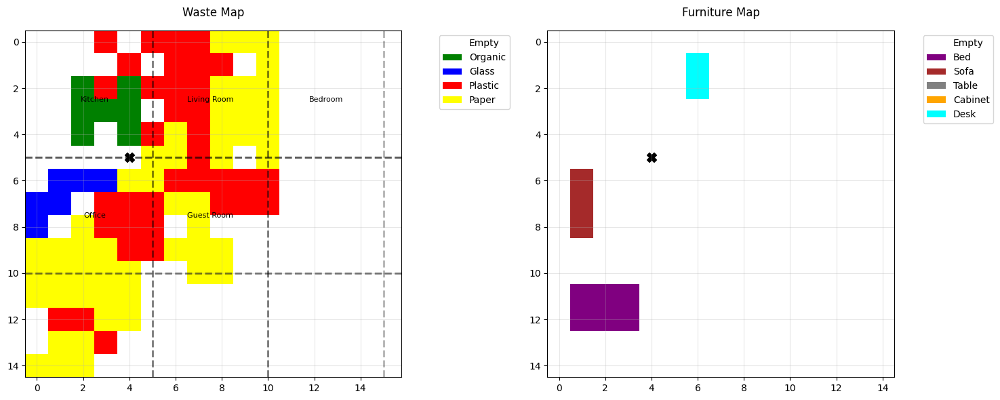

Step 49: Reward = 23.451, Total = 463.82000000000016


<Figure size 1500x1800 with 0 Axes>

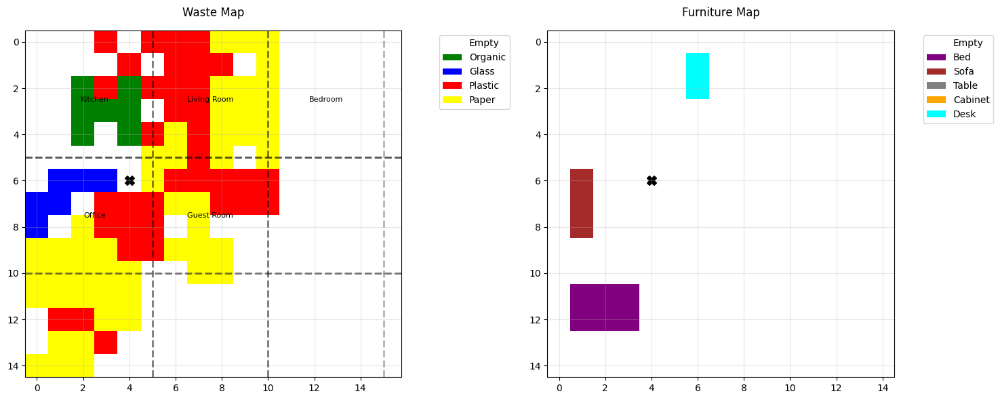

Step 50: Reward = 28.95, Total = 492.77000000000015


<Figure size 1500x1800 with 0 Axes>

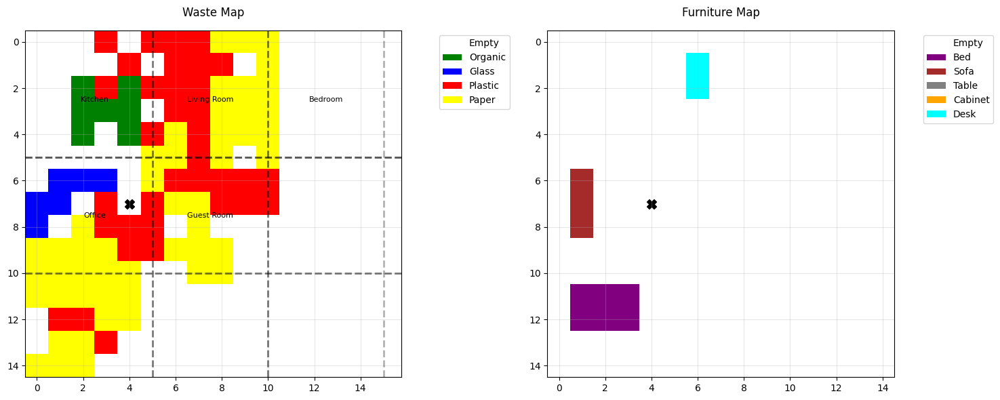

Step 51: Reward = 27.949, Total = 520.7190000000002


<Figure size 1500x1800 with 0 Axes>

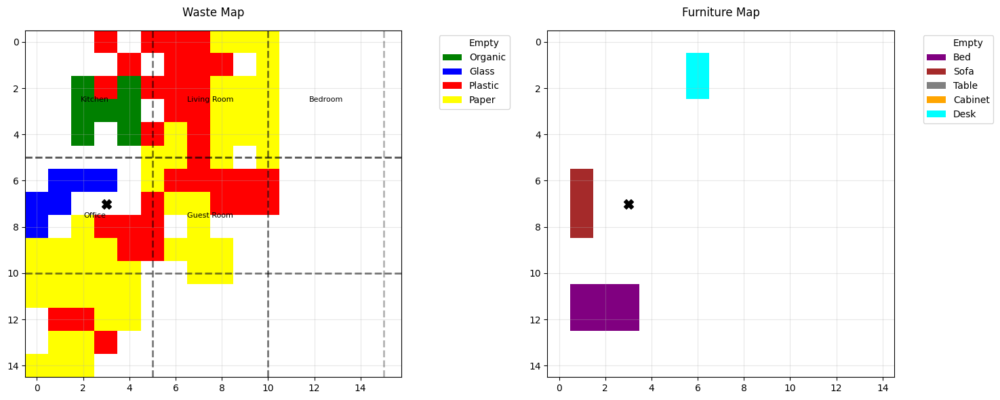

Step 52: Reward = 27.948, Total = 548.6670000000001


<Figure size 1500x1800 with 0 Axes>

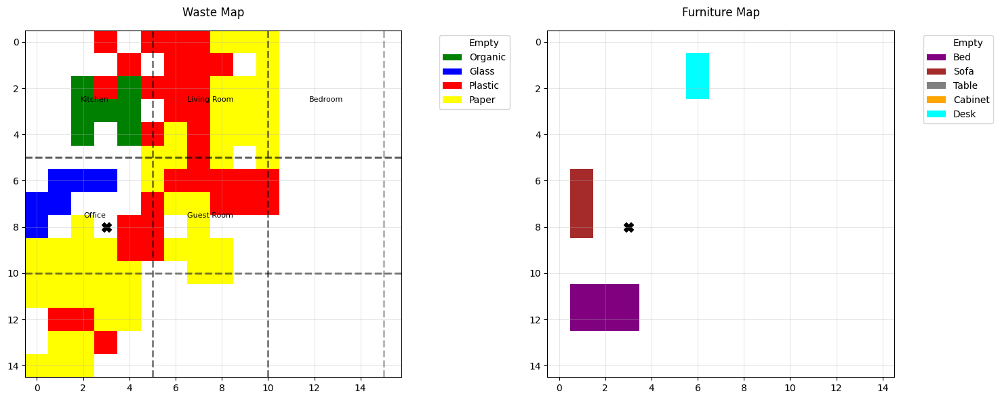

Step 53: Reward = 22.447, Total = 571.1140000000001


<Figure size 1500x1800 with 0 Axes>

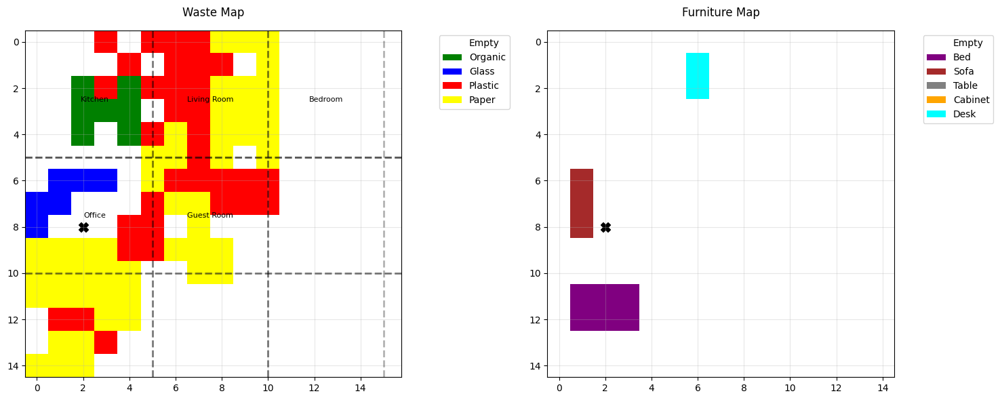

Step 54: Reward = 22.945999999999998, Total = 594.0600000000002


<Figure size 1500x1800 with 0 Axes>

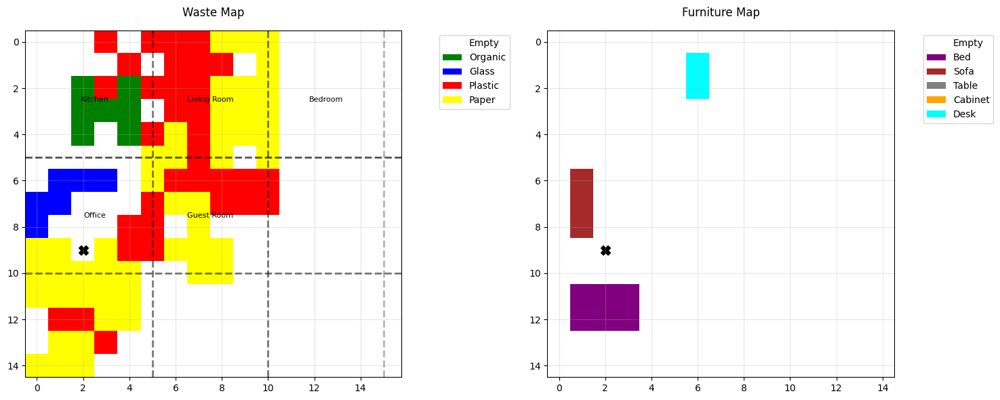

Step 55: Reward = 23.945, Total = 618.0050000000002


<Figure size 1500x1800 with 0 Axes>

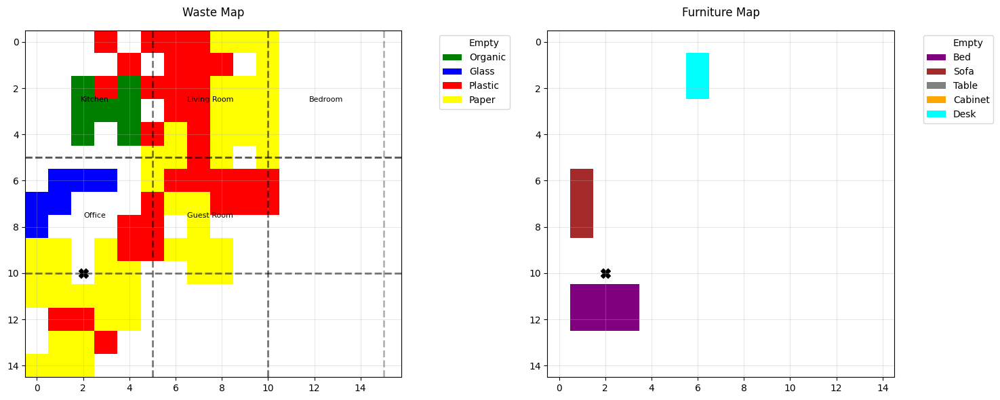

Step 56: Reward = -2, Total = 616.0050000000002


<Figure size 1500x1800 with 0 Axes>

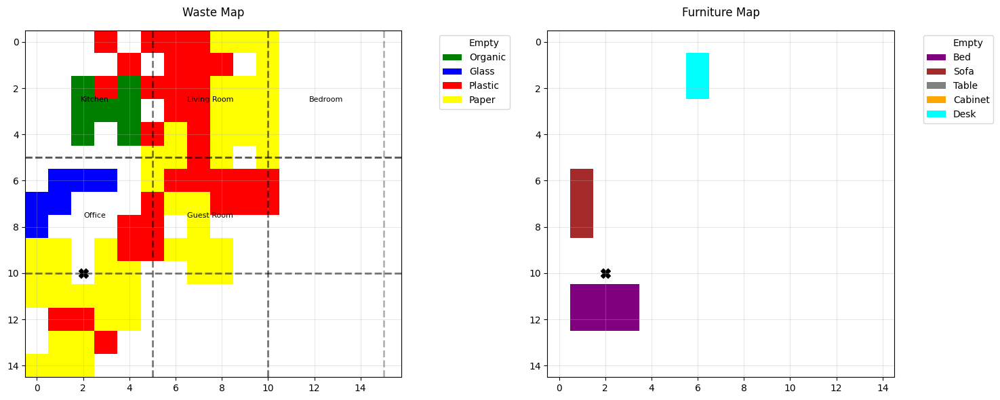

Step 57: Reward = 23.442999999999998, Total = 639.4480000000002


<Figure size 1500x1800 with 0 Axes>

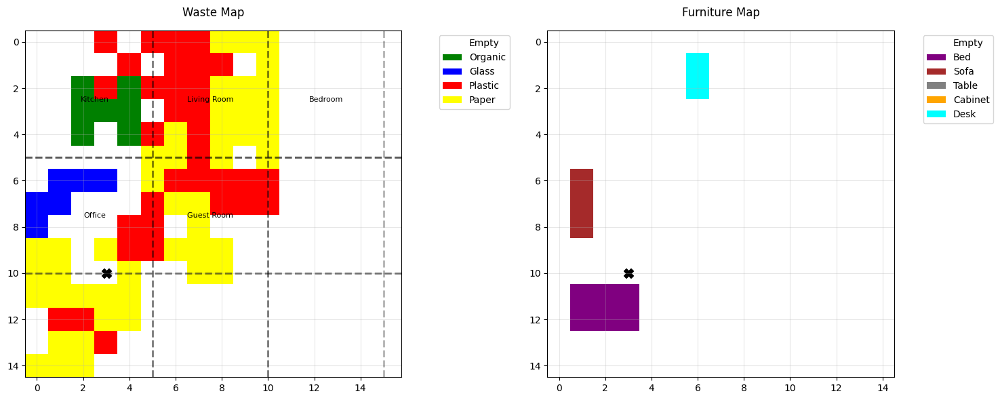

Step 58: Reward = -2, Total = 637.4480000000002


<Figure size 1500x1800 with 0 Axes>

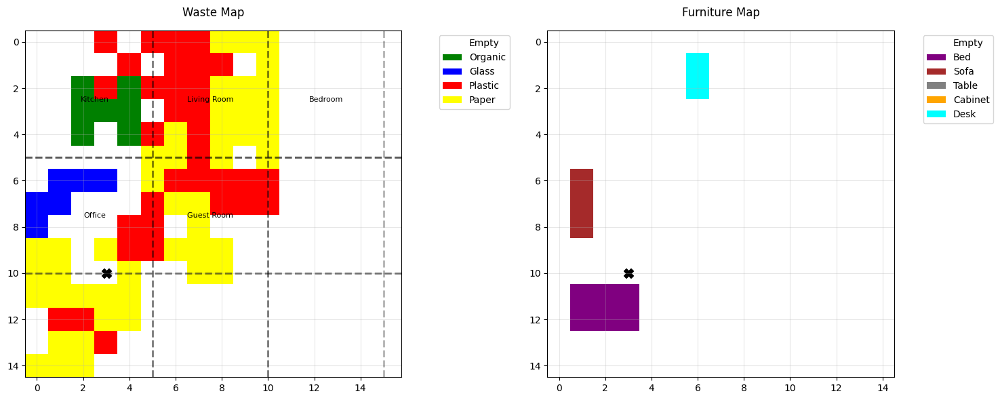

Step 59: Reward = 2.941, Total = 640.3890000000002


<Figure size 1500x1800 with 0 Axes>

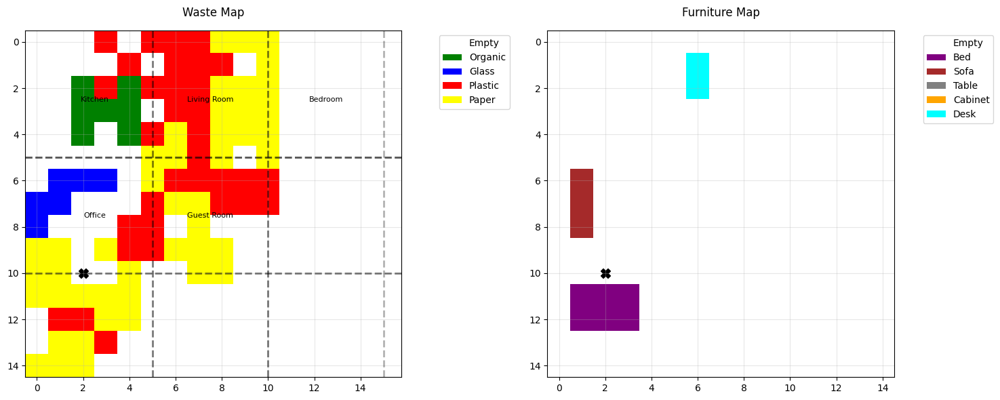

Step 60: Reward = 23.439999999999998, Total = 663.8290000000002


<Figure size 1500x1800 with 0 Axes>

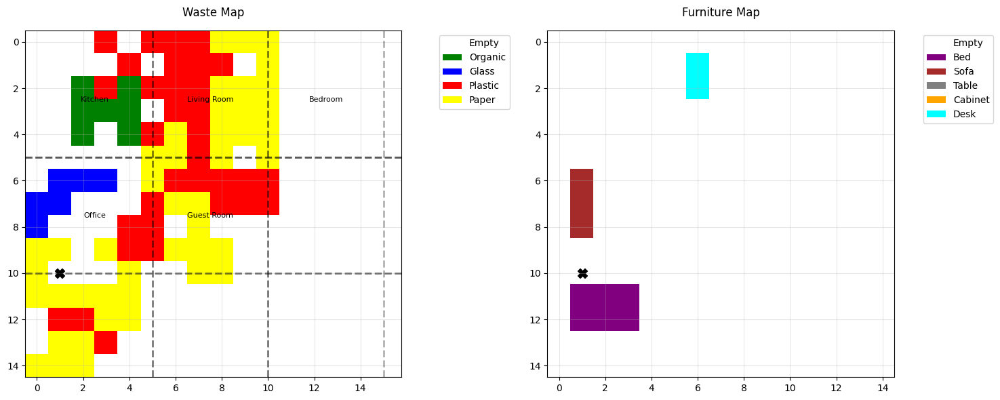

Step 61: Reward = 2.439, Total = 666.2680000000001


<Figure size 1500x1800 with 0 Axes>

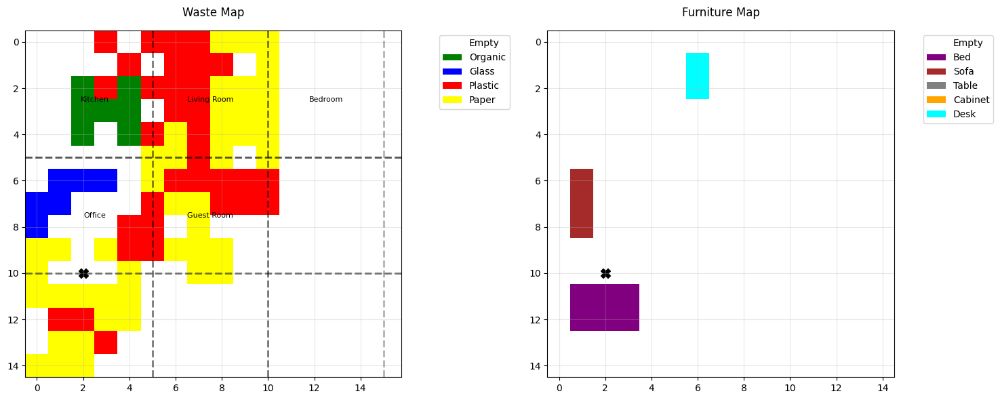

Step 62: Reward = 2.938, Total = 669.2060000000001


<Figure size 1500x1800 with 0 Axes>

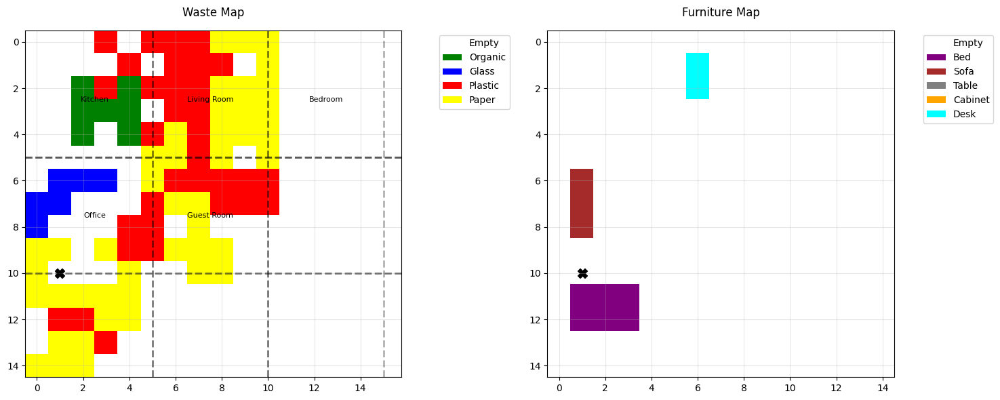

Step 63: Reward = 21.936999999999998, Total = 691.1430000000001


<Figure size 1500x1800 with 0 Axes>

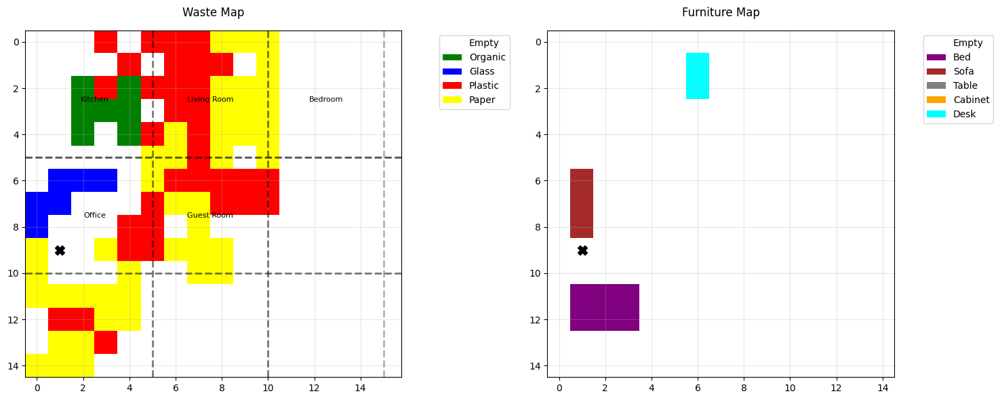

Step 64: Reward = 2.436, Total = 693.5790000000002


<Figure size 1500x1800 with 0 Axes>

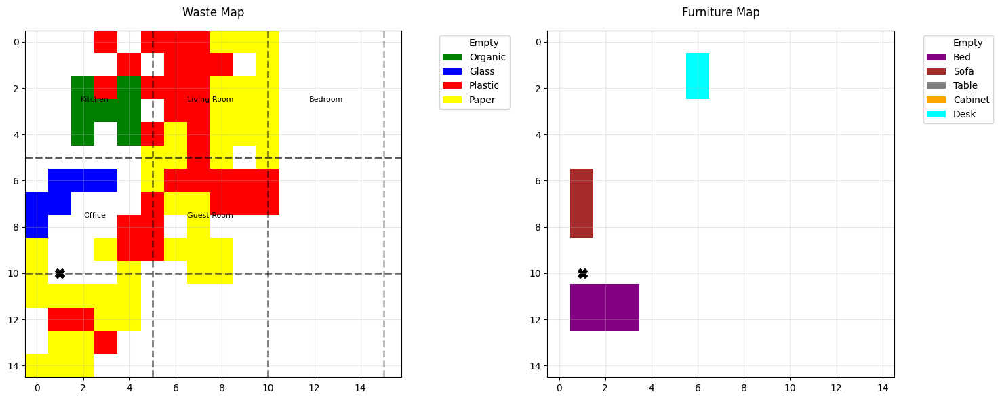

Step 65: Reward = 1.435, Total = 695.0140000000001


<Figure size 1500x1800 with 0 Axes>

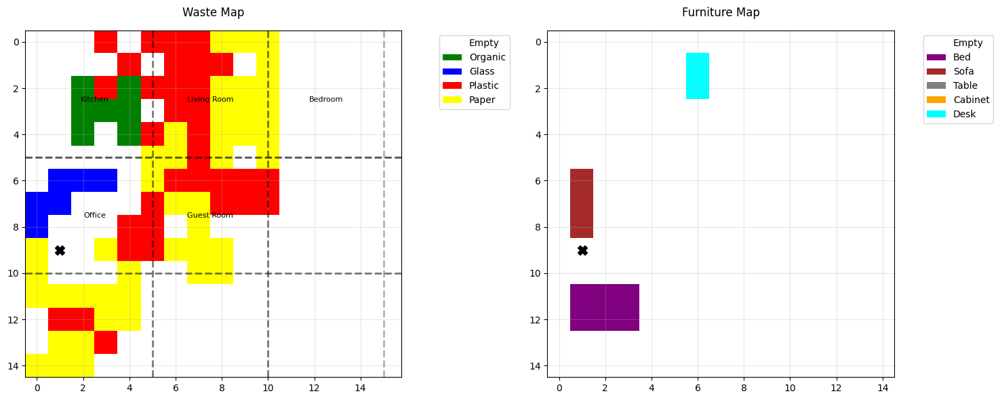

Step 66: Reward = 21.433999999999997, Total = 716.4480000000001


<Figure size 1500x1800 with 0 Axes>

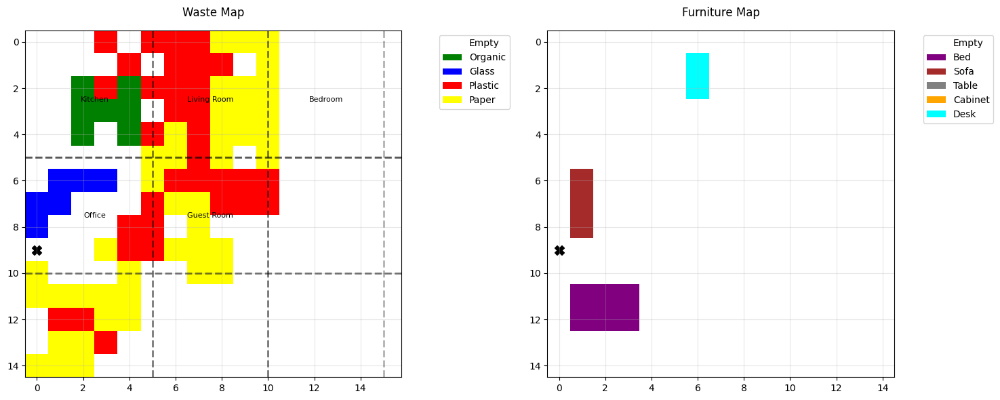

Step 67: Reward = 21.433, Total = 737.8810000000001


<Figure size 1500x1800 with 0 Axes>

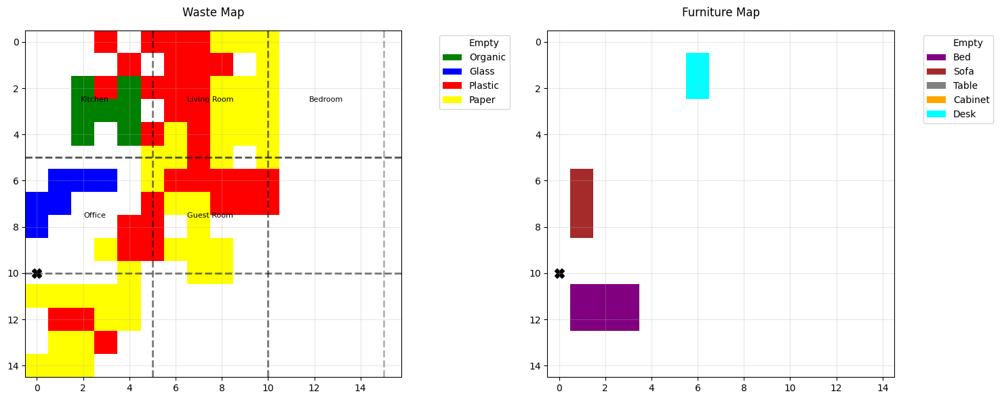

Step 68: Reward = 1.432, Total = 739.3130000000001


<Figure size 1500x1800 with 0 Axes>

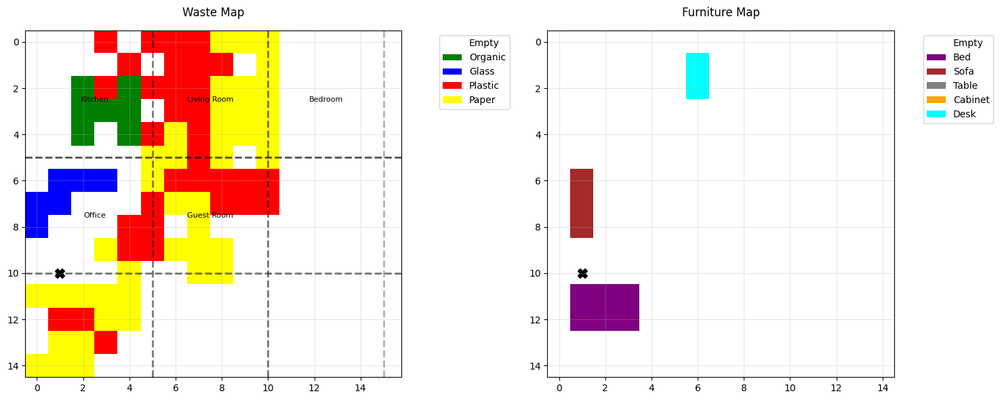

Step 69: Reward = 1.931, Total = 741.2440000000001


<Figure size 1500x1800 with 0 Axes>

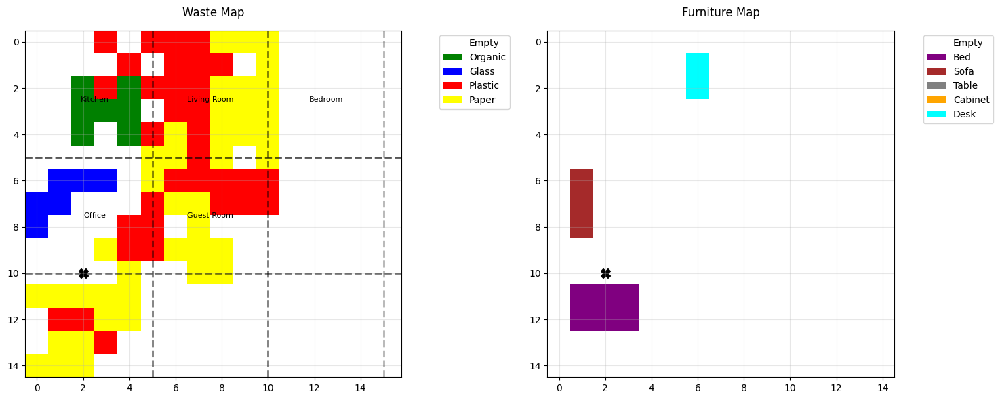

Step 70: Reward = -2, Total = 739.2440000000001


<Figure size 1500x1800 with 0 Axes>

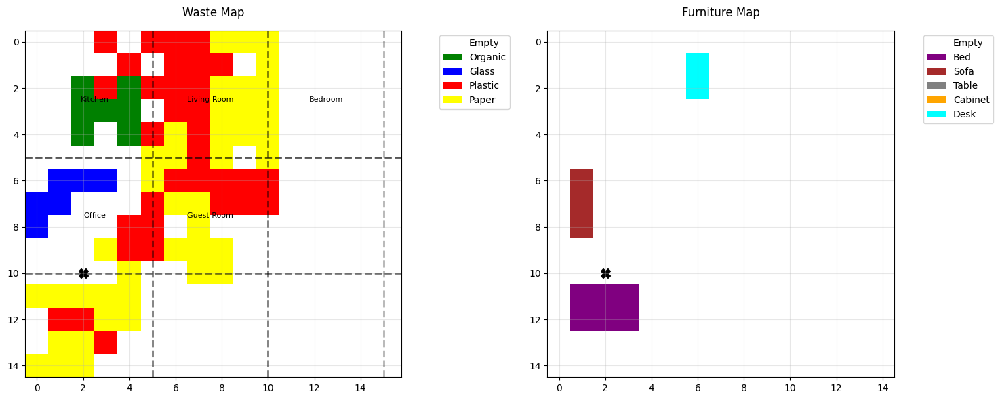

Step 71: Reward = 0.429, Total = 739.6730000000001


<Figure size 1500x1800 with 0 Axes>

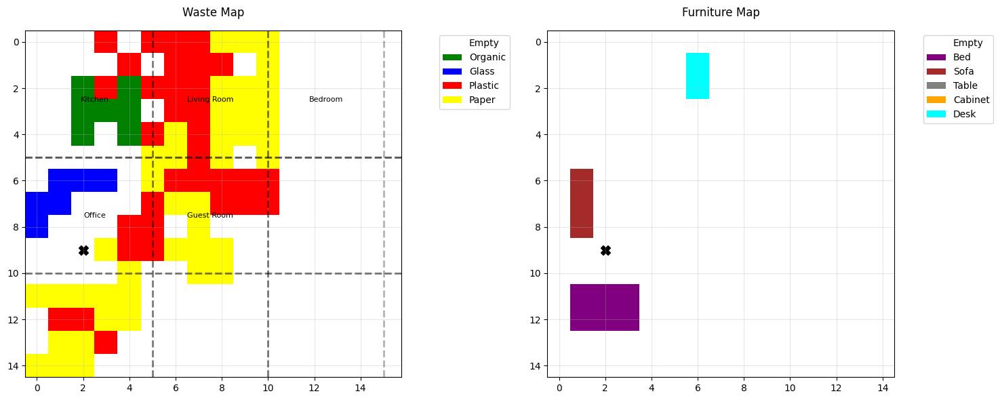

Step 72: Reward = 0.428, Total = 740.1010000000001


<Figure size 1500x1800 with 0 Axes>

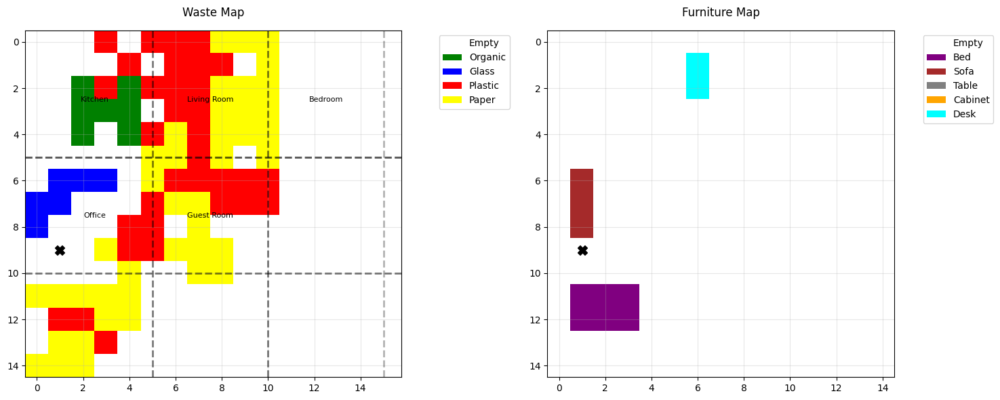

Step 73: Reward = -2, Total = 738.1010000000001


<Figure size 1500x1800 with 0 Axes>

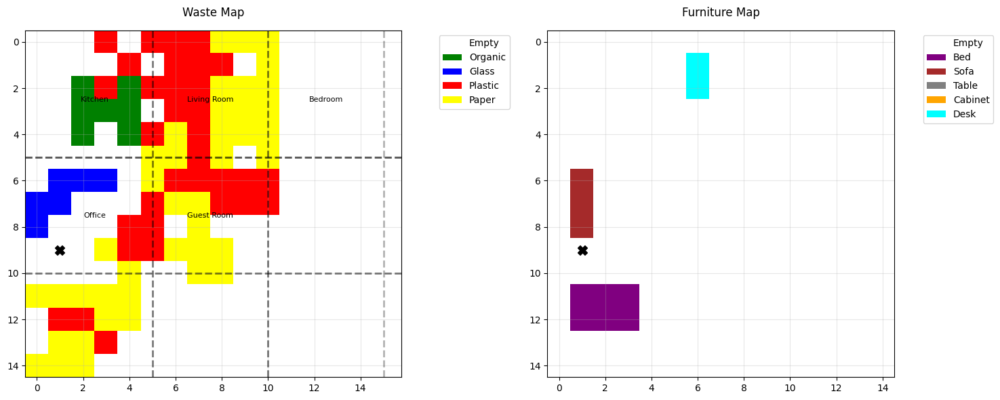

Step 74: Reward = 0.426, Total = 738.5270000000002


<Figure size 1500x1800 with 0 Axes>

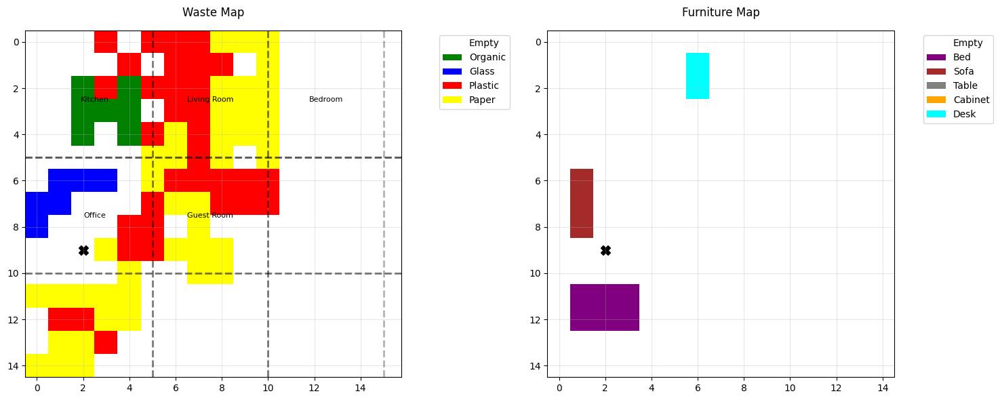

Step 75: Reward = 21.925, Total = 760.4520000000001


<Figure size 1500x1800 with 0 Axes>

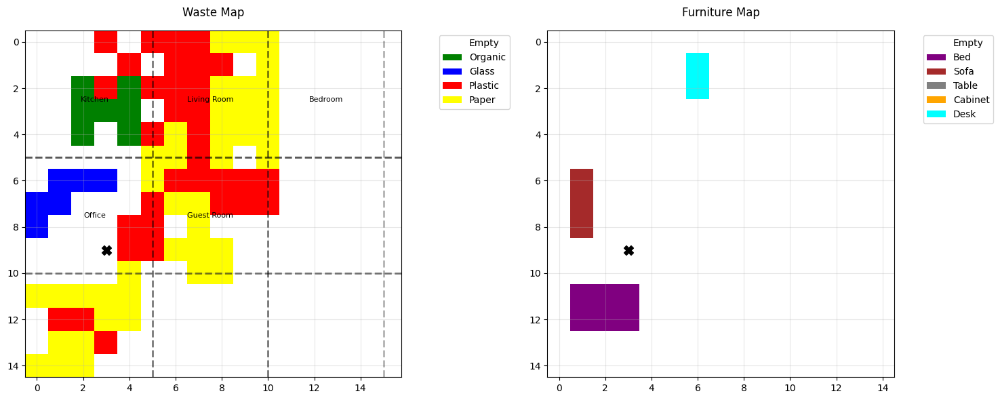

Step 76: Reward = 27.424, Total = 787.8760000000001


<Figure size 1500x1800 with 0 Axes>

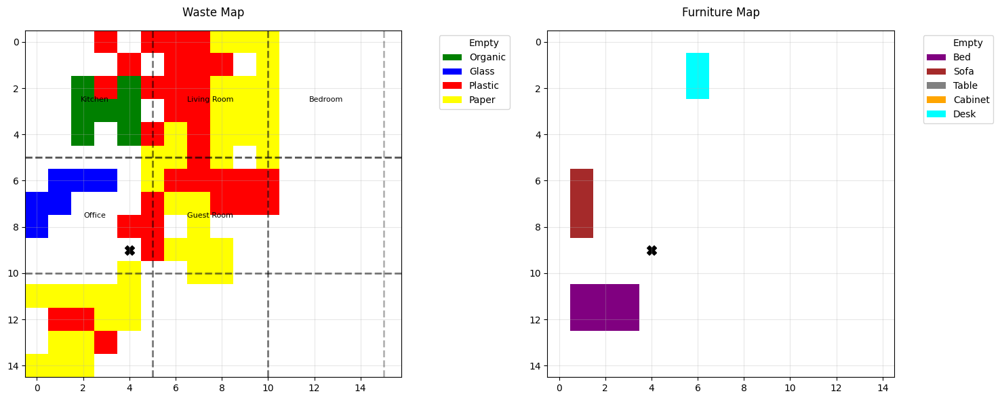

Step 77: Reward = 26.923, Total = 814.7990000000001


<Figure size 1500x1800 with 0 Axes>

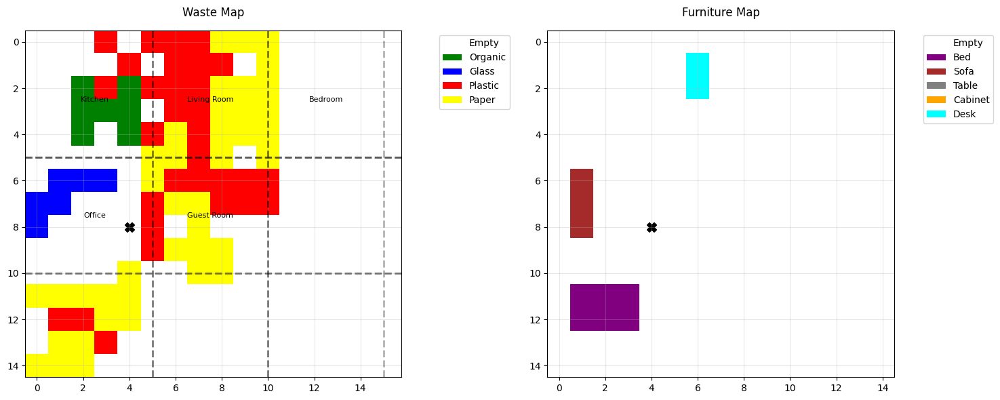

Step 78: Reward = -0.078, Total = 814.7210000000001


<Figure size 1500x1800 with 0 Axes>

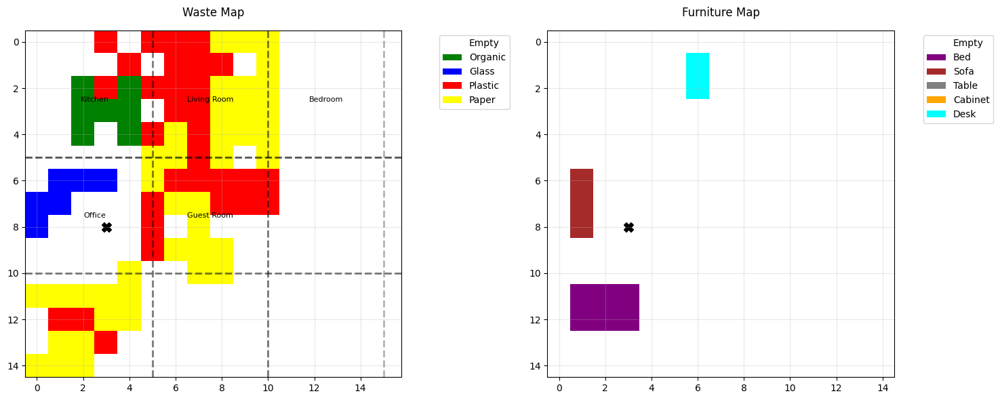

Step 79: Reward = 1.421, Total = 816.1420000000002


<Figure size 1500x1800 with 0 Axes>

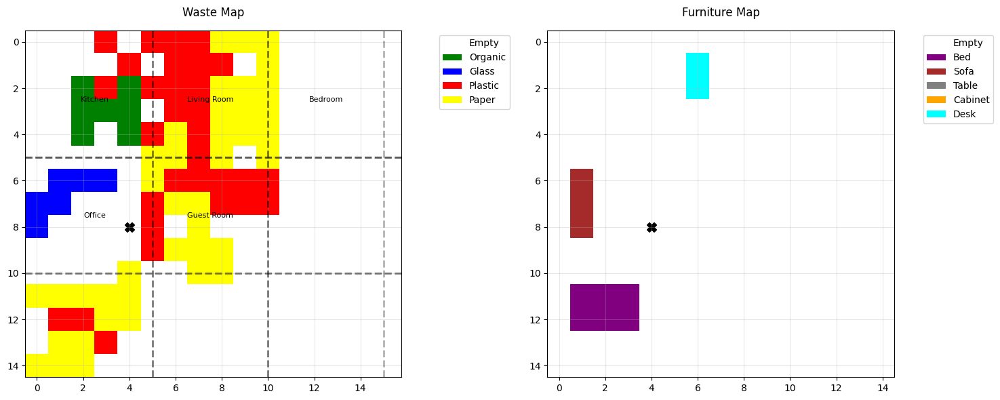

Step 80: Reward = 1.42, Total = 817.5620000000001


<Figure size 1500x1800 with 0 Axes>

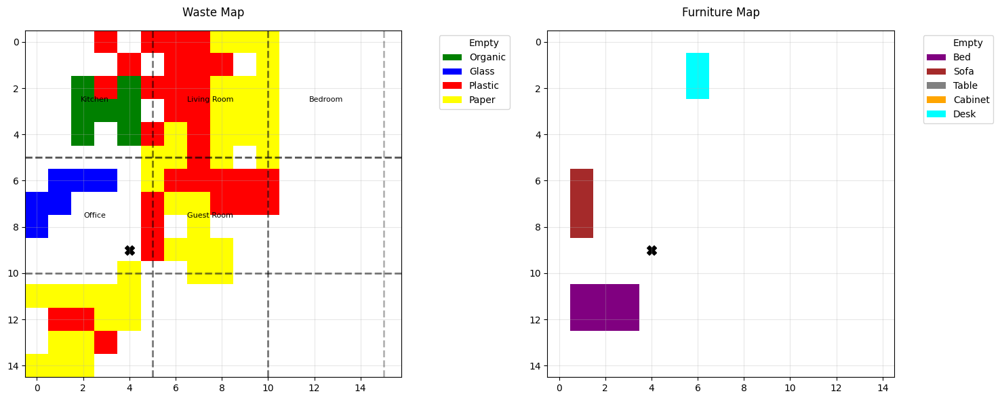

Step 81: Reward = 26.919, Total = 844.4810000000001


<Figure size 1500x1800 with 0 Axes>

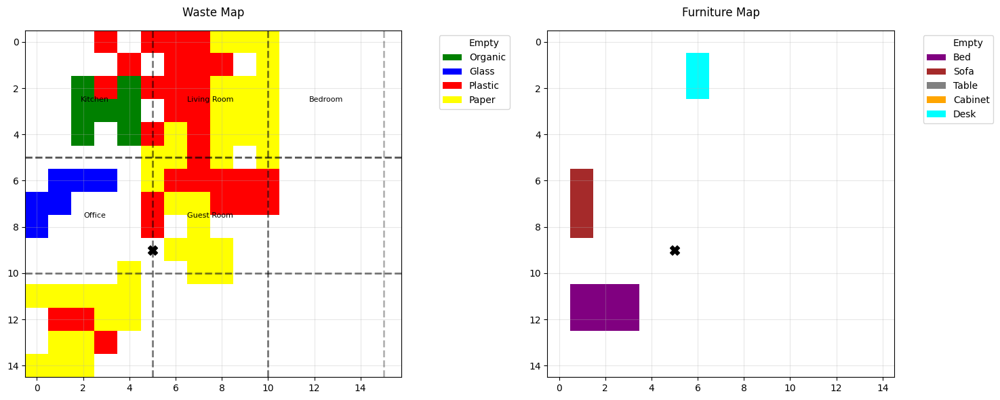

Step 82: Reward = 0.918, Total = 845.3990000000001


<Figure size 1500x1800 with 0 Axes>

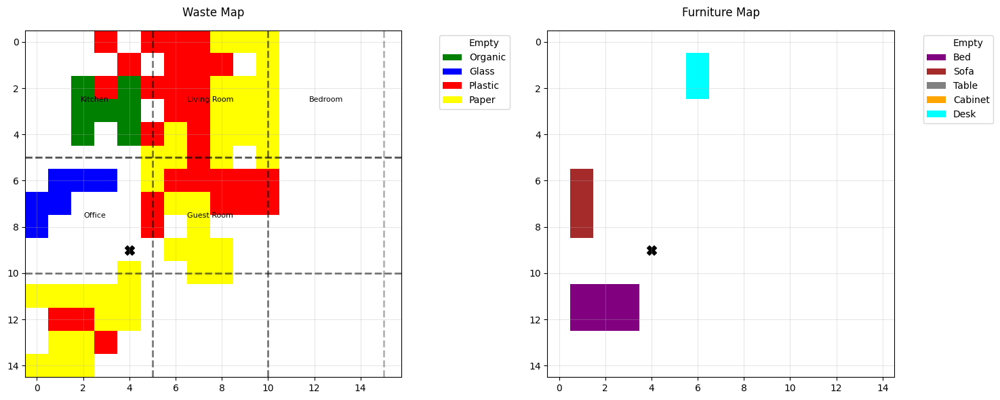

Step 83: Reward = 21.417, Total = 866.8160000000001


<Figure size 1500x1800 with 0 Axes>

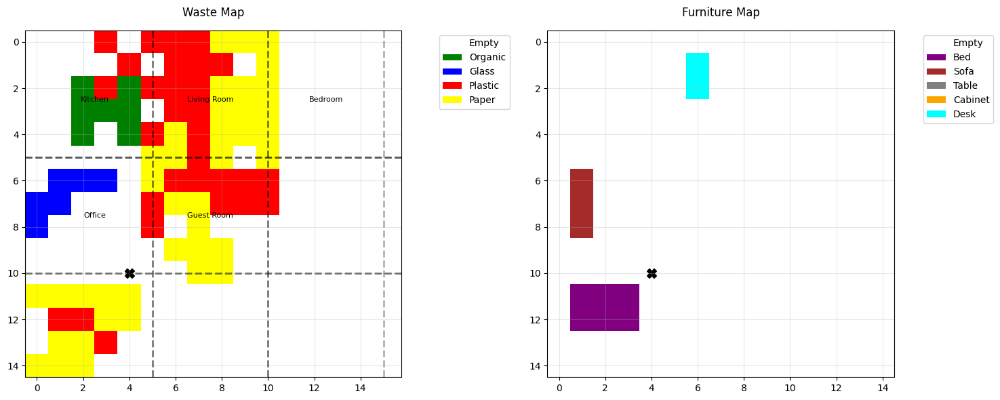

Step 84: Reward = 1.416, Total = 868.2320000000002


<Figure size 1500x1800 with 0 Axes>

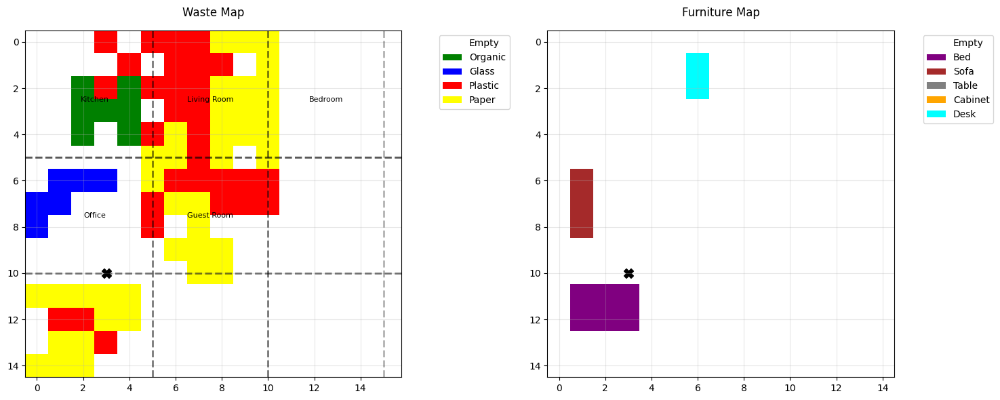

Step 85: Reward = -0.085, Total = 868.1470000000002


<Figure size 1500x1800 with 0 Axes>

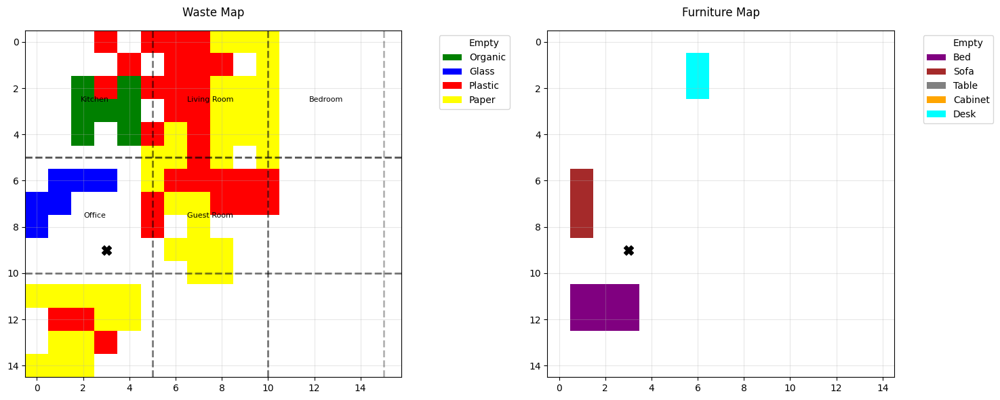

Step 86: Reward = 1.414, Total = 869.5610000000001


<Figure size 1500x1800 with 0 Axes>

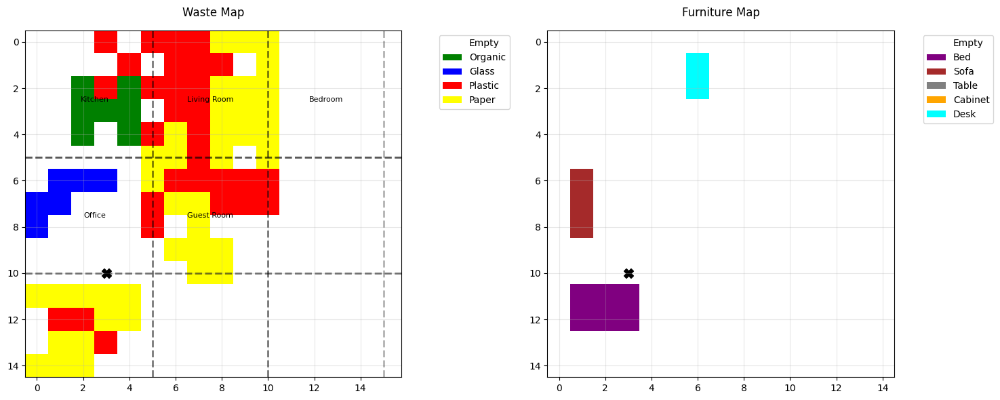

Step 87: Reward = 0.913, Total = 870.4740000000002


<Figure size 1500x1800 with 0 Axes>

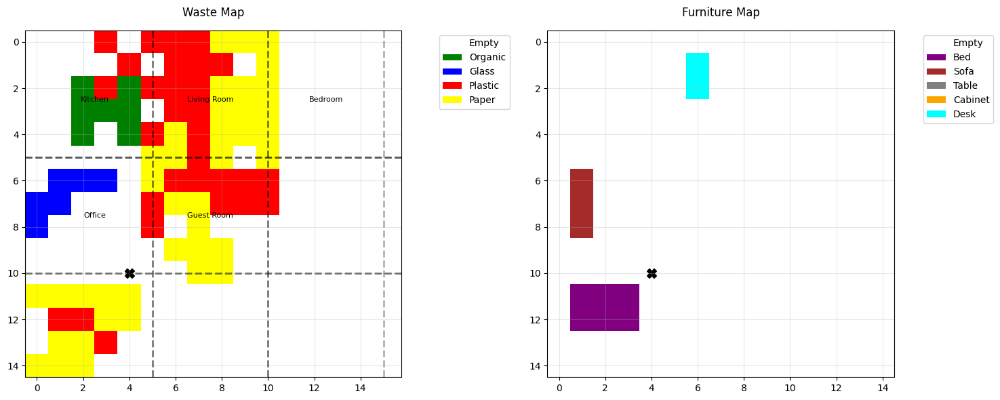

Step 88: Reward = 1.412, Total = 871.8860000000002


<Figure size 1500x1800 with 0 Axes>

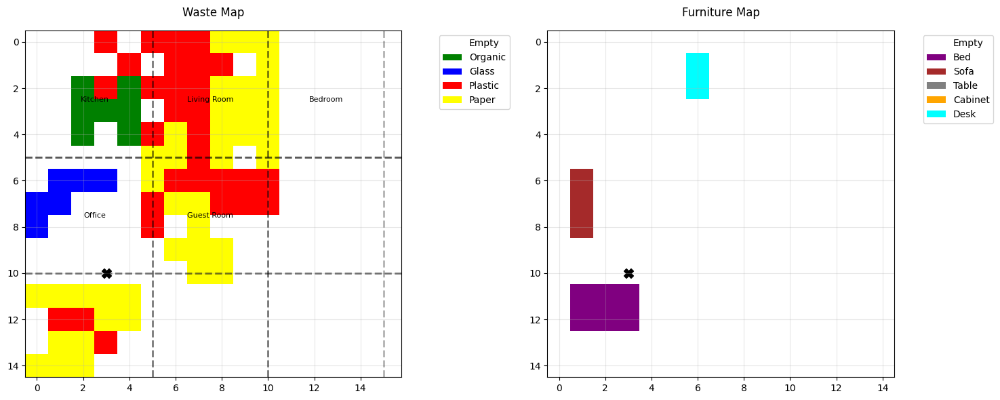

Step 89: Reward = 1.411, Total = 873.2970000000001


<Figure size 1500x1800 with 0 Axes>

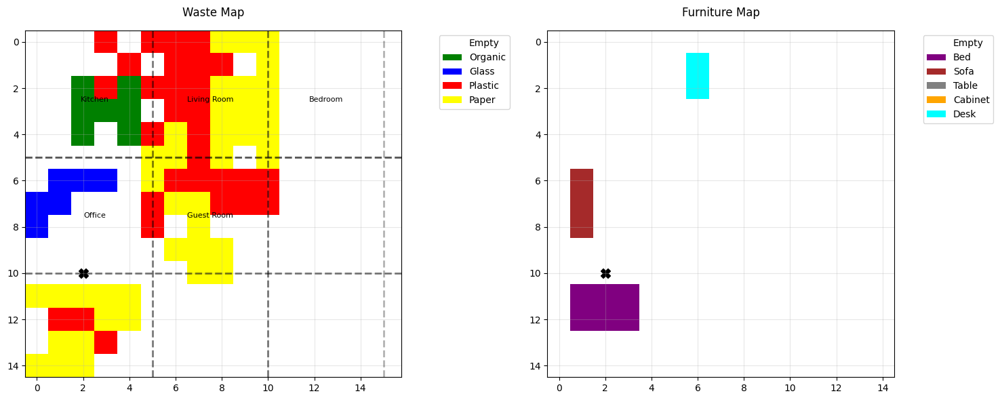

Step 90: Reward = 1.41, Total = 874.7070000000001


<Figure size 1500x1800 with 0 Axes>

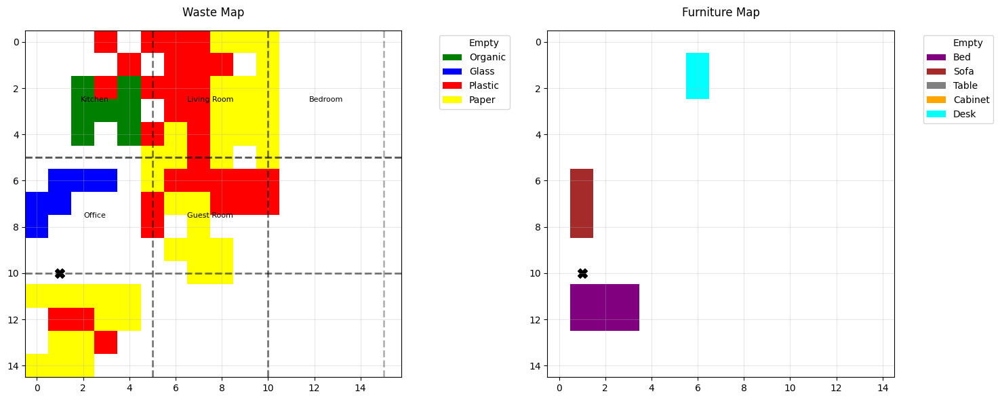

Step 91: Reward = -2, Total = 872.7070000000001


<Figure size 1500x1800 with 0 Axes>

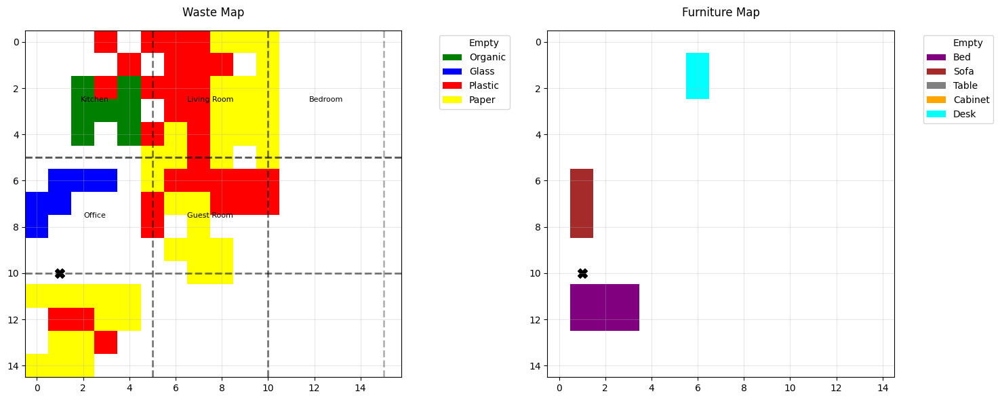

Step 92: Reward = 0.908, Total = 873.6150000000001


<Figure size 1500x1800 with 0 Axes>

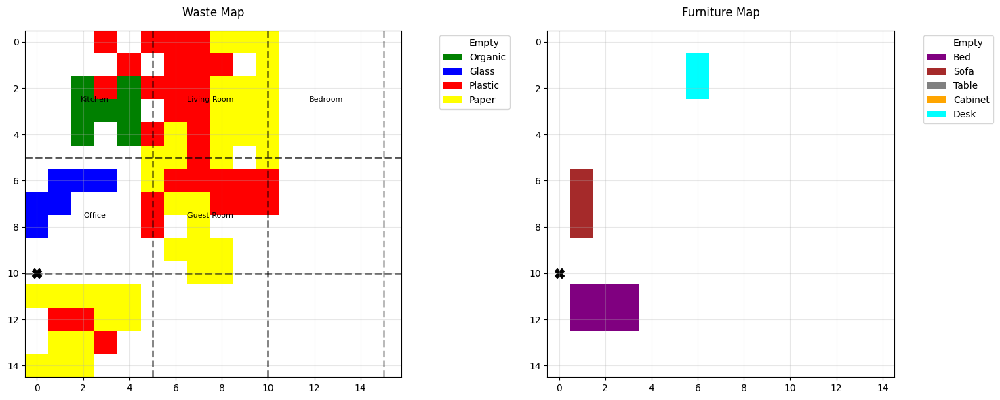

Step 93: Reward = 21.407, Total = 895.0220000000002


<Figure size 1500x1800 with 0 Axes>

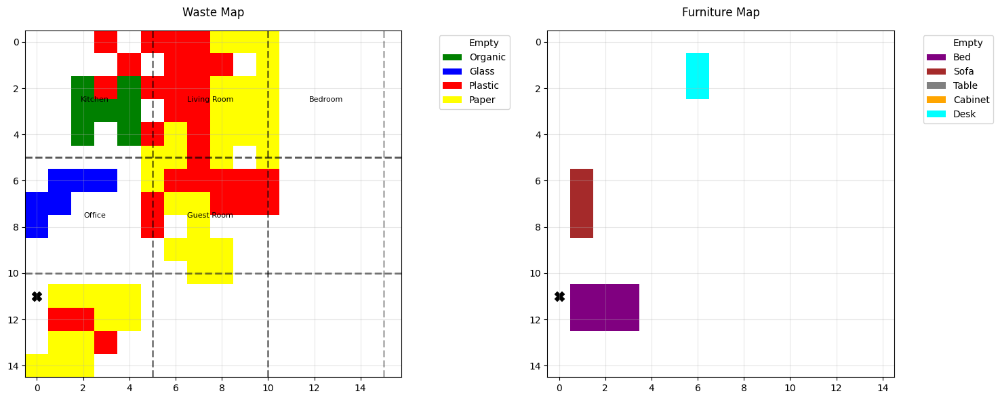

Step 94: Reward = 1.406, Total = 896.4280000000001


<Figure size 1500x1800 with 0 Axes>

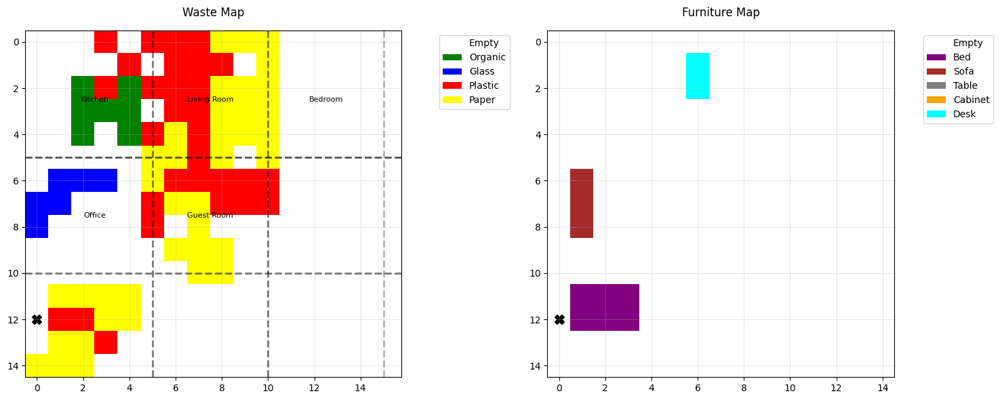

Step 95: Reward = 1.405, Total = 897.8330000000001


<Figure size 1500x1800 with 0 Axes>

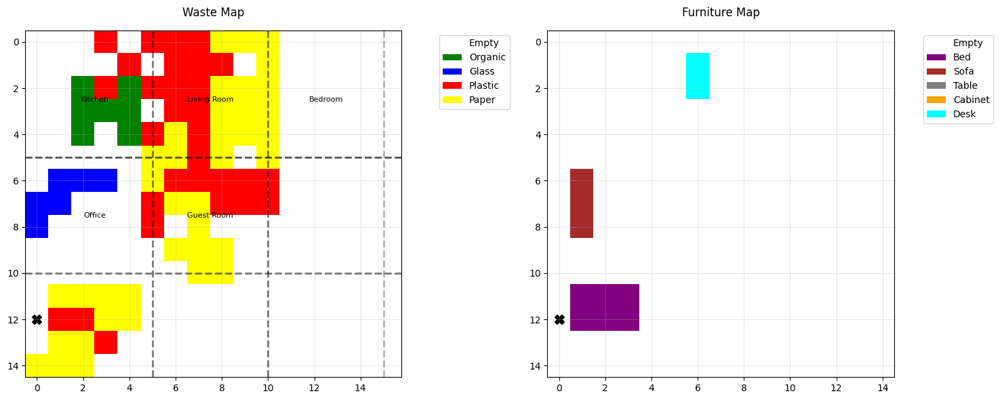

Step 96: Reward = 0.904, Total = 898.7370000000001


<Figure size 1500x1800 with 0 Axes>

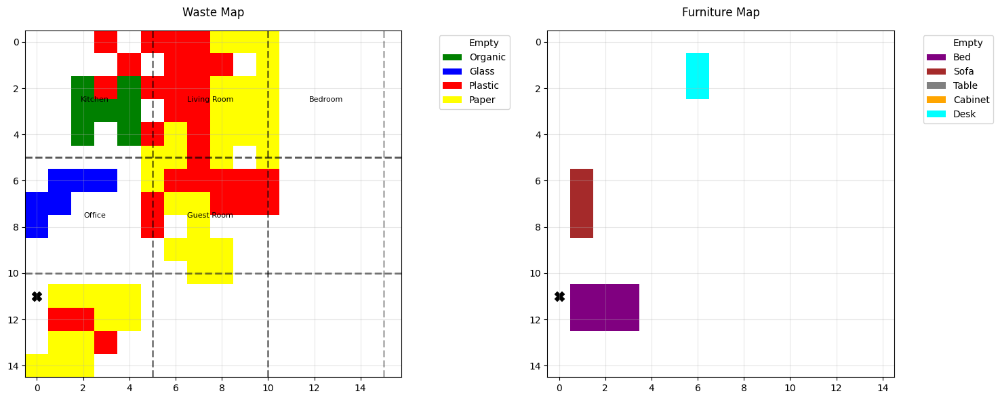

Step 97: Reward = 0.903, Total = 899.6400000000001


<Figure size 1500x1800 with 0 Axes>

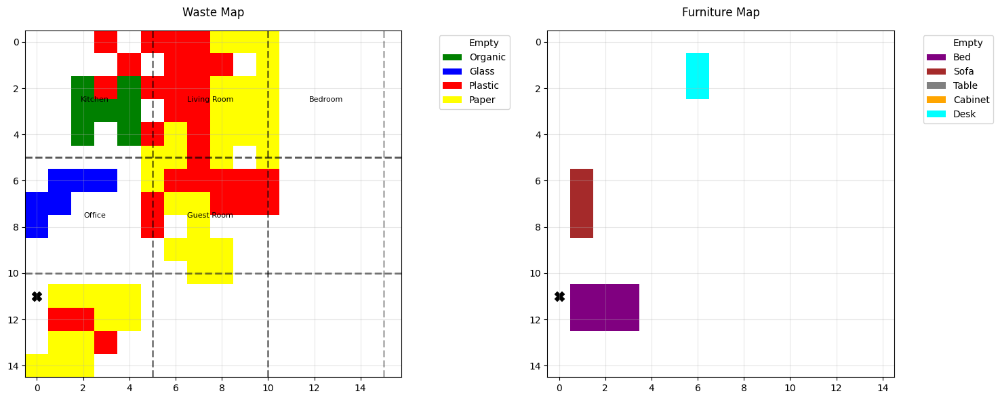

Step 98: Reward = 0.402, Total = 900.0420000000001


<Figure size 1500x1800 with 0 Axes>

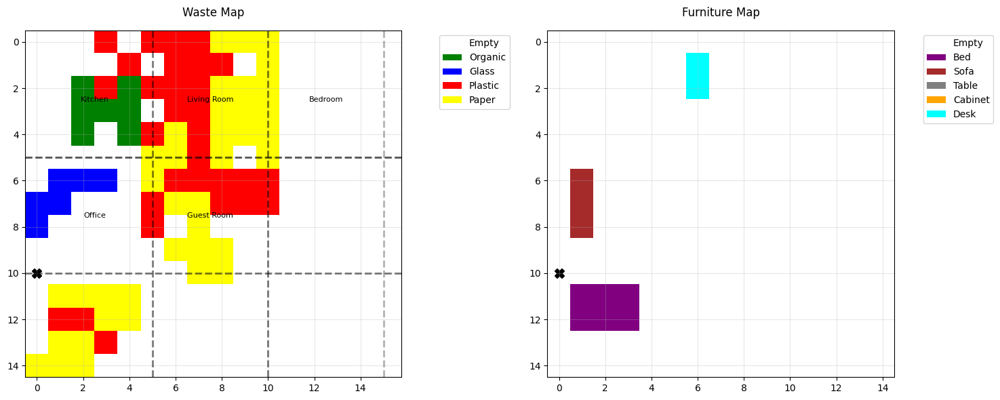

Step 99: Reward = 0.401, Total = 900.4430000000001


<Figure size 1500x1800 with 0 Axes>

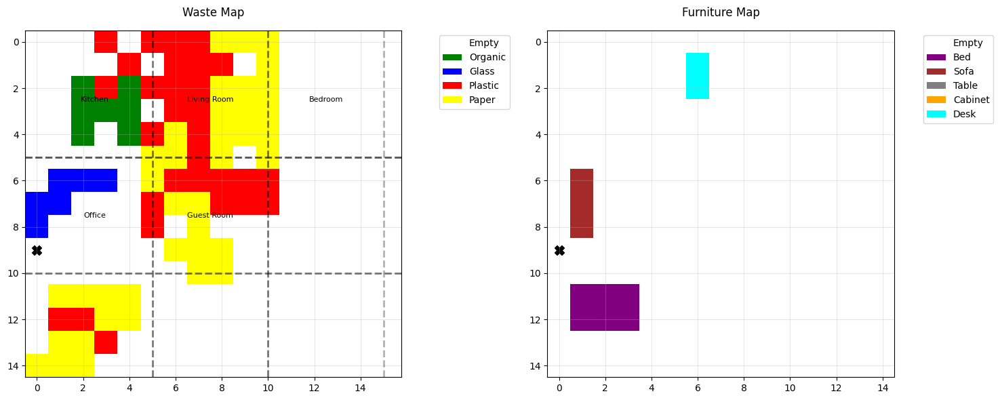

Step 100: Reward = 0.4, Total = 900.8430000000001
Test completed. Total reward: 900.8430000000001


In [ ]:
test(CleaningRobotEnv(map_size=15, rooms=None, max_time_steps=150), agent, max_steps = 100)

In [ ]:
import numpy as np
import time

class HybridAgent(DeepQLearningAgent):
    def __init__(self, env, state_shape, action_size,
                 genetic_pop_size=10,
                 genetic_interval=20,
                 mutation_rate=0.05,
                 eval_episodes=3,
                 genetic_timeout=30,  # إضافة حد زمني للتحسين الجيني (بالثواني)
                 **kwargs):
        super().__init__(env, state_shape, action_size, **kwargs)
        self.genetic_pop_size = genetic_pop_size
        self.genetic_interval = genetic_interval
        self.mutation_rate = mutation_rate
        self.eval_episodes = eval_episodes
        self.genetic_timeout = genetic_timeout
        self.best_fitness = float('-inf')

    def _evaluate_individual(self, max_steps=200):
        """تحسين عملية تقييم الأفراد مع إضافة حد زمني"""
        try:
            original_epsilon = self.epsilon
            self.epsilon = 0.0
            rewards = []

            for _ in range(self.eval_episodes):
                state, _ = self.env.reset()
                episode_reward = 0
                done = False
                steps = 0

                while not done and steps < max_steps:
                    action = self.choose_action(state)
                    next_state, reward, done, _, _ = self.env.step(action)
                    episode_reward += reward
                    state = next_state
                    steps += 1

                rewards.append(episode_reward)

            self.epsilon = original_epsilon
            return np.mean(rewards)

        except Exception as e:
            print(f"خطأ في التقييم: {e}")
            self.epsilon = original_epsilon
            return float('-inf')

    def genetic_optimization_step(self):
        """تحسين عملية التحسين الجيني مع إضافة حد زمني"""
        start_time = time.time()

        try:
            base_weights = self.model.get_weights()
            population = []
            fitness_scores = []
            max_individuals = min(self.genetic_pop_size, 12)

            # إنشاء المجتمع
            for _ in range(max_individuals):
                if time.time() - start_time > self.genetic_timeout:
                    print("تم تجاوز الوقت المحدد للتحسين الجيني")
                    return 0.0

                individual_weights = [w.copy() for w in base_weights]
                # تطبيق طفرات محدودة
                for layer_idx in [-2, -1]:
                    if np.random.random() < 0.3:  # تقليل احتمالية الطفرة
                        mutation = np.random.normal(
                            scale=self.mutation_rate * 0.3,
                            size=individual_weights[layer_idx].shape
                        )
                        individual_weights[layer_idx] += mutation
                population.append(individual_weights)
                print('individual_weights set')
            start_time = time.time()
            # تقييم المجتمع
            for individual_weights in population:
                if time.time() - start_time > self.genetic_timeout:
                    print("تم تجاوز الوقت المحدد للتقييم")
                    return 0.0

                original_weights = self.model.get_weights()
                self.model.set_weights(individual_weights)
                fitness = self._evaluate_individual(max_steps=150)  # تقليل عدد الخطوات
                fitness_scores.append(fitness)
                self.model.set_weights(original_weights)
                print('individual_weights the best')

            # اختيار أفضل فرد
            if fitness_scores:
                best_idx = np.argmax(fitness_scores)
                best_fitness = fitness_scores[best_idx]
                current_fitness = self._evaluate_individual(max_steps=150)

                # تحديث النموذج فقط إذا كان التحسين كبيراً بما يكفي
                if best_fitness > current_fitness + 0.5:  # زيادة عتبة التحسين
                    self.model.set_weights(population[best_idx])
                    if best_fitness > self.best_fitness:
                        self.best_fitness = best_fitness
                        self.target_model.set_weights(population[best_idx])
                    return best_fitness - current_fitness

            return 0.0

        except Exception as e:
            print(f"خطأ في التحسين الجيني: {e}")
            return 0.0

def train_hybrid_agent(env, num_episodes=500, initial_dqn_episodes=100):
    state_shape = env.observation_space.shape
    action_size = env.action_space.n

    agent = HybridAgent(
        env,
        state_shape=state_shape,
        action_size=action_size,
        genetic_pop_size=30,           # تقليل حجم المجتمع
        genetic_interval=5,           # تعديل الفاصل بين التحسينات
        mutation_rate=0.003,         # تقليل معدل الطفرة
        eval_episodes=2,             # تقليل عدد حلقات التقييم
        genetic_timeout=180,          # تحديد وقت أقصى للتحسين الجيني
        learning_rate=0.0005,
        batch_size=32,
        discount_factor=0.98
    )

    for episode in range(num_episodes):
        state, _ = env.reset()
        total_reward = 0
        done = False
        step_count = 0
        max_steps = 200

        while not done and step_count < max_steps:
            action = agent.choose_action(state)
            next_state, reward, done, _, _ = env.step(action)
            agent.store_experience(state, action, reward, next_state, done)

            if len(agent.replay_buffer) >= agent.batch_size:
                agent.train()

            state = next_state
            total_reward += reward
            step_count += 1

        agent.decay_epsilon()

        # تنفيذ التحسين الجيني بشكل محدود
        if episode > initial_dqn_episodes and episode % agent.genetic_interval == 0:
            print(f"بدء التحسين الجيني في الحلقة {episode}")
            genetic_improvement = agent.genetic_optimization_step()
            print(f"نتيجة التحسين الجيني: {genetic_improvement:.3f}")

        # تحديث شبكة الهدف
        if episode % 10 == 0:
            agent.update_target_network()

        agent.episode_rewards.append(total_reward)
        print(f"الحلقة {episode+1}: المكافأة = {total_reward:.1f}, الخطوات = {step_count}")

    return agent

In [ ]:
env = CleaningRobotEnv(map_size=15)
trained_agent = train_hybrid_agent(env, num_episodes=30, initial_dqn_episodes=3)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


الحلقة 1: المكافأة = 866.6, الخطوات = 150
الحلقة 2: المكافأة = 917.4, الخطوات = 150
الحلقة 3: المكافأة = 878.5, الخطوات = 150
الحلقة 4: المكافأة = 1015.2, الخطوات = 150
الحلقة 5: المكافأة = 1082.3, الخطوات = 150
بدء التحسين الجيني في الحلقة 5
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights set
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
individual_weights the best
تم تجاوز الوقت المحدد للتقييم
نتيجة التحسين الجيني: 0.000
الحلقة 6: المكافأة = 1259.7, الخطوات = 150
الحلقة 7: المكافأة = 814.0, الخطوات = 150
الحلقة 8: المكافأة = 1157.9, الخطوات = 150
الحلقة 9: المكافأة = 1204.2, الخطوات = 150


In [ ]:
def plot_training_metrics(agent1, agent2=None, window_size=10, agent1_name="DQN Agent", agent2_name="Hybrid Agent"):
    import numpy as np
    import matplotlib.pyplot as plt
    import pandas as pd

    # Set figure style
    plt.rcParams.update({
        'figure.figsize': (16, 20),
        'axes.grid': True,
        'grid.alpha': 0.3,
        'lines.linewidth': 2,
        'axes.titlepad': 15,
        'font.size': 10,
        'axes.labelsize': 11,
        'axes.titlesize': 12
    })

    # Create figure and grid
    fig = plt.figure()
    gs = fig.add_gridspec(4, 2, hspace=0.3, wspace=0.2)

    # ألوان للخوارزمية الأولى: أزرق، أخضر، أحمر، برتقالي، أرجواني، تركواز
    colors1 = ['#1f77b4', '#2ca02c', '#d62728', '#ff7f0e', '#9467bd', '#17becf']
    # ألوان للخوارزمية الثانية: بني، بنفسجي، أصفر، رمادي، وردي، أخضر مصفر
    colors2 = ['#8c564b', '#7f7f7f', '#bcbd22', '#e377c2', '#ffbb78', '#98df8a']

    # 1. Episode Rewards Plot
    ax1 = fig.add_subplot(gs[0, :])

    # مكافآت العميل الأول
    rewards1 = np.array(agent1.episode_rewards)
    episodes1 = np.arange(len(rewards1))
    rolling_rewards1 = pd.Series(rewards1).rolling(window=window_size, min_periods=1).mean().values

    ax1.plot(episodes1, rewards1, alpha=0.3, color=colors1[0], label=f'{agent1_name} Raw Rewards')
    ax1.plot(episodes1, rolling_rewards1, color=colors1[0], linewidth=2.5,
             label=f'{agent1_name} Avg (window={window_size})')

    if agent2 is not None:
        # مكافآت العميل الثاني
        rewards2 = np.array(agent2.episode_rewards)

        # ضبط طول البيانات ليتطابق مع الأول - إما بالتمديد أو الاقتطاع
        max_episodes = max(len(rewards1), len(rewards2))

        # إذا كان العميل الثاني لديه بيانات أقل، نمددها لتطابق العميل الأول
        if len(rewards2) < max_episodes:
            last_value = rewards2[-1] if len(rewards2) > 0 else 0
            extension = np.full(max_episodes - len(rewards2), last_value)
            rewards2 = np.append(rewards2, extension)
        # إذا كان العميل الأول لديه بيانات أقل، نمدد بياناته أيضًا
        elif len(rewards1) < max_episodes:
            last_value = rewards1[-1] if len(rewards1) > 0 else 0
            extension = np.full(max_episodes - len(rewards1), last_value)
            rewards1 = np.append(rewards1, extension)
            episodes1 = np.arange(max_episodes)
            # إعادة حساب المتوسط المتحرك
            rolling_rewards1 = pd.Series(rewards1).rolling(window=window_size, min_periods=1).mean().values
            # إعادة رسم العميل الأول بالطول الجديد
            ax1.clear()
            ax1.plot(episodes1, rewards1, alpha=0.3, color=colors1[0], label=f'{agent1_name} Raw Rewards')
            ax1.plot(episodes1, rolling_rewards1, color=colors1[0], linewidth=2.5,
                    label=f'{agent1_name} Avg (window={window_size})')

        episodes2 = np.arange(len(rewards2))
        rolling_rewards2 = pd.Series(rewards2).rolling(window=window_size, min_periods=1).mean().values

        ax1.plot(episodes2, rewards2, alpha=0.3, color=colors2[0], label=f'{agent2_name} Raw Rewards')
        ax1.plot(episodes2, rolling_rewards2, color=colors2[0], linewidth=2.5,
                label=f'{agent2_name} Avg (window={window_size})')

    ax1.set_title('Episode Rewards Over Time')
    ax1.set_xlabel('Episode')
    ax1.set_ylabel('Total Reward')
    ax1.legend()

    # 2. Episode Lengths Plot
    ax2 = fig.add_subplot(gs[1, :])

    # أطوال حلقات العميل الأول
    lengths1 = np.array(agent1.episode_lengths)
    ep_lengths1 = np.arange(len(lengths1))
    rolling_lengths1 = pd.Series(lengths1).rolling(window=window_size, min_periods=1).mean().values

    ax2.plot(ep_lengths1, lengths1, alpha=0.3, color=colors1[1], label=f'{agent1_name} Raw Lengths')
    ax2.plot(ep_lengths1, rolling_lengths1, color=colors1[1], linewidth=2.5,
             label=f'{agent1_name} Avg (window={window_size})')

    if agent2 is not None:
        # أطوال حلقات العميل الثاني
        lengths2 = np.array(agent2.episode_lengths)

        # ضبط طول البيانات ليتطابق
        max_ep_lengths = max(len(lengths1), len(lengths2))

        # تمديد البيانات إذا لزم الأمر
        if len(lengths2) < max_ep_lengths:
            last_value = lengths2[-1] if len(lengths2) > 0 else 0
            extension = np.full(max_ep_lengths - len(lengths2), last_value)
            lengths2 = np.append(lengths2, extension)
        elif len(lengths1) < max_ep_lengths:
            last_value = lengths1[-1] if len(lengths1) > 0 else 0
            extension = np.full(max_ep_lengths - len(lengths1), last_value)
            lengths1 = np.append(lengths1, extension)
            ep_lengths1 = np.arange(max_ep_lengths)
            # إعادة حساب المتوسط المتحرك
            rolling_lengths1 = pd.Series(lengths1).rolling(window=window_size, min_periods=1).mean().values
            # إعادة رسم العميل الأول
            ax2.clear()
            ax2.plot(ep_lengths1, lengths1, alpha=0.3, color=colors1[1], label=f'{agent1_name} Raw Lengths')
            ax2.plot(ep_lengths1, rolling_lengths1, color=colors1[1], linewidth=2.5,
                    label=f'{agent1_name} Avg (window={window_size})')

        ep_lengths2 = np.arange(len(lengths2))
        rolling_lengths2 = pd.Series(lengths2).rolling(window=window_size, min_periods=1).mean().values

        ax2.plot(ep_lengths2, lengths2, alpha=0.3, color=colors2[1], label=f'{agent2_name} Raw Lengths')
        ax2.plot(ep_lengths2, rolling_lengths2, color=colors2[1], linewidth=2.5,
                label=f'{agent2_name} Avg (window={window_size})')

    ax2.set_title('Episode Lengths Over Time')
    ax2.set_xlabel('Episode')
    ax2.set_ylabel('Steps')
    ax2.legend()

    # 3. Epsilon Decay Plot
    ax3 = fig.add_subplot(gs[2, 0])

    # إبسيلون العميل الأول
    epsilon1 = np.array(agent1.epsilon_values)
    eps_steps1 = np.arange(len(epsilon1))

    ax3.plot(eps_steps1, epsilon1, color=colors1[2], linewidth=2.5, label=f'{agent1_name} Epsilon')

    if agent2 is not None and hasattr(agent2, 'epsilon_values') and len(agent2.epsilon_values) > 0:
        # إبسيلون العميل الثاني
        epsilon2 = np.array(agent2.epsilon_values)

        # ضبط طول البيانات ليتطابق
        max_eps_steps = max(len(epsilon1), len(epsilon2))

        # تمديد البيانات إذا لزم الأمر
        if len(epsilon2) < max_eps_steps:
            last_value = epsilon2[-1] if len(epsilon2) > 0 else 0
            extension = np.full(max_eps_steps - len(epsilon2), last_value)
            epsilon2 = np.append(epsilon2, extension)
        elif len(epsilon1) < max_eps_steps:
            last_value = epsilon1[-1] if len(epsilon1) > 0 else 0
            extension = np.full(max_eps_steps - len(epsilon1), last_value)
            epsilon1 = np.append(epsilon1, extension)
            eps_steps1 = np.arange(max_eps_steps)
            # إعادة رسم العميل الأول
            ax3.clear()
            ax3.plot(eps_steps1, epsilon1, color=colors1[2], linewidth=2.5, label=f'{agent1_name} Epsilon')

        eps_steps2 = np.arange(len(epsilon2))
        ax3.plot(eps_steps2, epsilon2, color=colors2[2], linewidth=2.5, label=f'{agent2_name} Epsilon')

    ax3.set_title('Epsilon Decay Over Time')
    ax3.set_xlabel('Episode')
    ax3.set_ylabel('Epsilon Value')
    ax3.legend()

    # 4. Q-Values Plot
    ax4 = fig.add_subplot(gs[2, 1])

    # التحقق من وجود بيانات للعميل الأول
    if hasattr(agent1, 'q_values_history') and len(agent1.q_values_history) > 0:
        q_values1 = np.array(agent1.q_values_history)
        q_steps1 = np.arange(len(q_values1))
        window_q = window_size * 10
        rolling_q1 = pd.Series(q_values1).rolling(window=window_q, min_periods=1).mean().values

        ax4.plot(q_steps1, q_values1, alpha=0.3, color=colors1[3], label=f'{agent1_name} Raw Q-Values')
        ax4.plot(q_steps1, rolling_q1, color=colors1[3], linewidth=2.5,
                label=f'{agent1_name} Avg (window={window_q})')

        if agent2 is not None and hasattr(agent2, 'q_values_history') and len(agent2.q_values_history) > 0:
            q_values2 = np.array(agent2.q_values_history)

            # ضبط طول البيانات ليتطابق
            max_q_steps = max(len(q_values1), len(q_values2))

            # تمديد البيانات إذا لزم الأمر
            if len(q_values2) < max_q_steps:
                last_value = q_values2[-1] if len(q_values2) > 0 else 0
                extension = np.full(max_q_steps - len(q_values2), last_value)
                q_values2 = np.append(q_values2, extension)
            elif len(q_values1) < max_q_steps:
                last_value = q_values1[-1] if len(q_values1) > 0 else 0
                extension = np.full(max_q_steps - len(q_values1), last_value)
                q_values1 = np.append(q_values1, extension)
                q_steps1 = np.arange(max_q_steps)
                # إعادة حساب المتوسط المتحرك
                rolling_q1 = pd.Series(q_values1).rolling(window=window_q, min_periods=1).mean().values
                # إعادة رسم العميل الأول
                ax4.clear()
                ax4.plot(q_steps1, q_values1, alpha=0.3, color=colors1[3], label=f'{agent1_name} Raw Q-Values')
                ax4.plot(q_steps1, rolling_q1, color=colors1[3], linewidth=2.5,
                        label=f'{agent1_name} Avg (window={window_q})')

            q_steps2 = np.arange(len(q_values2))
            rolling_q2 = pd.Series(q_values2).rolling(window=window_q, min_periods=1).mean().values

            ax4.plot(q_steps2, q_values2, alpha=0.3, color=colors2[3], label=f'{agent2_name} Raw Q-Values')
            ax4.plot(q_steps2, rolling_q2, color=colors2[3], linewidth=2.5,
                    label=f'{agent2_name} Avg (window={window_q})')

    ax4.set_title('Average Q-Values Over Time')
    ax4.set_xlabel('Training Step')
    ax4.set_ylabel('Average Q-Value')
    ax4.legend()

    # 5. Training Loss Plot
    ax5 = fig.add_subplot(gs[3, 0])

    # التحقق من وجود بيانات التدريب للعميل الأول
    if hasattr(agent1, 'training_loss') and len(agent1.training_loss) > 0:
        loss1 = np.array(agent1.training_loss)
        loss_steps1 = np.arange(len(loss1))
        window_loss = window_size * 10
        rolling_loss1 = pd.Series(loss1).rolling(window=window_loss, min_periods=1).mean().values

        ax5.plot(loss_steps1, loss1, alpha=0.3, color=colors1[4], label=f'{agent1_name} Raw Loss')
        ax5.plot(loss_steps1, rolling_loss1, color=colors1[4], linewidth=2.5,
                label=f'{agent1_name} Avg (window={window_loss})')

        if agent2 is not None and hasattr(agent2, 'training_loss') and len(agent2.training_loss) > 0:
            loss2 = np.array(agent2.training_loss)

            # ضبط طول البيانات ليتطابق
            max_loss_steps = max(len(loss1), len(loss2))

            # تمديد البيانات إذا لزم الأمر
            if len(loss2) < max_loss_steps:
                last_value = loss2[-1] if len(loss2) > 0 else 0
                extension = np.full(max_loss_steps - len(loss2), last_value)
                loss2 = np.append(loss2, extension)
            elif len(loss1) < max_loss_steps:
                last_value = loss1[-1] if len(loss1) > 0 else 0
                extension = np.full(max_loss_steps - len(loss1), last_value)
                loss1 = np.append(loss1, extension)
                loss_steps1 = np.arange(max_loss_steps)
                # إعادة حساب المتوسط المتحرك
                rolling_loss1 = pd.Series(loss1).rolling(window=window_loss, min_periods=1).mean().values
                # إعادة رسم العميل الأول
                ax5.clear()
                ax5.plot(loss_steps1, loss1, alpha=0.3, color=colors1[4], label=f'{agent1_name} Raw Loss')
                ax5.plot(loss_steps1, rolling_loss1, color=colors1[4], linewidth=2.5,
                        label=f'{agent1_name} Avg (window={window_loss})')

            loss_steps2 = np.arange(len(loss2))
            rolling_loss2 = pd.Series(loss2).rolling(window=window_loss, min_periods=1).mean().values

            ax5.plot(loss_steps2, loss2, alpha=0.3, color=colors2[4], label=f'{agent2_name} Raw Loss')
            ax5.plot(loss_steps2, rolling_loss2, color=colors2[4], linewidth=2.5,
                    label=f'{agent2_name} Avg (window={window_loss})')

    ax5.set_title('Training Loss Over Time')
    ax5.set_xlabel('Training Step')
    ax5.set_ylabel('Loss')
    ax5.legend()

    # 6. Reward Distribution Plot
    ax6 = fig.add_subplot(gs[3, 1])
    ax6.hist(agent1.episode_rewards, bins=30, color=colors1[5], alpha=0.6, label=f'{agent1_name}',
             histtype='stepfilled', edgecolor='black', linewidth=1.0)
    mean_reward1 = np.mean(agent1.episode_rewards)
    ax6.axvline(mean_reward1, color=colors1[5], linestyle='-',
                label=f'{agent1_name} Mean: {mean_reward1:.1f}', linewidth=3)

    if agent2 is not None:
        ax6.hist(agent2.episode_rewards, bins=30, color=colors2[5], alpha=0.6, label=f'{agent2_name}',
                 histtype='stepfilled', edgecolor='black', linewidth=1.0, hatch='///')
        mean_reward2 = np.mean(agent2.episode_rewards)
        ax6.axvline(mean_reward2, color=colors2[5], linestyle='--',
                    label=f'{agent2_name} Mean: {mean_reward2:.1f}', linewidth=3)

    ax6.set_title('Reward Distribution')
    ax6.set_xlabel('Reward')
    ax6.set_ylabel('Count')
    ax6.legend()

    # إضافة شريط ألوان في أعلى الشكل للتمييز بين الخوارزميتين
    if agent2 is not None:
        legend_elements = [
            plt.Line2D([0], [0], color=colors1[0], lw=4, label=agent1_name),
            plt.Line2D([0], [0], color=colors2[0], lw=4, label=agent2_name)
        ]
        fig.legend(handles=legend_elements, loc='upper center', ncol=2,
                   bbox_to_anchor=(0.5, 0.98), frameon=True, facecolor='white',
                   edgecolor='black', fontsize=12)

    plt.suptitle('Comparison of DQN vs Hybrid Agent Training Metrics', fontsize=14, y=0.95)
    plt.tight_layout(rect=[0, 0.03, 1, 0.92])

    # return fig

<ipython-input-28-51a160612f7a>:295: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.92])


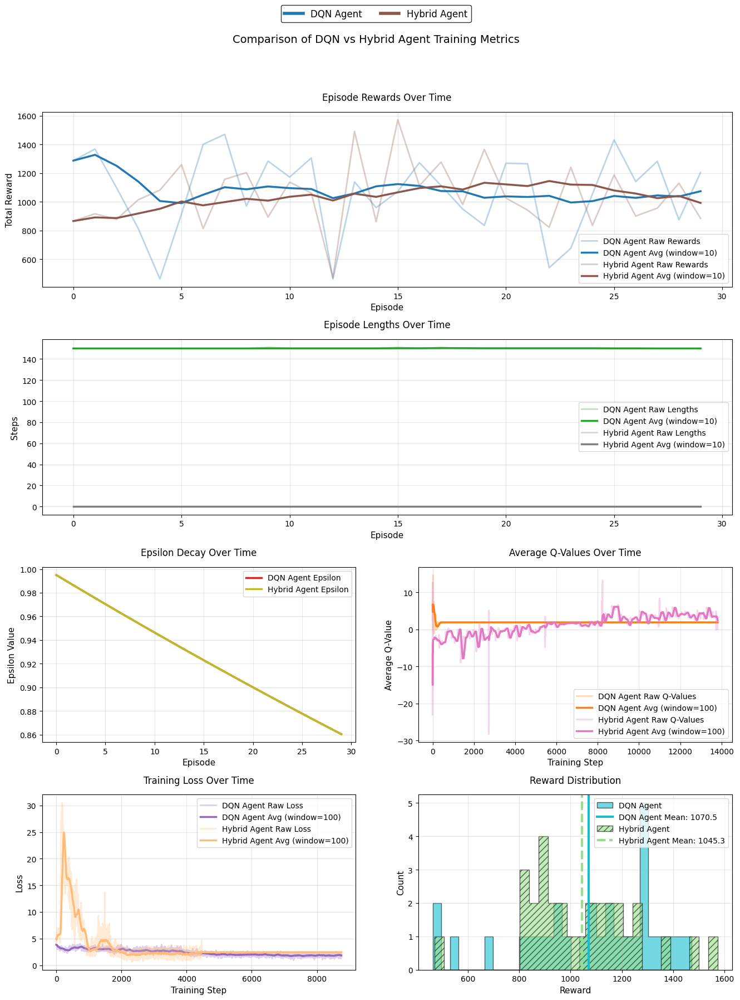

In [ ]:
plot_training_metrics(agent, trained_agent)

<Figure size 1500x600 with 0 Axes>

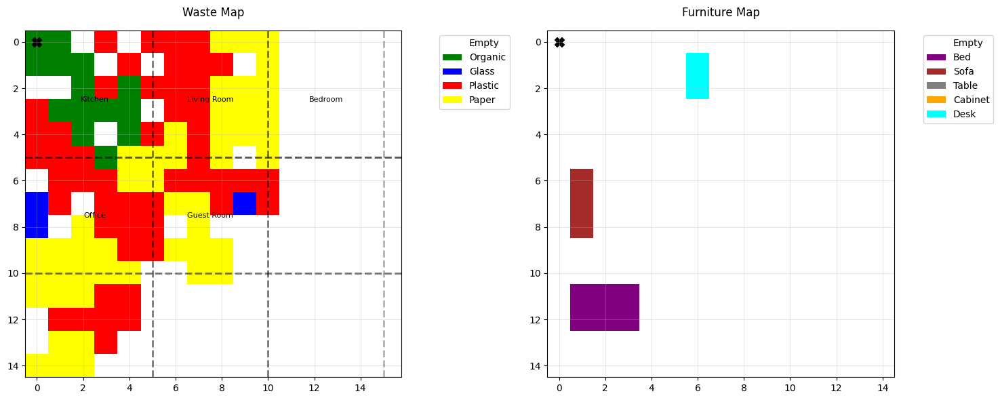

Step 1: Reward = 31.999, Total = 31.999


<Figure size 1600x2000 with 0 Axes>

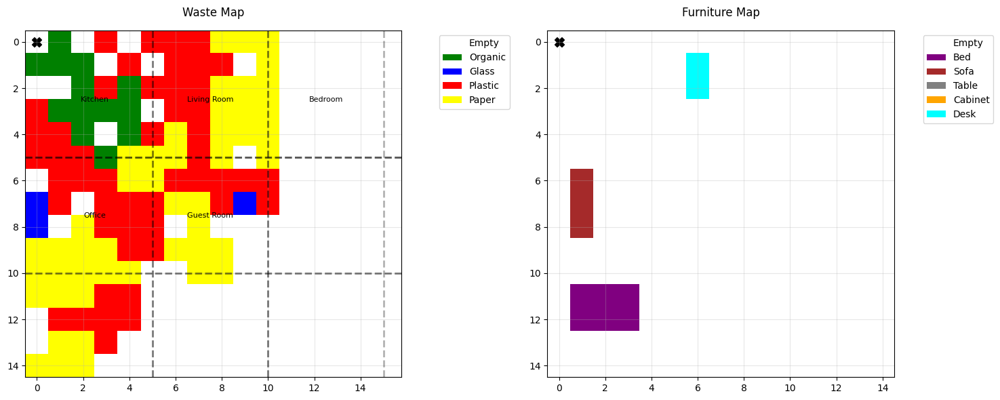

Step 2: Reward = 1.498, Total = 33.497


<Figure size 1600x2000 with 0 Axes>

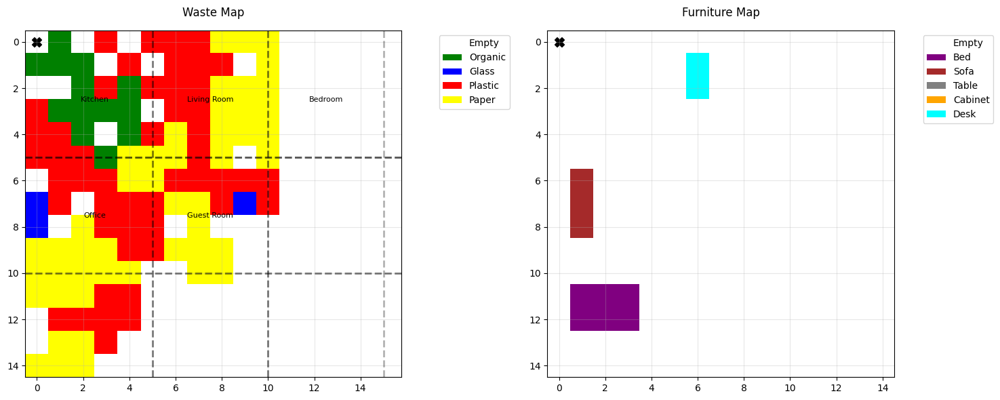

Step 3: Reward = 1.497, Total = 34.994


<Figure size 1600x2000 with 0 Axes>

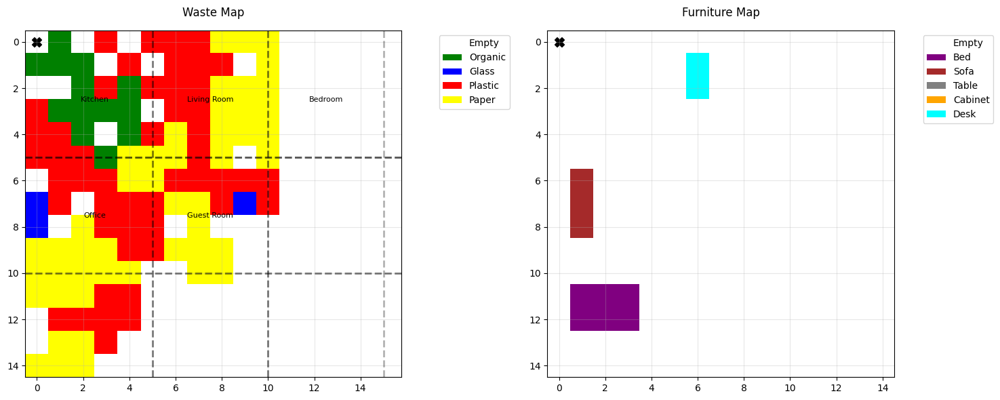

Step 4: Reward = 31.496, Total = 66.49


<Figure size 1600x2000 with 0 Axes>

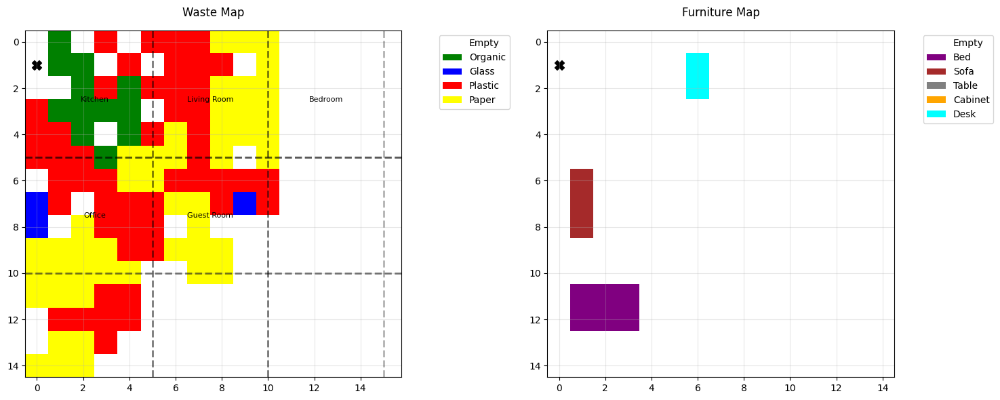

Step 5: Reward = 31.995, Total = 98.485


<Figure size 1600x2000 with 0 Axes>

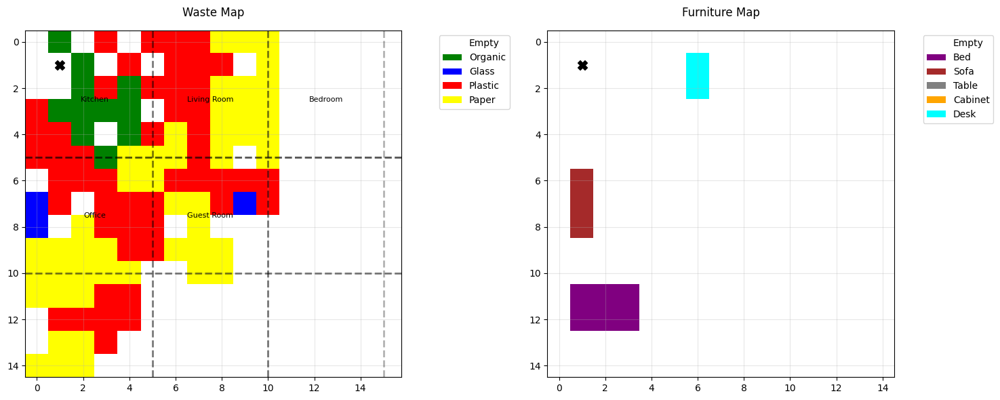

Step 6: Reward = 32.494, Total = 130.97899999999998


<Figure size 1600x2000 with 0 Axes>

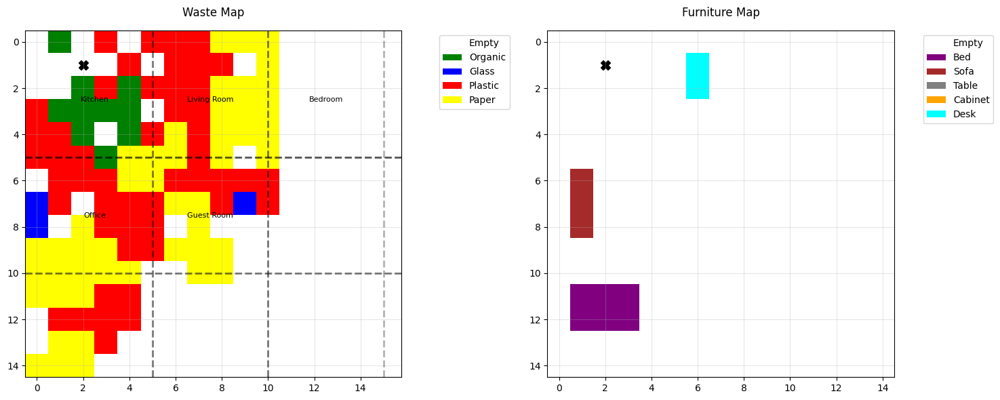

Step 7: Reward = 32.492999999999995, Total = 163.47199999999998


<Figure size 1600x2000 with 0 Axes>

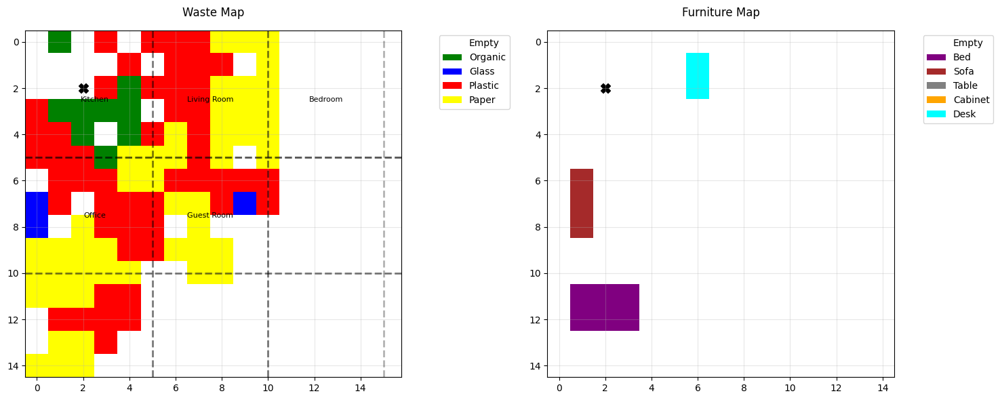

Step 8: Reward = 32.992000000000004, Total = 196.464


<Figure size 1600x2000 with 0 Axes>

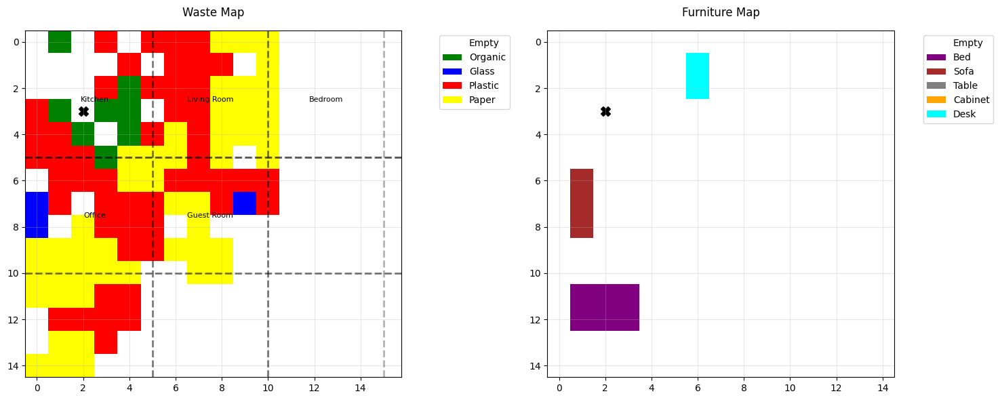

Step 9: Reward = 32.991, Total = 229.45499999999998


<Figure size 1600x2000 with 0 Axes>

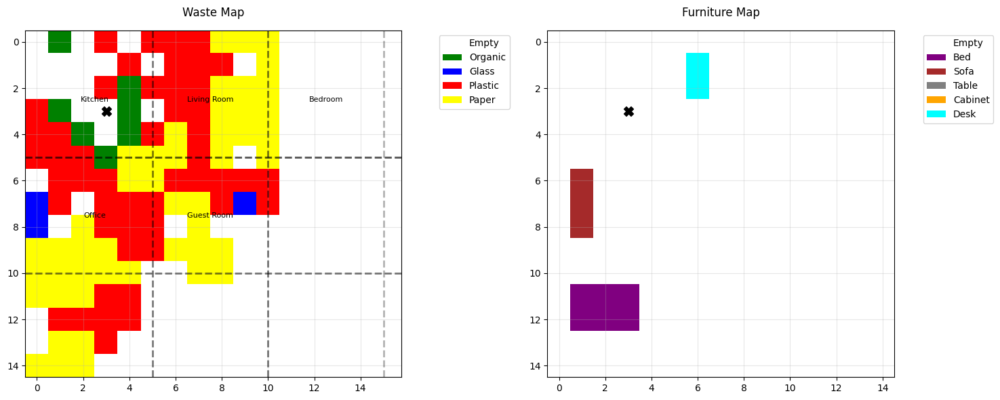

Step 10: Reward = 26.99, Total = 256.445


<Figure size 1600x2000 with 0 Axes>

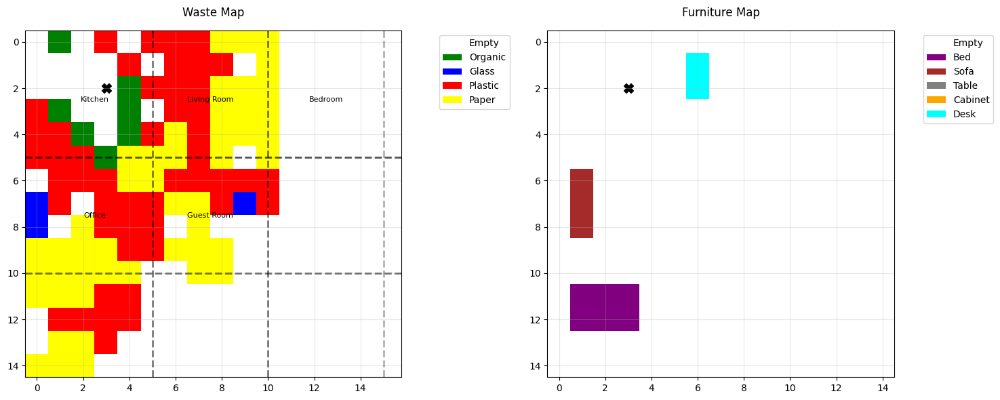

Step 11: Reward = 0.489, Total = 256.93399999999997


<Figure size 1600x2000 with 0 Axes>

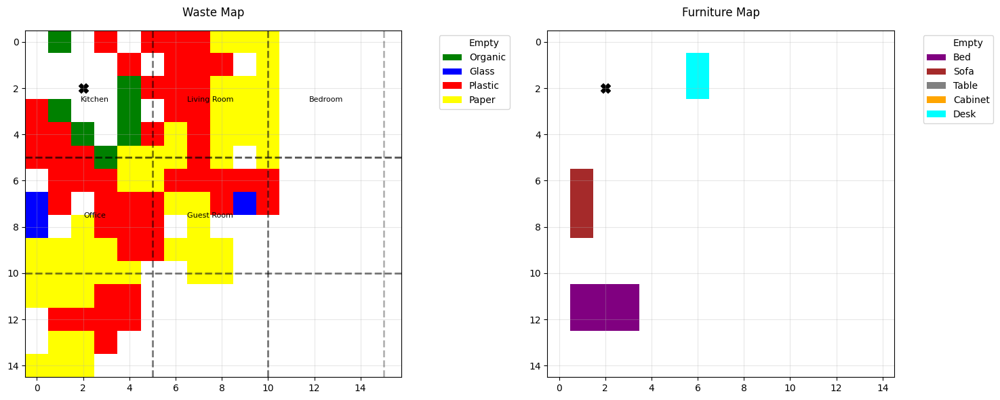

Step 12: Reward = 1.488, Total = 258.42199999999997


<Figure size 1600x2000 with 0 Axes>

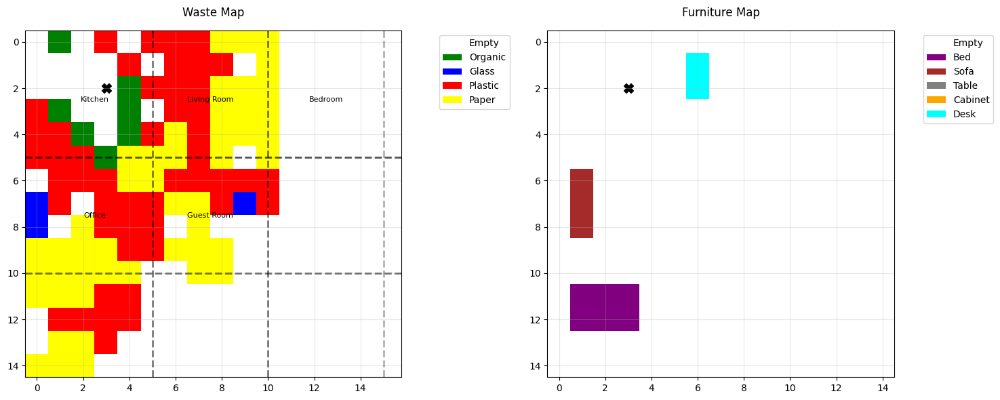

Step 13: Reward = 1.487, Total = 259.909


<Figure size 1600x2000 with 0 Axes>

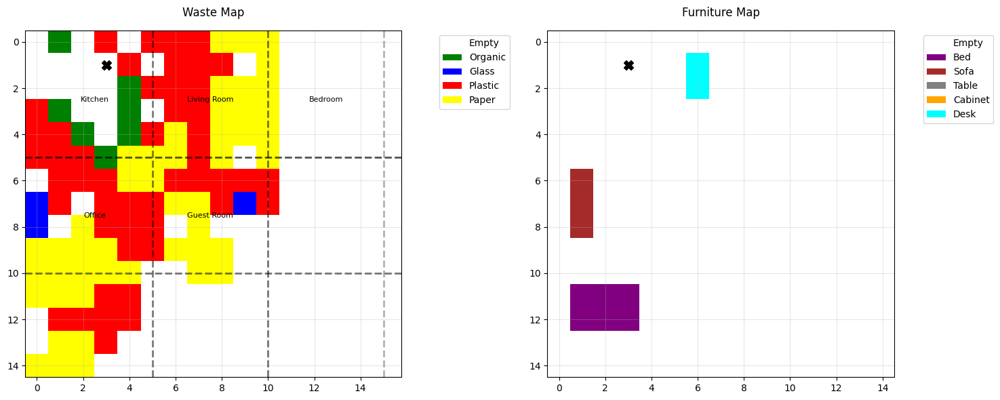

Step 14: Reward = 0.986, Total = 260.895


<Figure size 1600x2000 with 0 Axes>

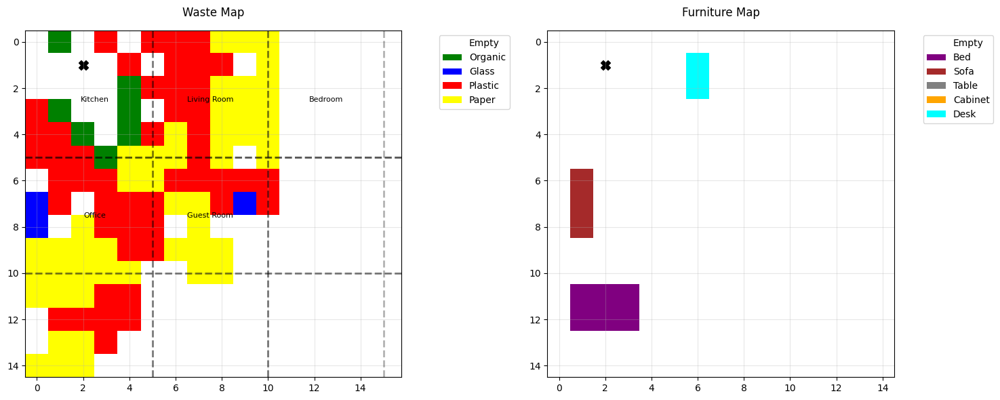

Step 15: Reward = 0.485, Total = 261.38


<Figure size 1600x2000 with 0 Axes>

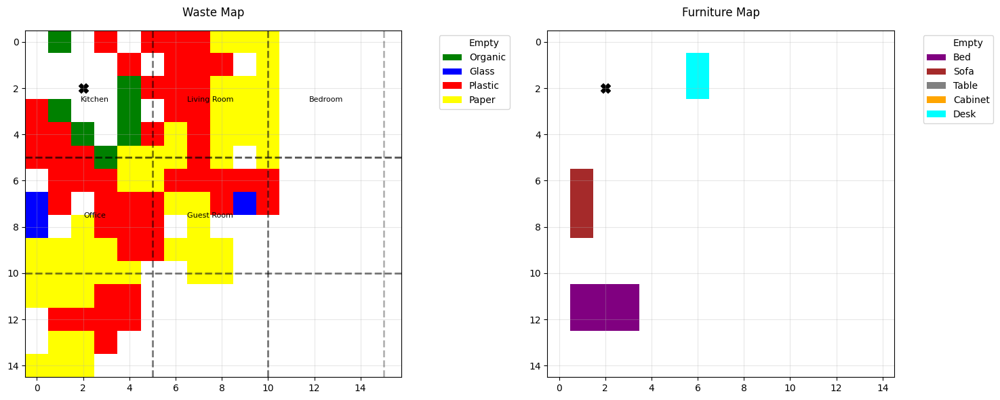

Step 16: Reward = 1.484, Total = 262.864


<Figure size 1600x2000 with 0 Axes>

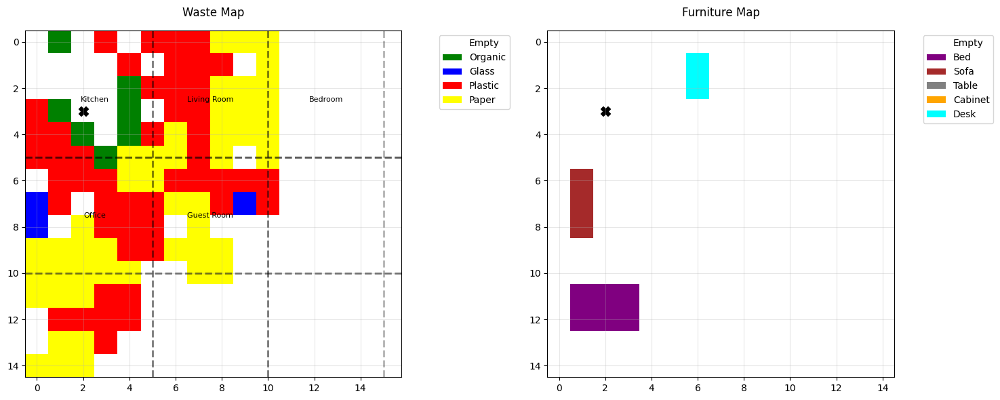

Step 17: Reward = 32.483000000000004, Total = 295.347


<Figure size 1600x2000 with 0 Axes>

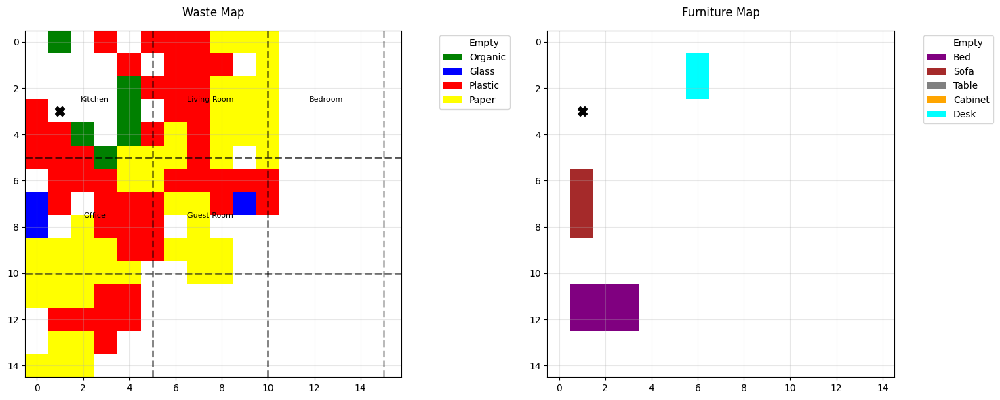

Step 18: Reward = 0.982, Total = 296.329


<Figure size 1600x2000 with 0 Axes>

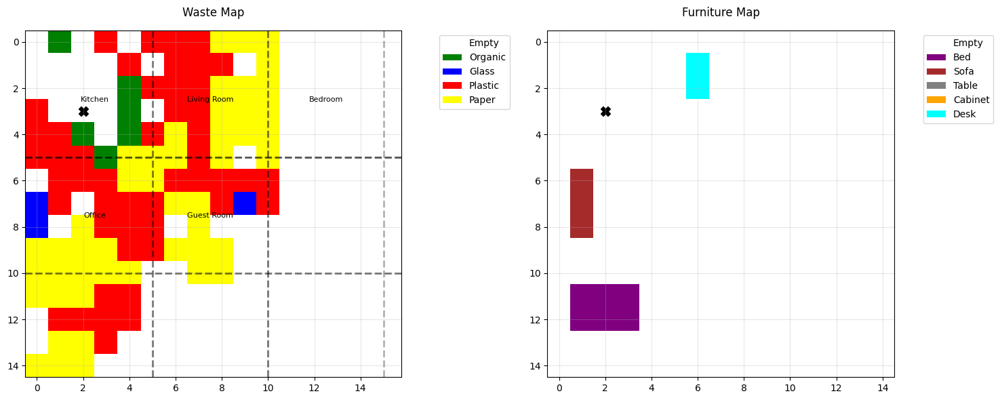

Step 19: Reward = 1.981, Total = 298.31


<Figure size 1600x2000 with 0 Axes>

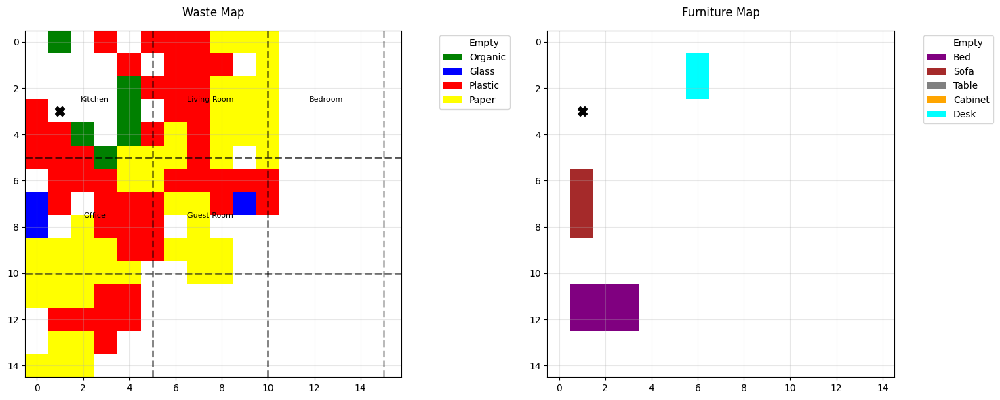

Step 20: Reward = 28.48, Total = 326.79


<Figure size 1600x2000 with 0 Axes>

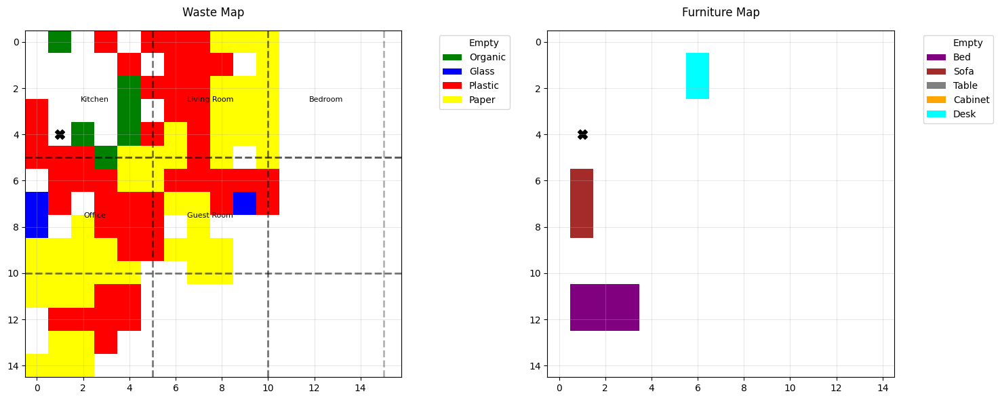

Step 21: Reward = 31.979, Total = 358.769


<Figure size 1600x2000 with 0 Axes>

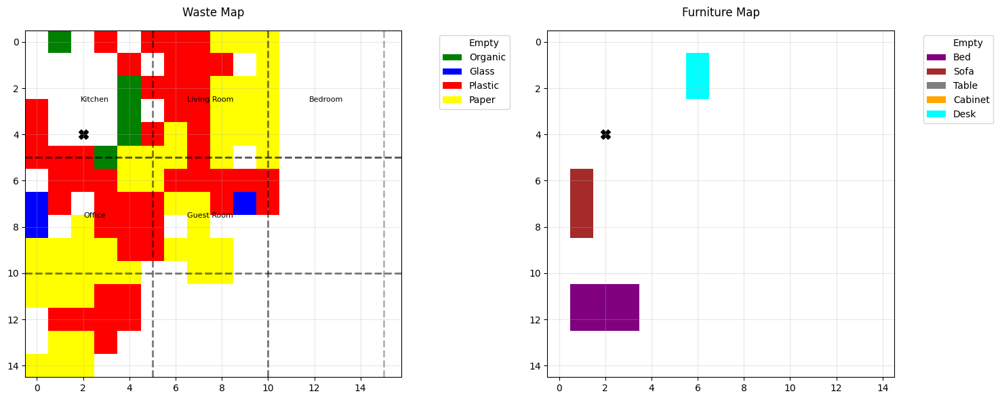

Step 22: Reward = 2.478, Total = 361.247


<Figure size 1600x2000 with 0 Axes>

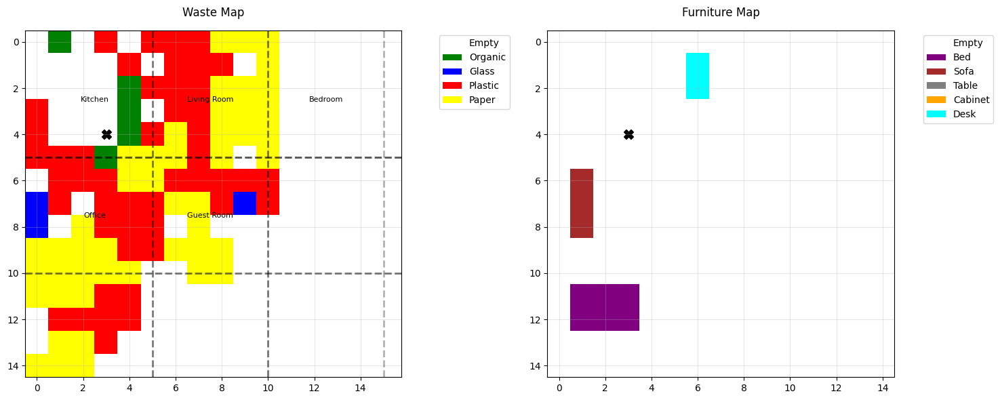

Step 23: Reward = 1.477, Total = 362.724


<Figure size 1600x2000 with 0 Axes>

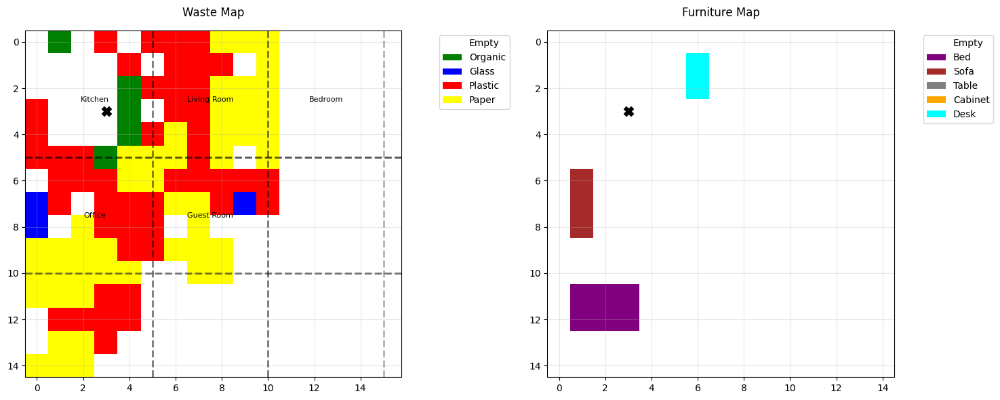

Step 24: Reward = -0.024, Total = 362.7


<Figure size 1600x2000 with 0 Axes>

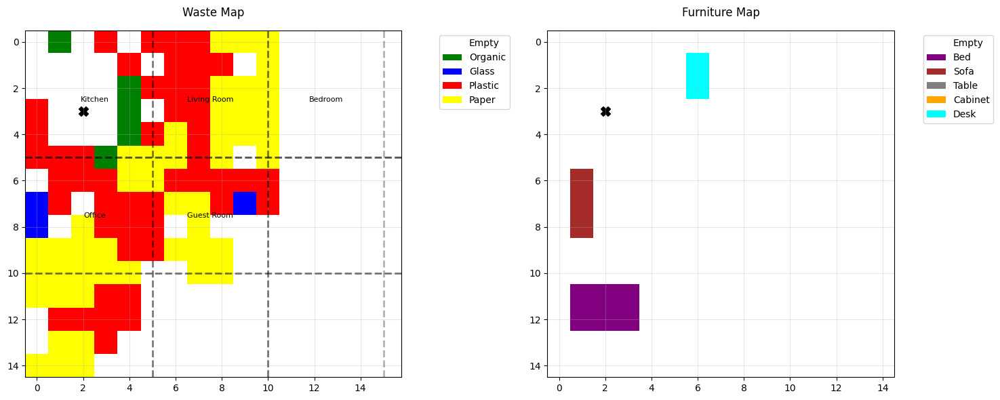

Step 25: Reward = 1.475, Total = 364.175


<Figure size 1600x2000 with 0 Axes>

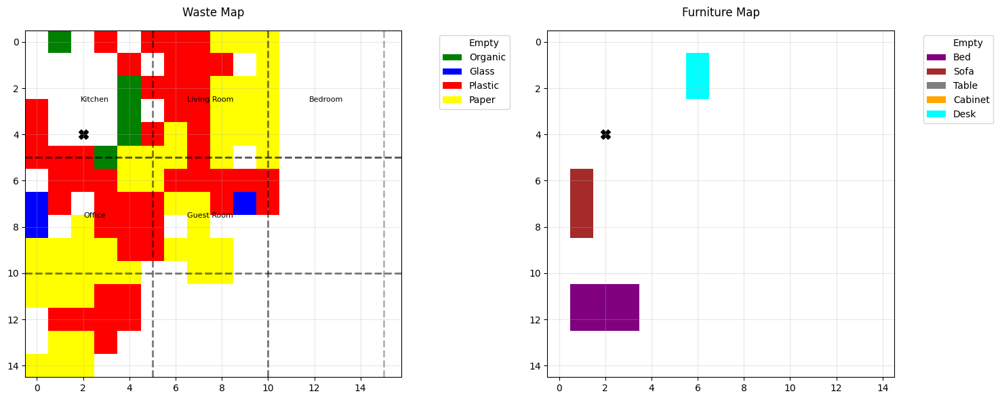

Step 26: Reward = -0.026000000000000002, Total = 364.149


<Figure size 1600x2000 with 0 Axes>

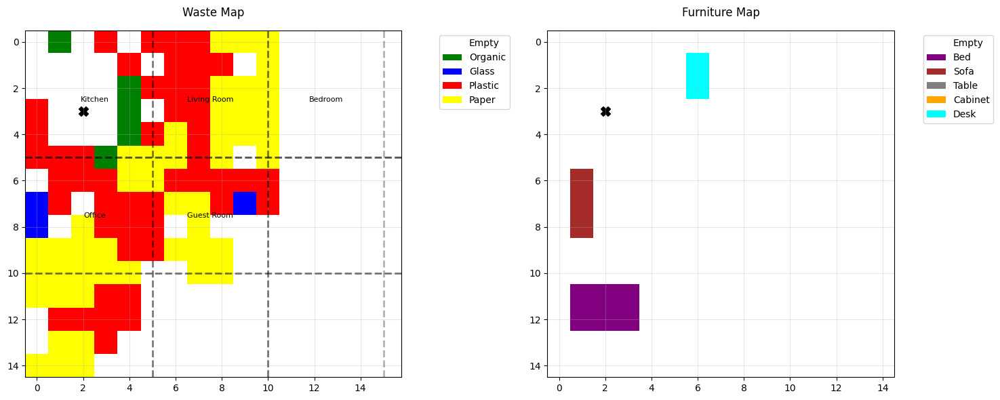

Step 27: Reward = -0.027, Total = 364.122


<Figure size 1600x2000 with 0 Axes>

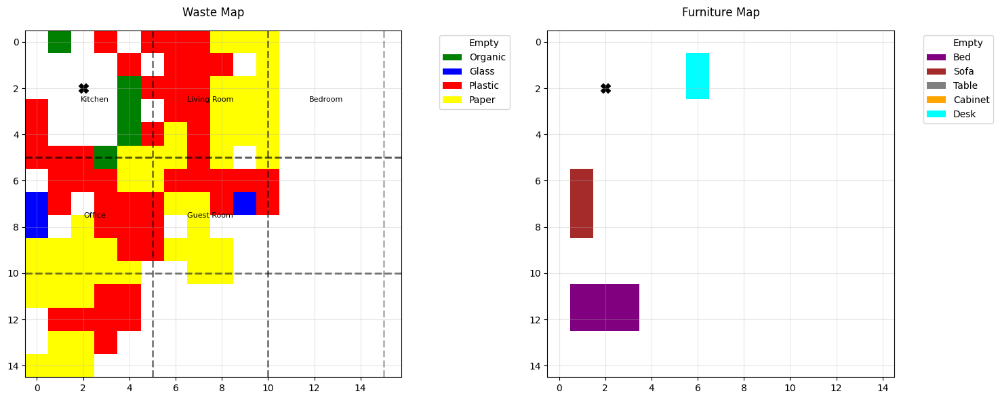

Step 28: Reward = -0.028, Total = 364.094


<Figure size 1600x2000 with 0 Axes>

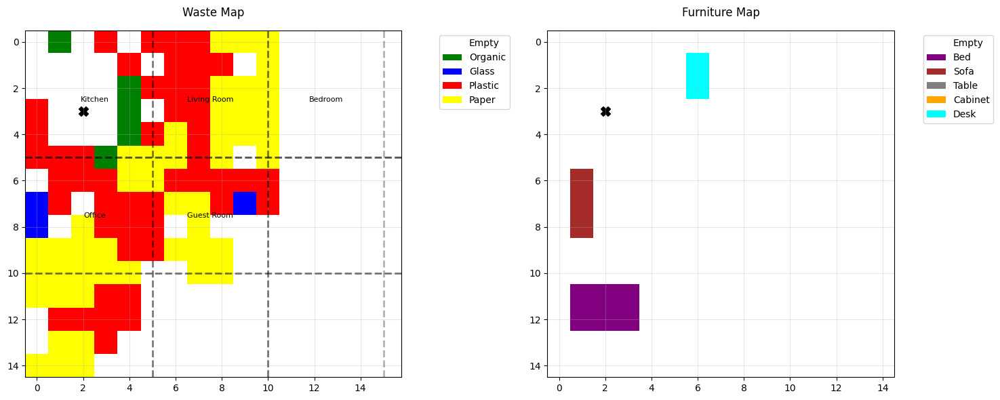

Step 29: Reward = 1.471, Total = 365.565


<Figure size 1600x2000 with 0 Axes>

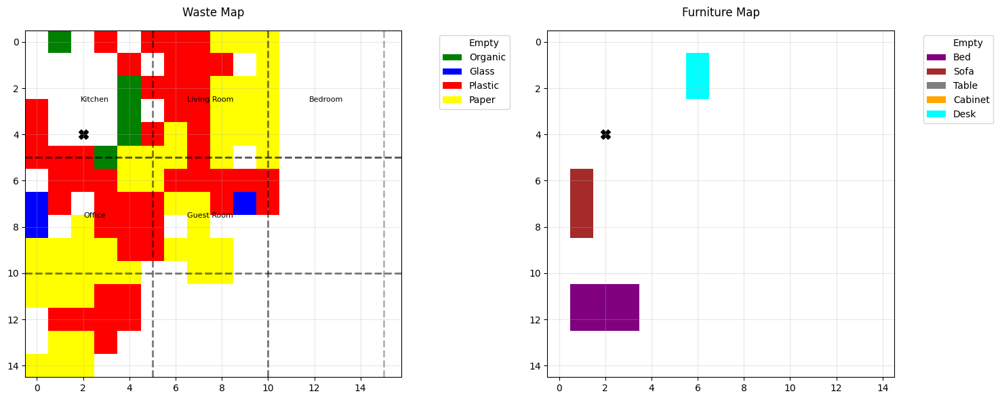

Step 30: Reward = 27.97, Total = 393.53499999999997


<Figure size 1600x2000 with 0 Axes>

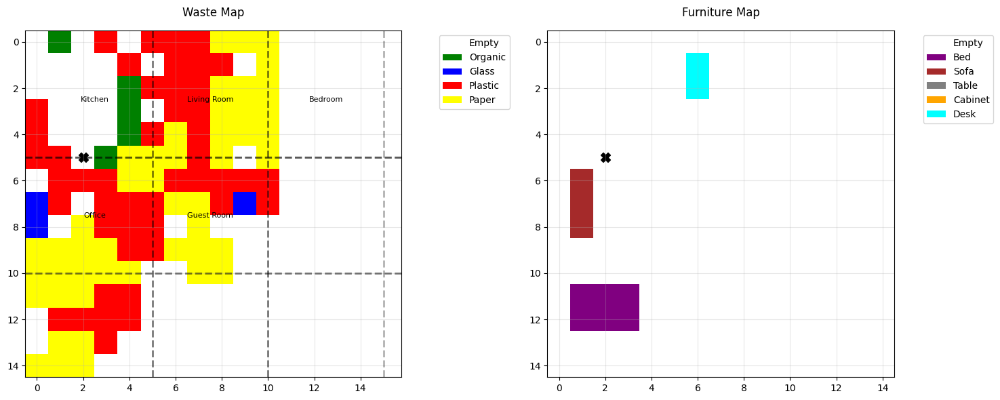

Step 31: Reward = 0.969, Total = 394.50399999999996


<Figure size 1600x2000 with 0 Axes>

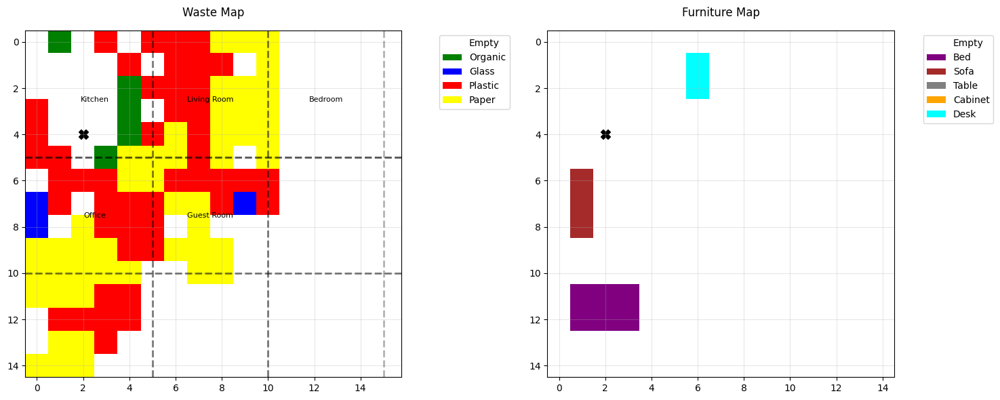

Step 32: Reward = 2.468, Total = 396.972


<Figure size 1600x2000 with 0 Axes>

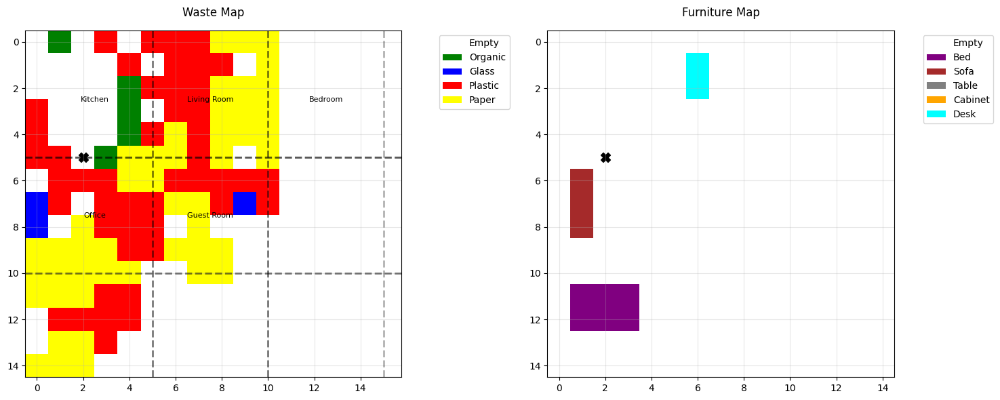

Step 33: Reward = 0.967, Total = 397.93899999999996


<Figure size 1600x2000 with 0 Axes>

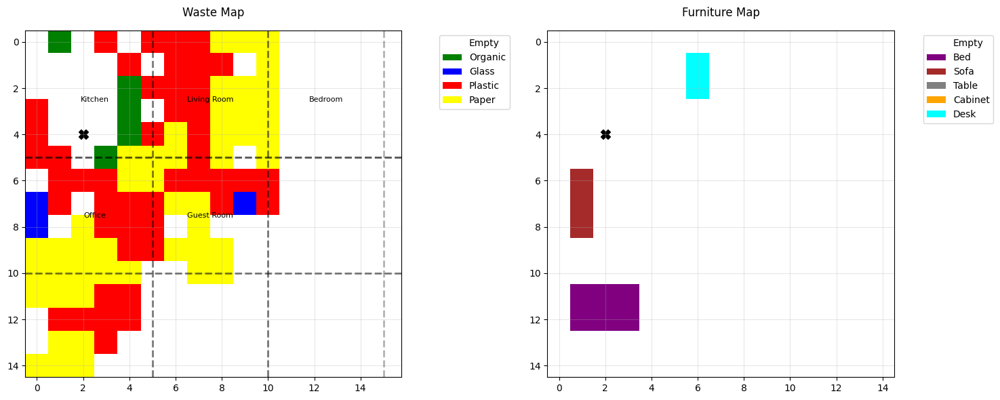

Step 34: Reward = 1.966, Total = 399.905


<Figure size 1600x2000 with 0 Axes>

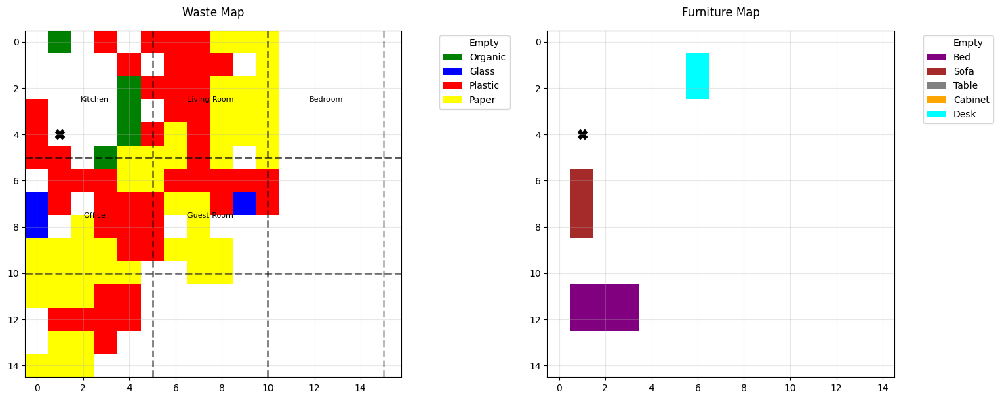

Step 35: Reward = 0.965, Total = 400.86999999999995


<Figure size 1600x2000 with 0 Axes>

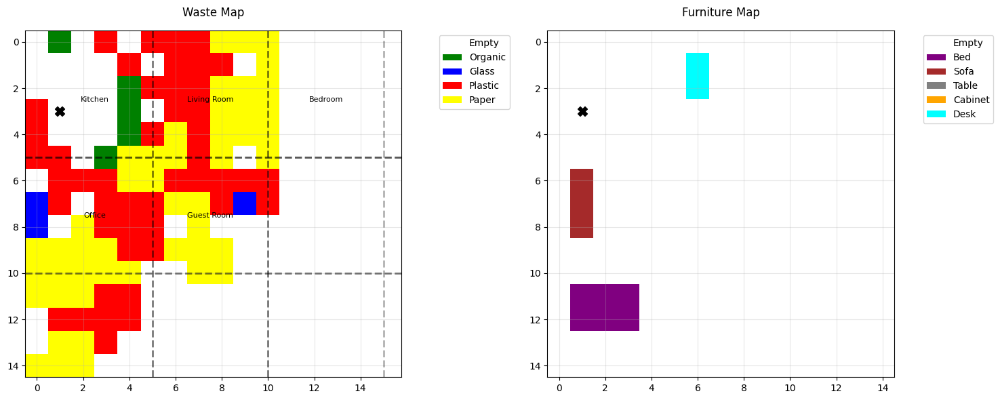

Step 36: Reward = 1.964, Total = 402.83399999999995


<Figure size 1600x2000 with 0 Axes>

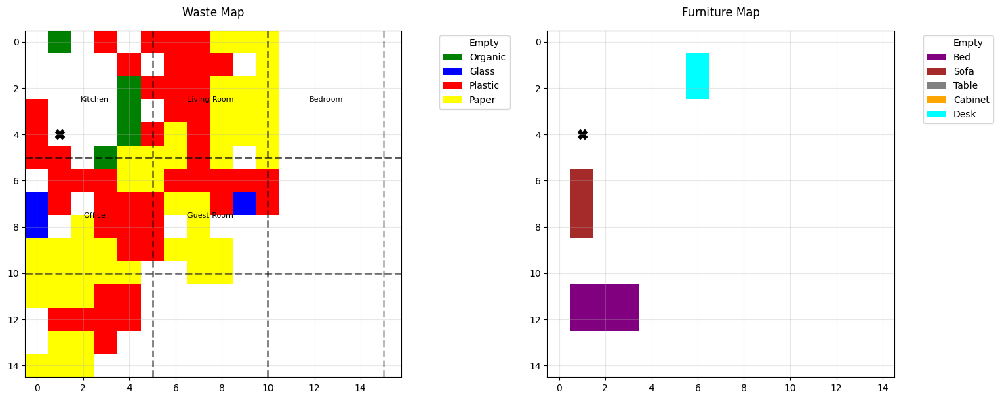

Step 37: Reward = 0.963, Total = 403.79699999999997


<Figure size 1600x2000 with 0 Axes>

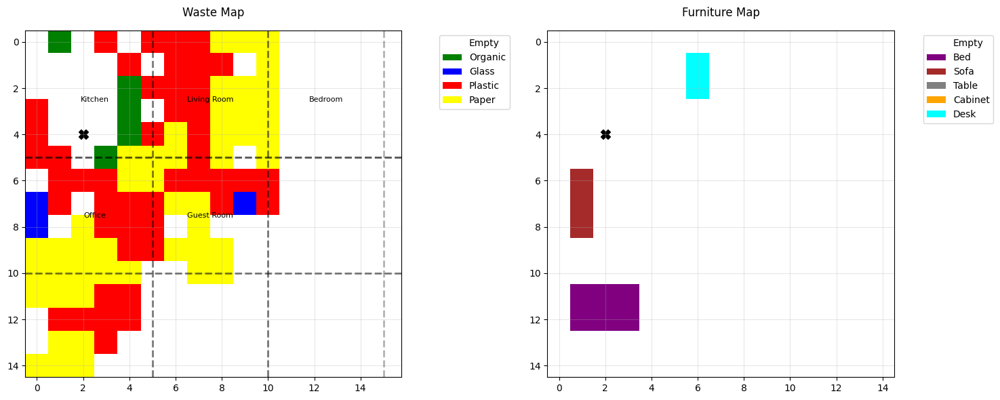

Step 38: Reward = 1.962, Total = 405.75899999999996


<Figure size 1600x2000 with 0 Axes>

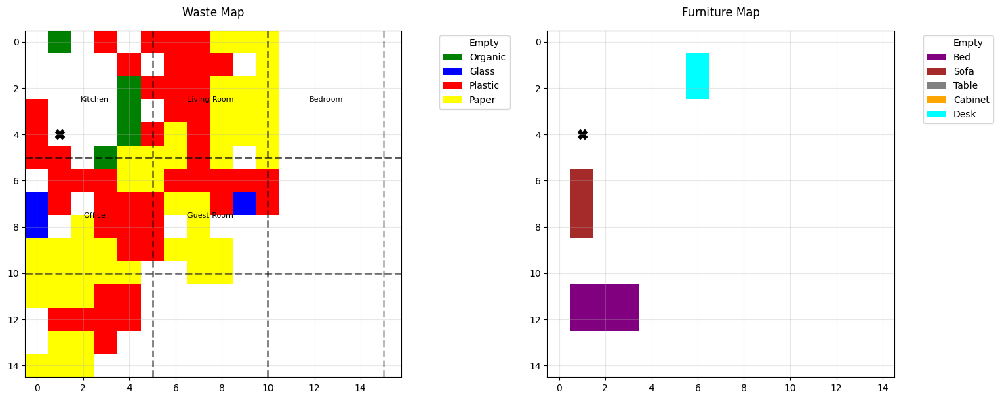

Step 39: Reward = 0.961, Total = 406.71999999999997


<Figure size 1600x2000 with 0 Axes>

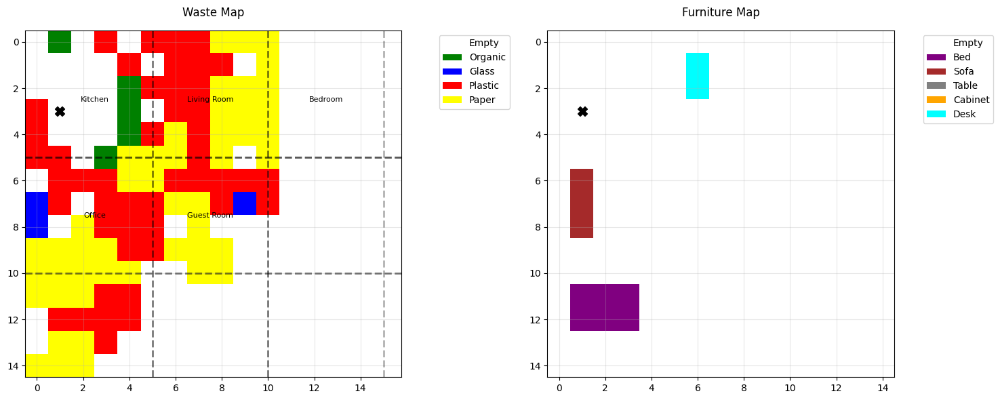

Step 40: Reward = 0.46, Total = 407.17999999999995


<Figure size 1600x2000 with 0 Axes>

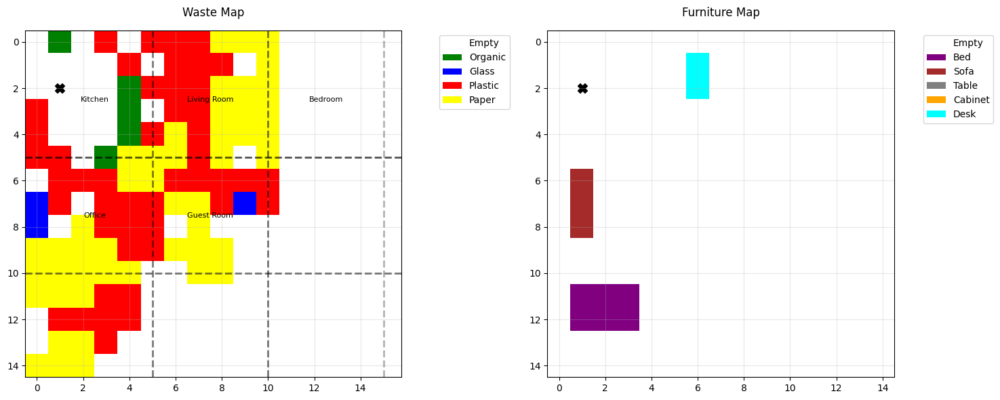

Step 41: Reward = 0.959, Total = 408.13899999999995


<Figure size 1600x2000 with 0 Axes>

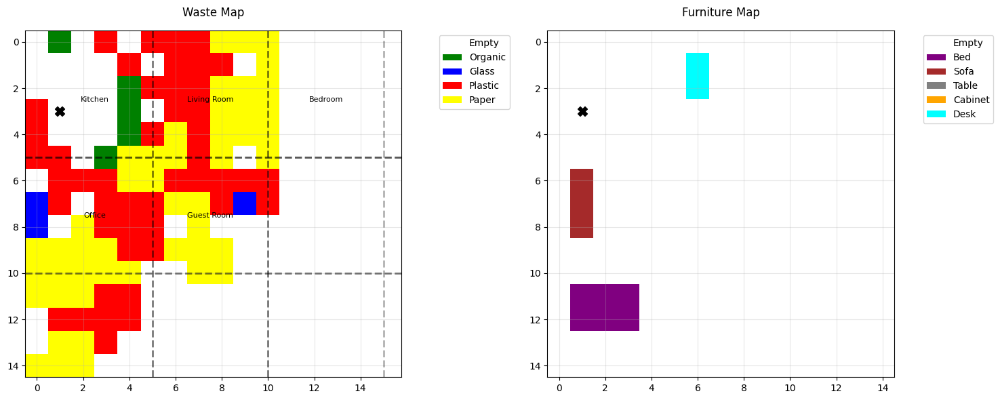

Step 42: Reward = 0.458, Total = 408.597


<Figure size 1600x2000 with 0 Axes>

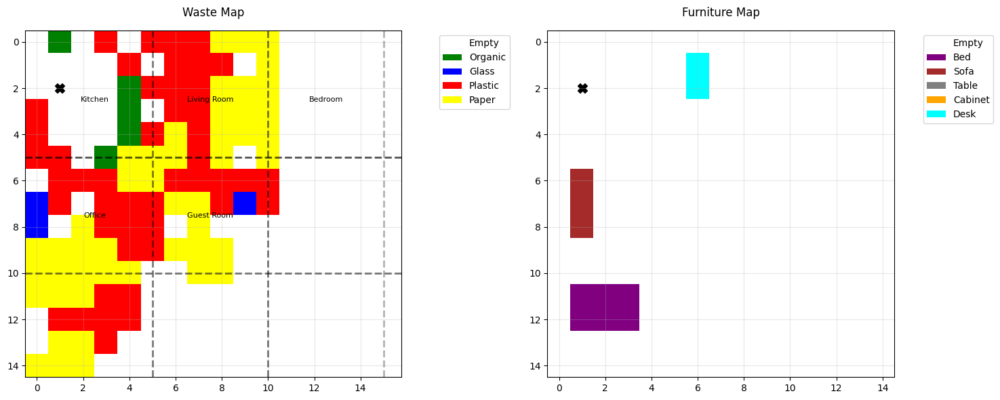

Step 43: Reward = 0.457, Total = 409.054


<Figure size 1600x2000 with 0 Axes>

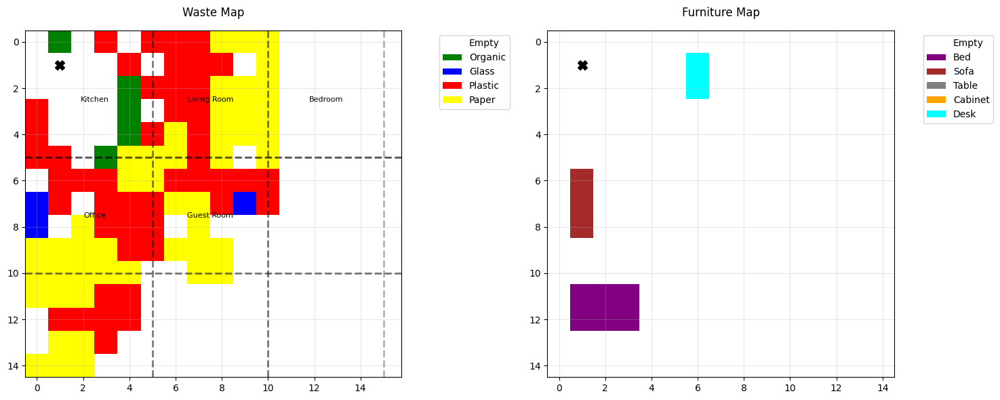

Step 44: Reward = 0.456, Total = 409.51


<Figure size 1600x2000 with 0 Axes>

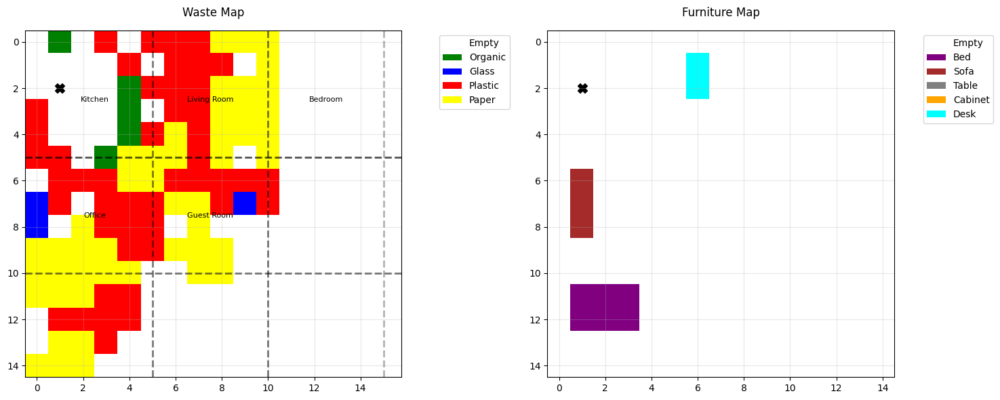

Step 45: Reward = 0.455, Total = 409.965


<Figure size 1600x2000 with 0 Axes>

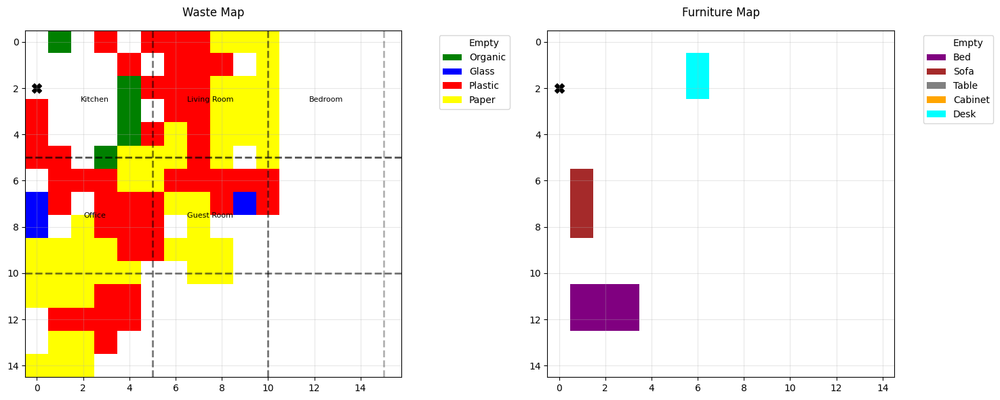

Step 46: Reward = 25.954, Total = 435.919


<Figure size 1600x2000 with 0 Axes>

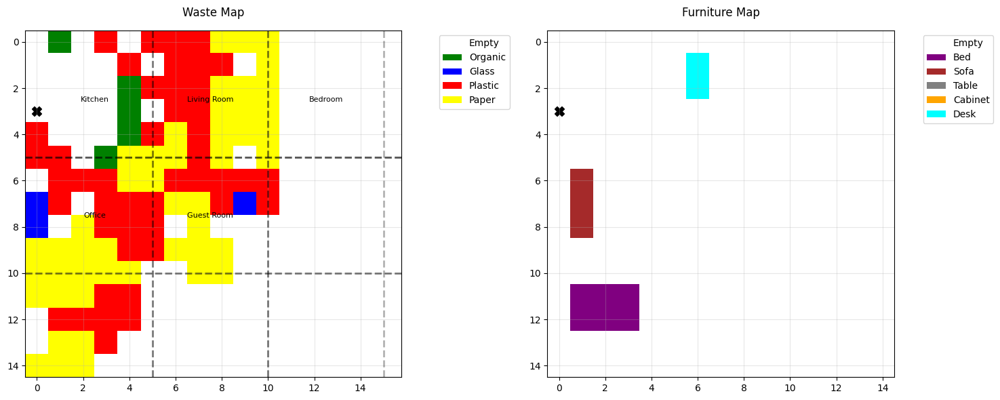

Step 47: Reward = 26.453, Total = 462.37199999999996


<Figure size 1600x2000 with 0 Axes>

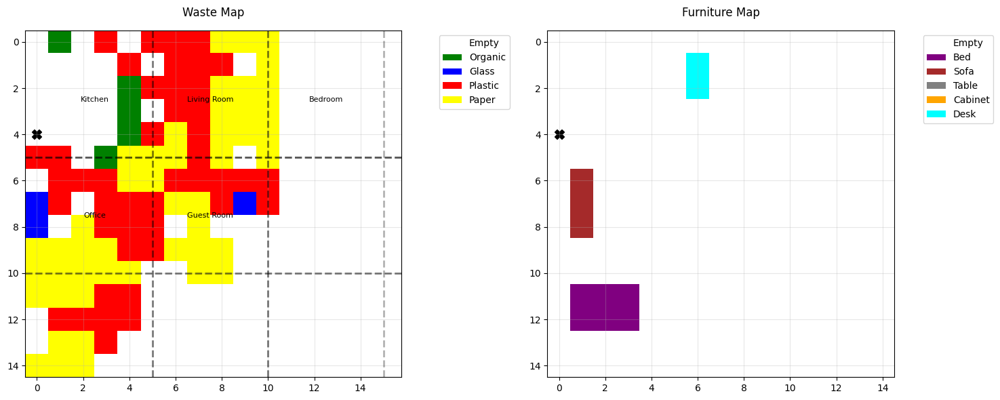

Step 48: Reward = 0.952, Total = 463.32399999999996


<Figure size 1600x2000 with 0 Axes>

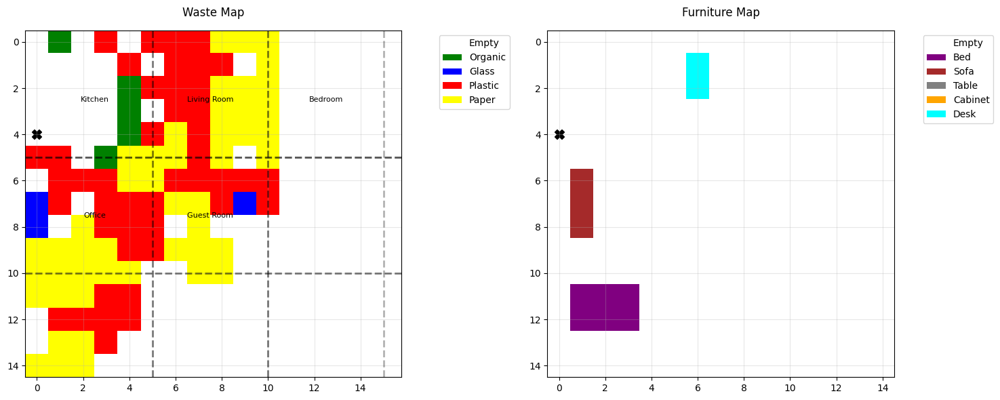

Step 49: Reward = 26.451, Total = 489.775


<Figure size 1600x2000 with 0 Axes>

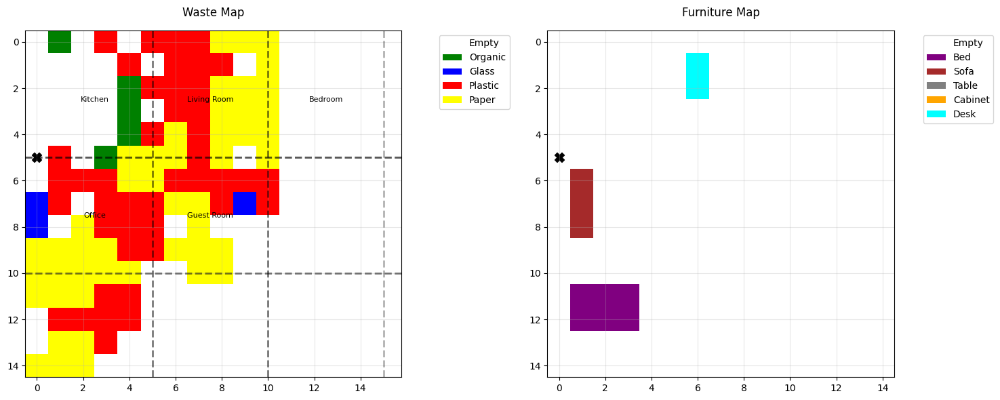

Step 50: Reward = 1.95, Total = 491.72499999999997


<Figure size 1600x2000 with 0 Axes>

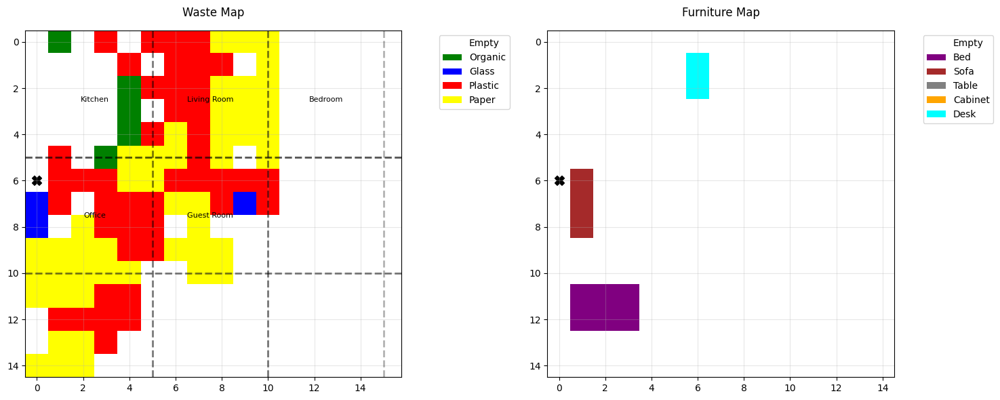

Step 51: Reward = 36.949, Total = 528.674


<Figure size 1600x2000 with 0 Axes>

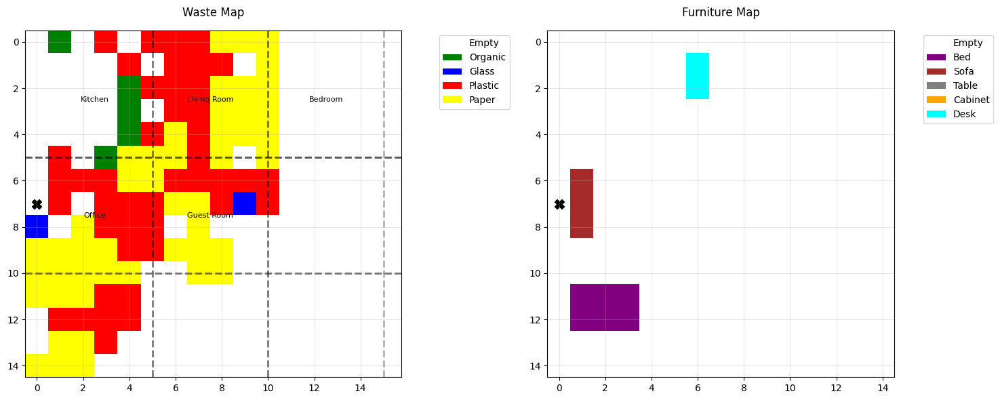

Step 52: Reward = 1.448, Total = 530.122


<Figure size 1600x2000 with 0 Axes>

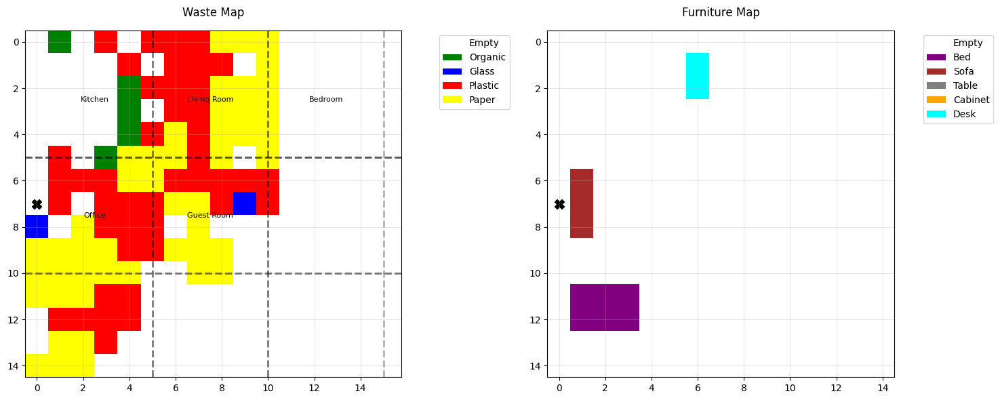

Step 53: Reward = 1.447, Total = 531.569


<Figure size 1600x2000 with 0 Axes>

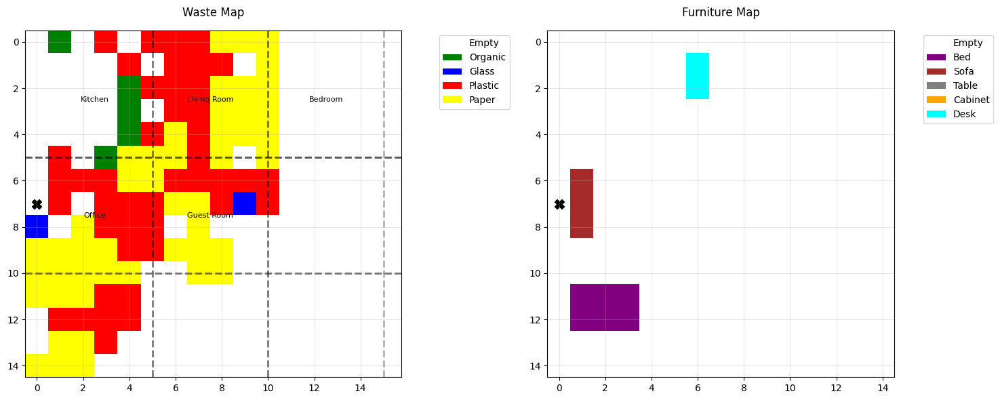

Step 54: Reward = 36.946, Total = 568.515


<Figure size 1600x2000 with 0 Axes>

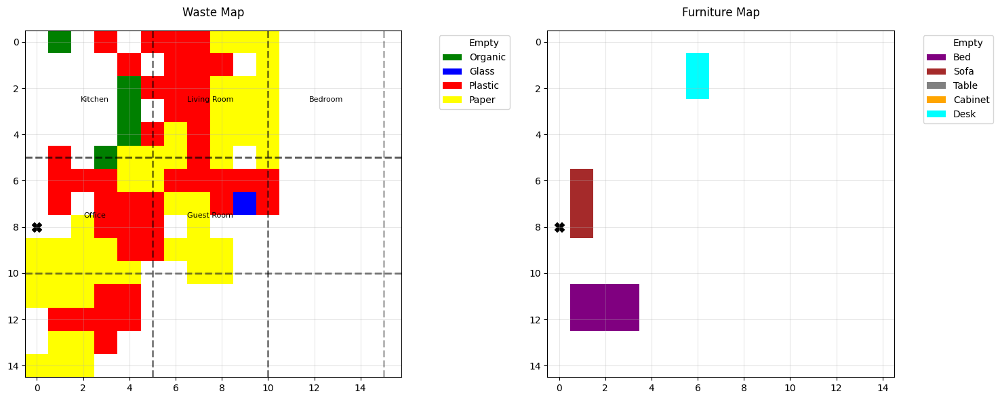

Step 55: Reward = 21.945, Total = 590.46


<Figure size 1600x2000 with 0 Axes>

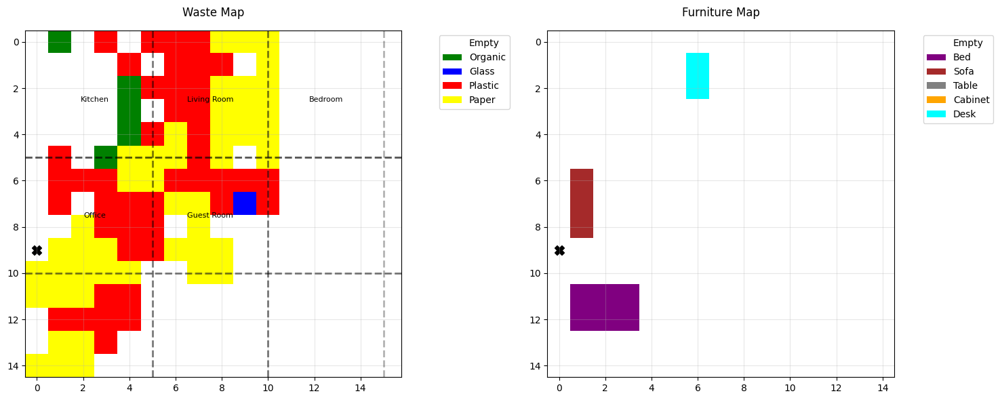

Step 56: Reward = 22.444000000000003, Total = 612.904


<Figure size 1600x2000 with 0 Axes>

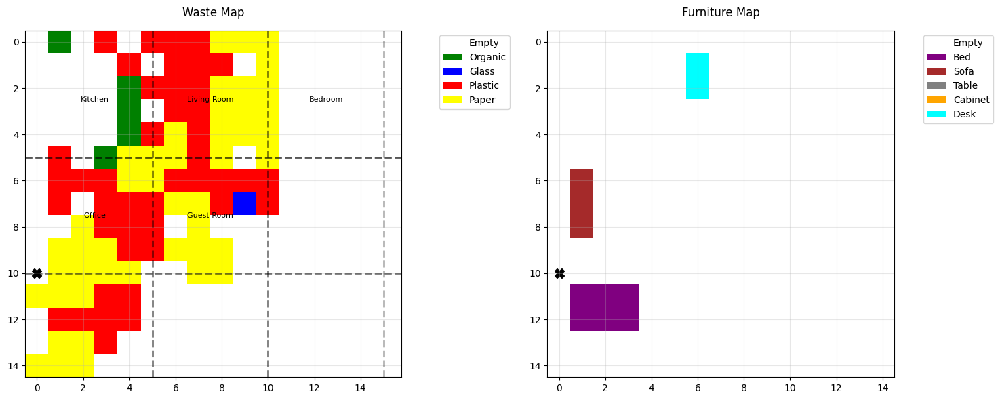

Step 57: Reward = 1.943, Total = 614.847


<Figure size 1600x2000 with 0 Axes>

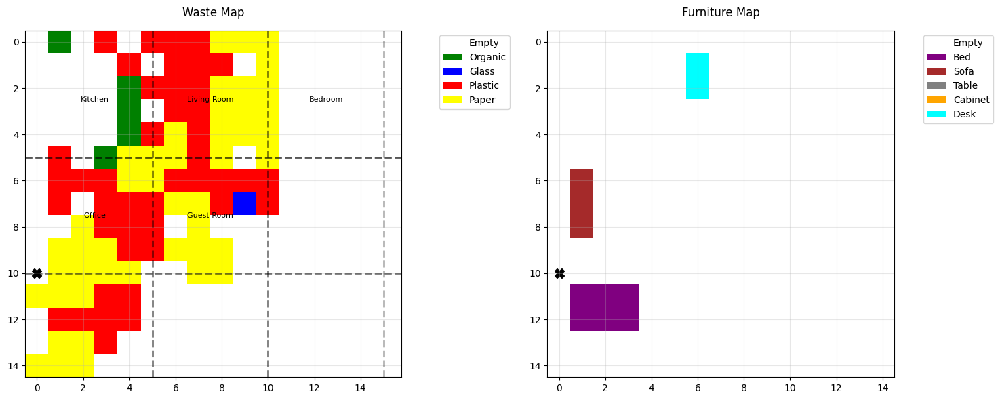

Step 58: Reward = 21.942, Total = 636.789


<Figure size 1600x2000 with 0 Axes>

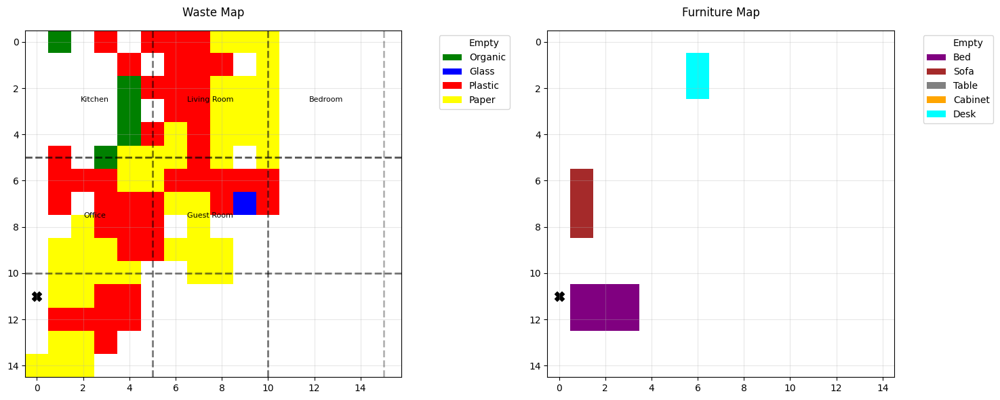

Step 59: Reward = -2, Total = 634.789


<Figure size 1600x2000 with 0 Axes>

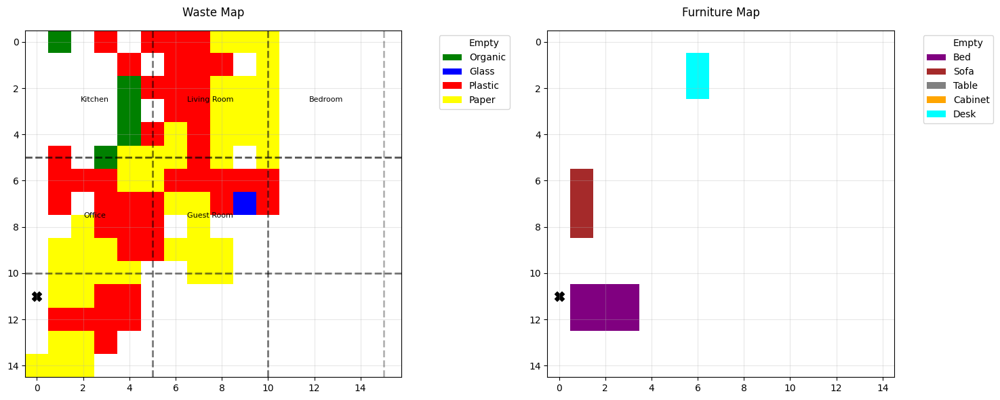

Step 60: Reward = 1.44, Total = 636.229


<Figure size 1600x2000 with 0 Axes>

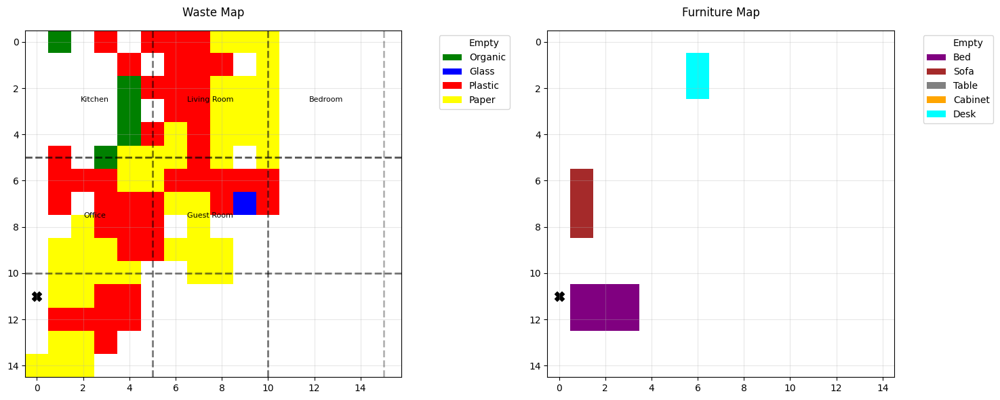

Step 61: Reward = 1.439, Total = 637.668


<Figure size 1600x2000 with 0 Axes>

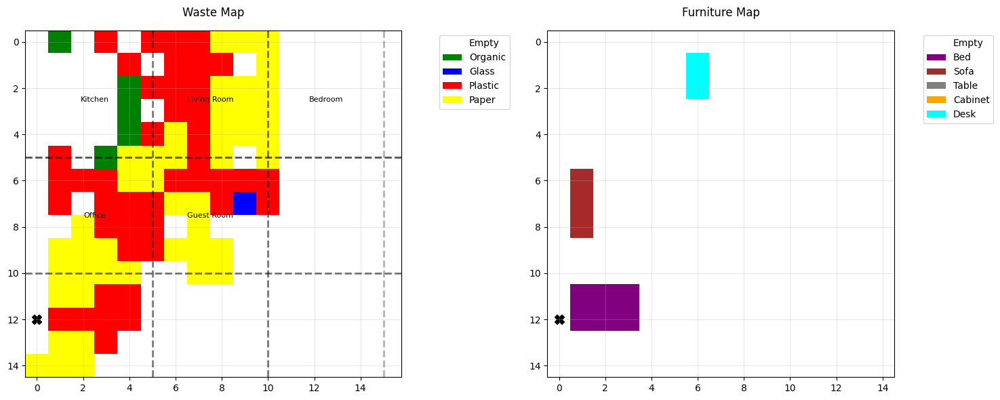

Step 62: Reward = 1.438, Total = 639.106


<Figure size 1600x2000 with 0 Axes>

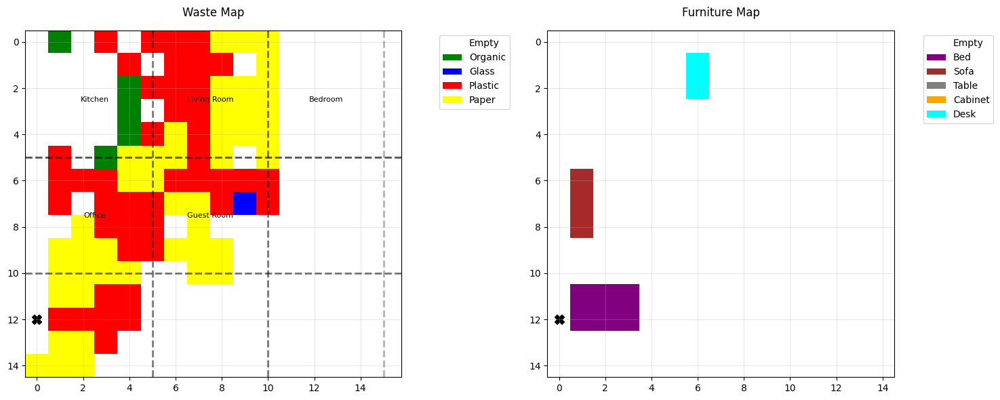

Step 63: Reward = 1.937, Total = 641.043


<Figure size 1600x2000 with 0 Axes>

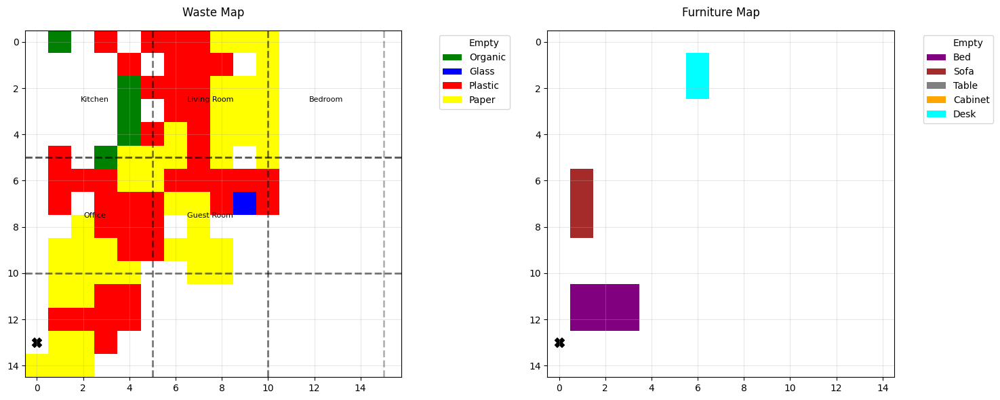

Step 64: Reward = 1.936, Total = 642.979


<Figure size 1600x2000 with 0 Axes>

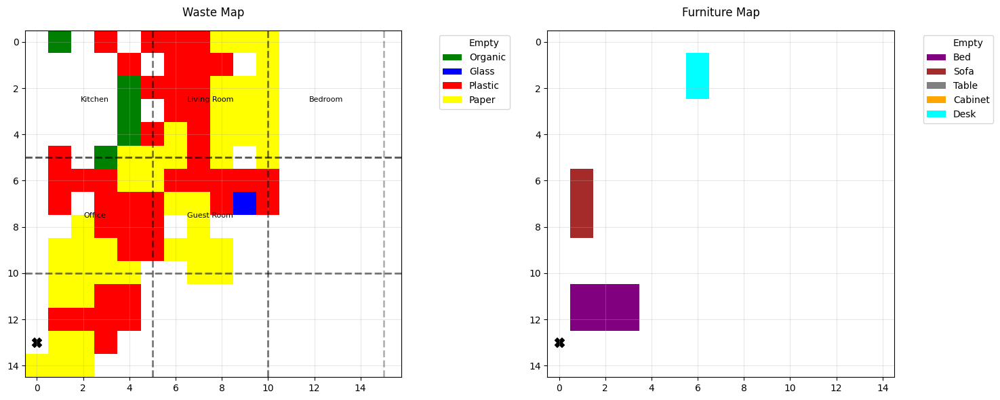

Step 65: Reward = 21.435000000000002, Total = 664.414


<Figure size 1600x2000 with 0 Axes>

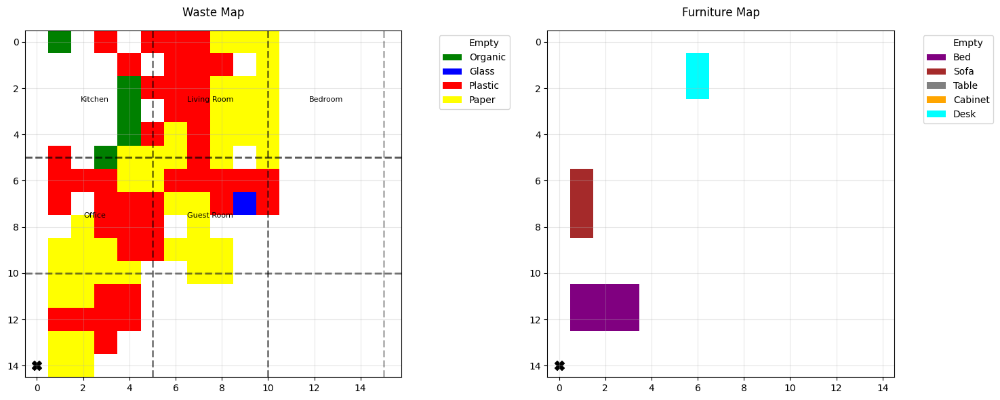

Step 66: Reward = 0.9339999999999999, Total = 665.348


<Figure size 1600x2000 with 0 Axes>

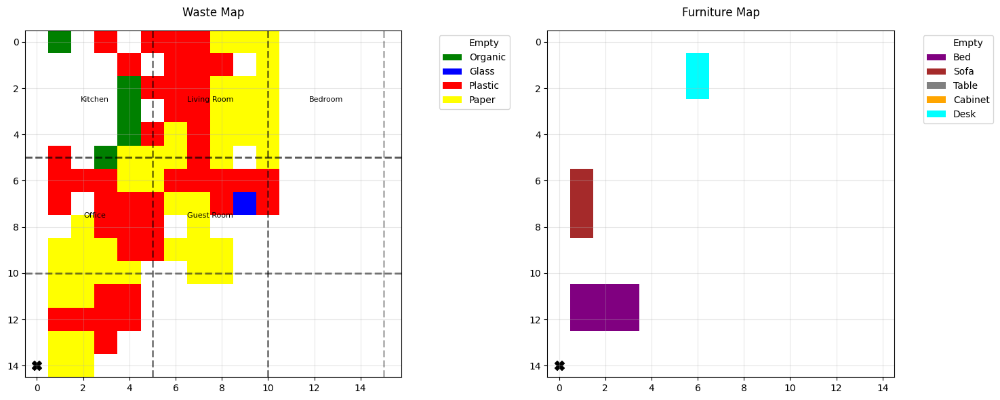

Step 67: Reward = 0.933, Total = 666.281


<Figure size 1600x2000 with 0 Axes>

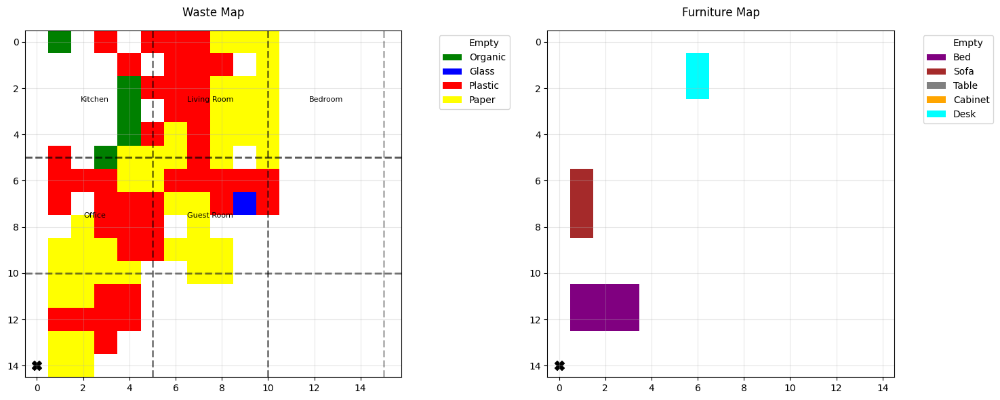

Step 68: Reward = 0.9319999999999999, Total = 667.213


<Figure size 1600x2000 with 0 Axes>

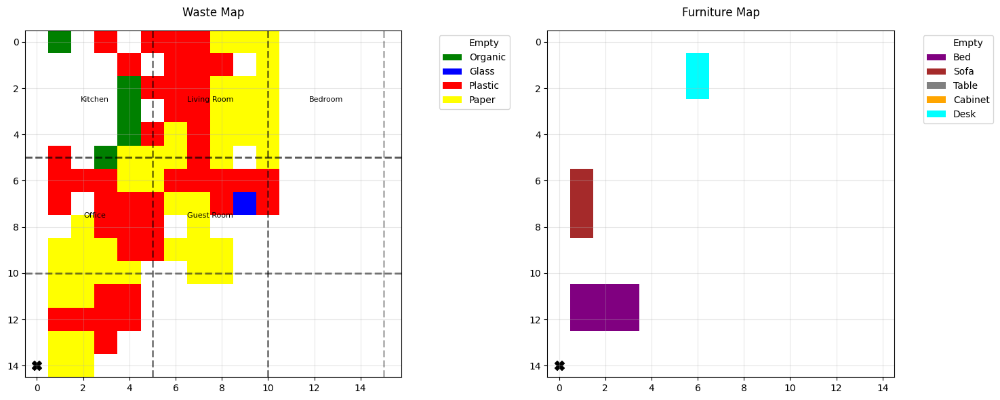

Step 69: Reward = 0.931, Total = 668.144


<Figure size 1600x2000 with 0 Axes>

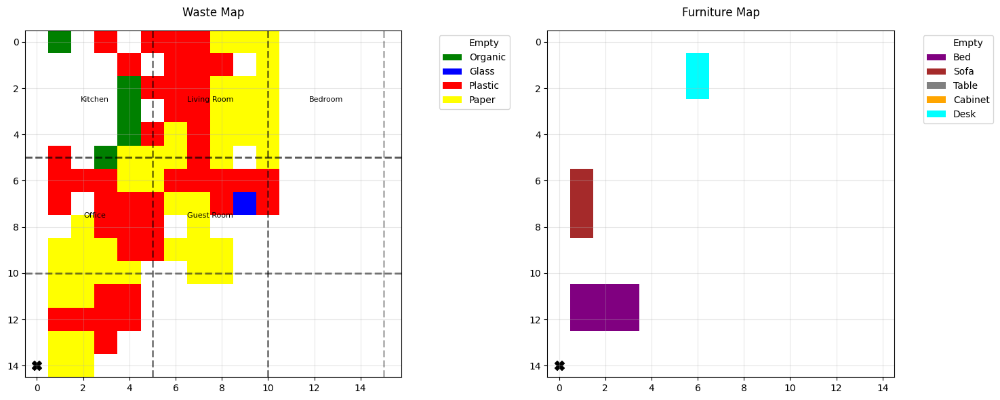

Step 70: Reward = 0.9299999999999999, Total = 669.074


<Figure size 1600x2000 with 0 Axes>

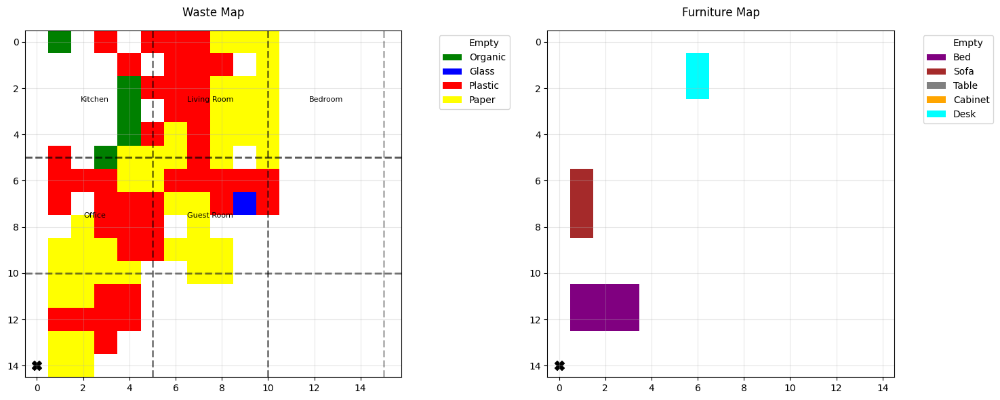

Step 71: Reward = 0.929, Total = 670.0029999999999


<Figure size 1600x2000 with 0 Axes>

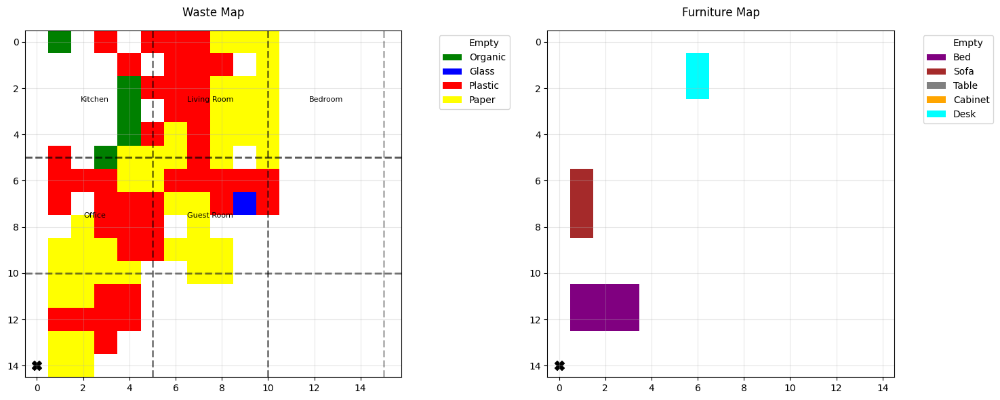

Step 72: Reward = 0.9279999999999999, Total = 670.9309999999999


<Figure size 1600x2000 with 0 Axes>

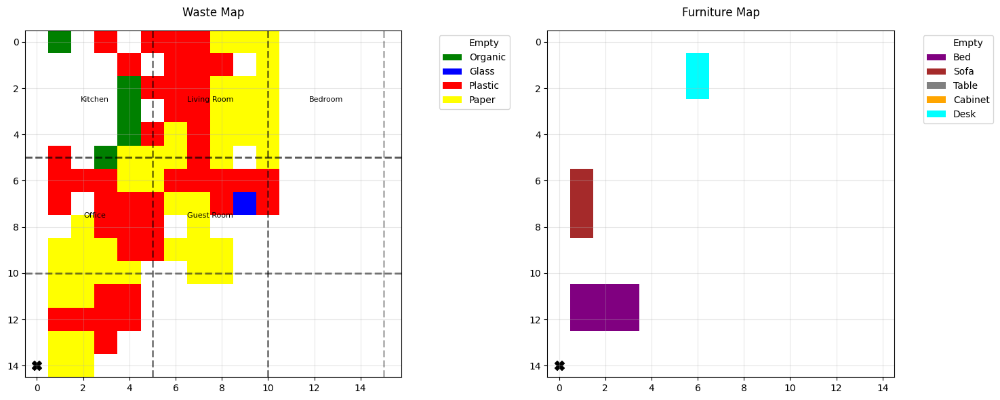

Step 73: Reward = 1.427, Total = 672.358


<Figure size 1600x2000 with 0 Axes>

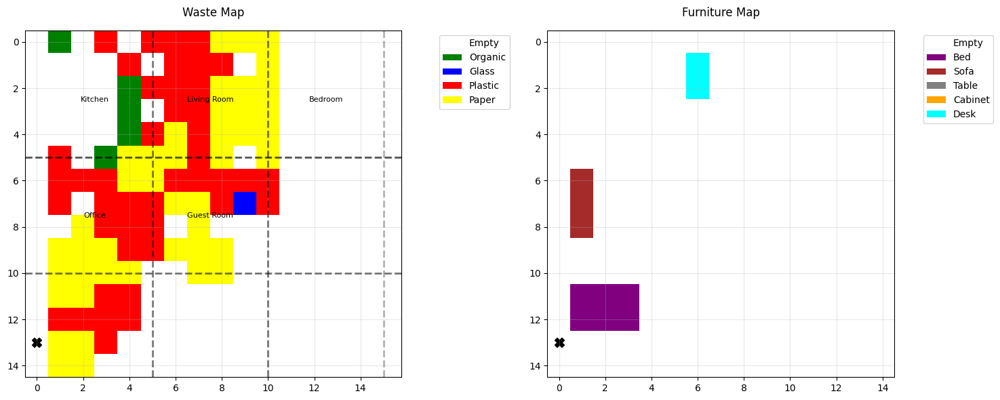

Step 74: Reward = 0.926, Total = 673.284


<Figure size 1600x2000 with 0 Axes>

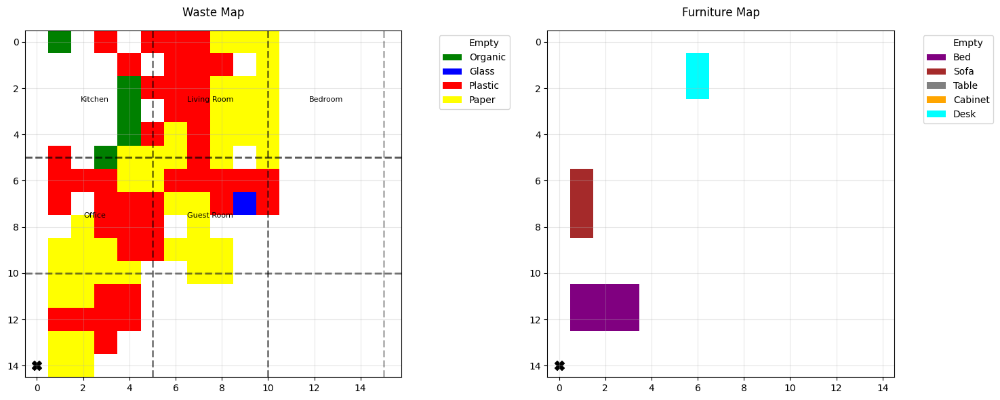

Step 75: Reward = 0.925, Total = 674.209


<Figure size 1600x2000 with 0 Axes>

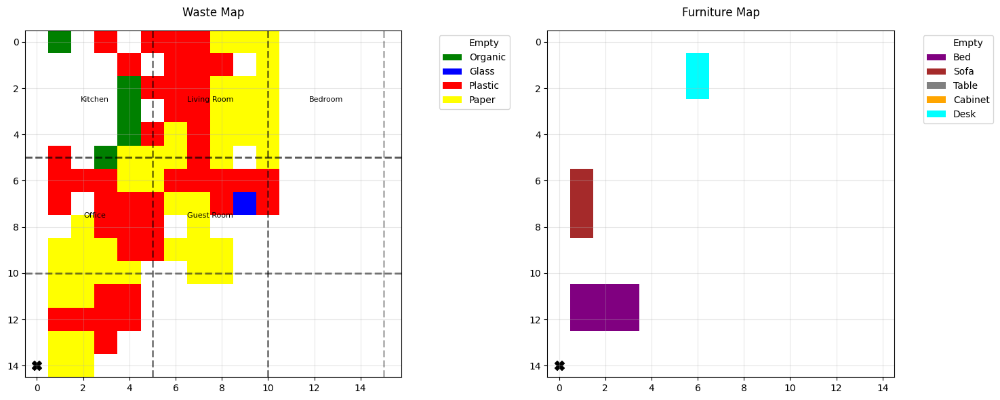

Step 76: Reward = 0.924, Total = 675.1329999999999


<Figure size 1600x2000 with 0 Axes>

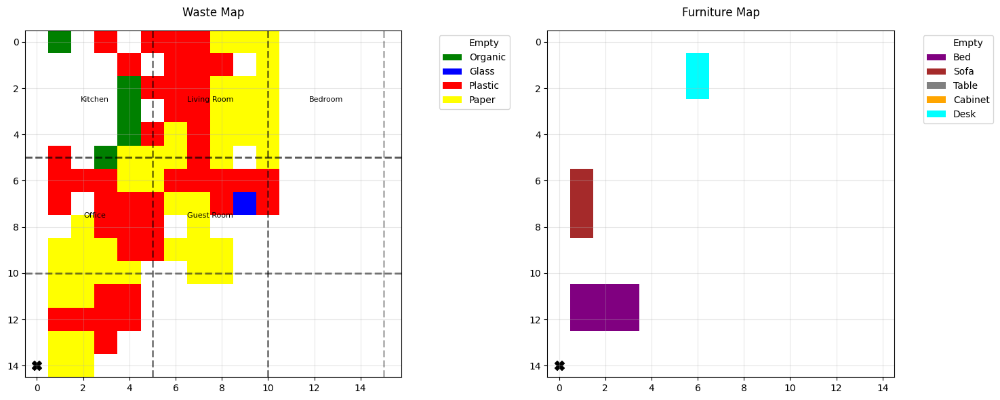

Step 77: Reward = 21.923000000000002, Total = 697.0559999999999


<Figure size 1600x2000 with 0 Axes>

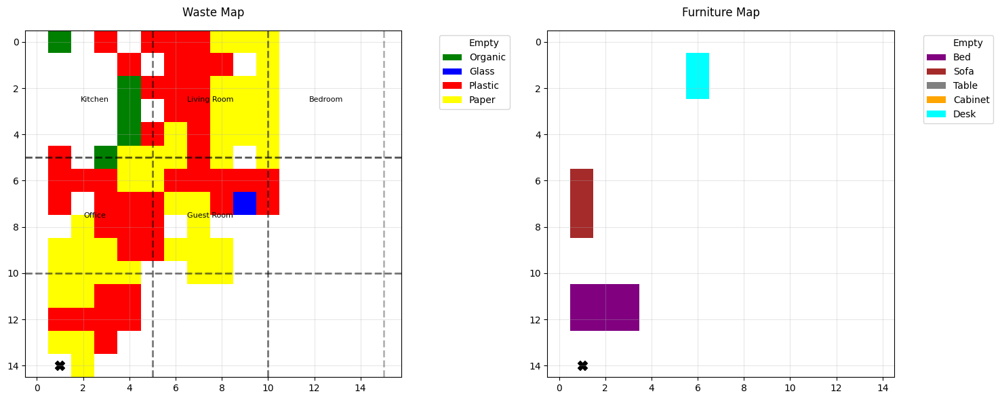

Step 78: Reward = 21.922, Total = 718.978


<Figure size 1600x2000 with 0 Axes>

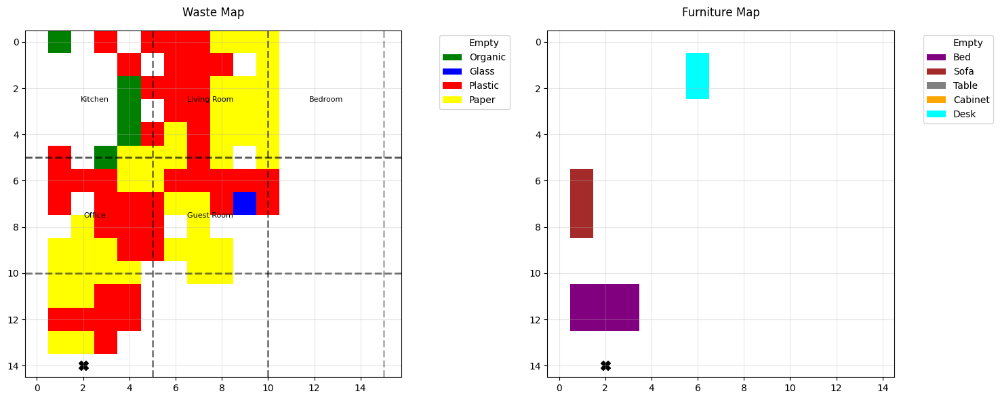

Step 79: Reward = 0.921, Total = 719.899


<Figure size 1600x2000 with 0 Axes>

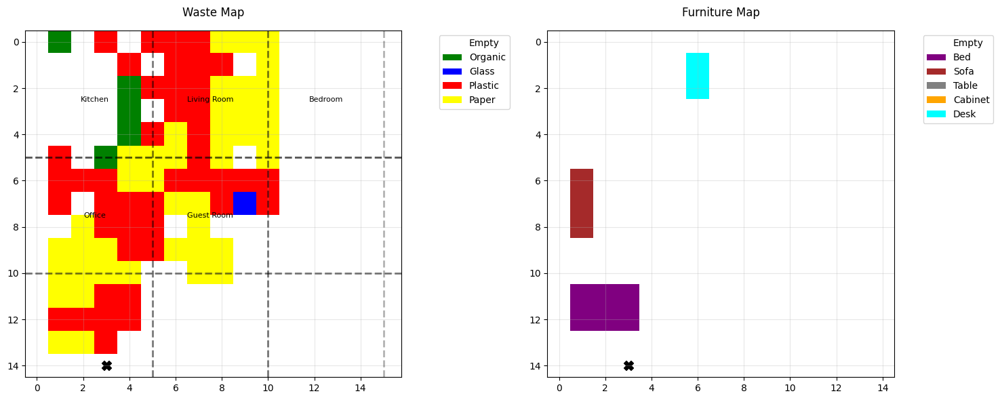

Step 80: Reward = 0.92, Total = 720.819


<Figure size 1600x2000 with 0 Axes>

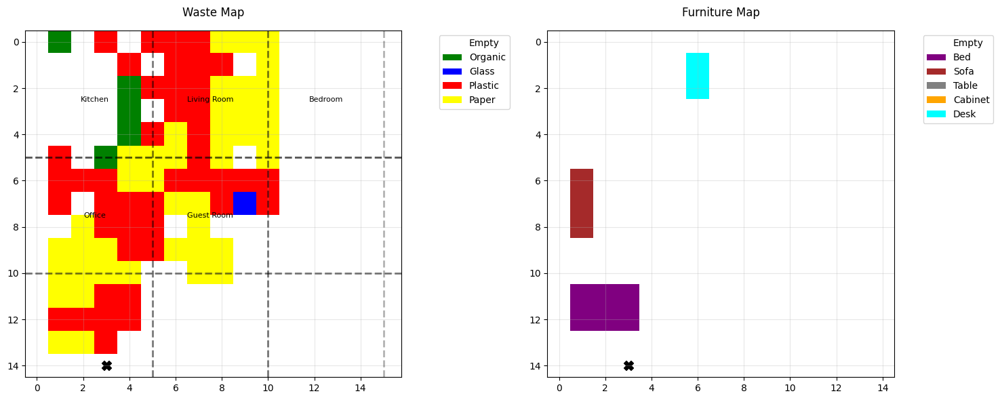

Step 81: Reward = 27.419, Total = 748.2379999999999


<Figure size 1600x2000 with 0 Axes>

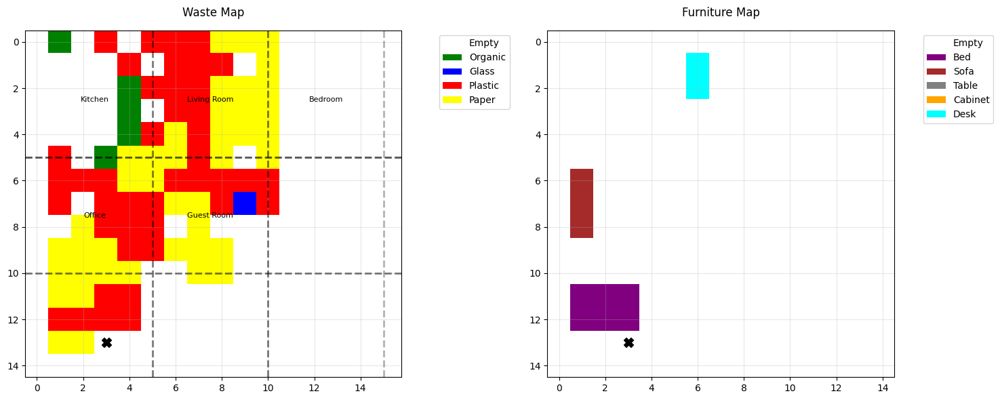

Step 82: Reward = 0.418, Total = 748.656


<Figure size 1600x2000 with 0 Axes>

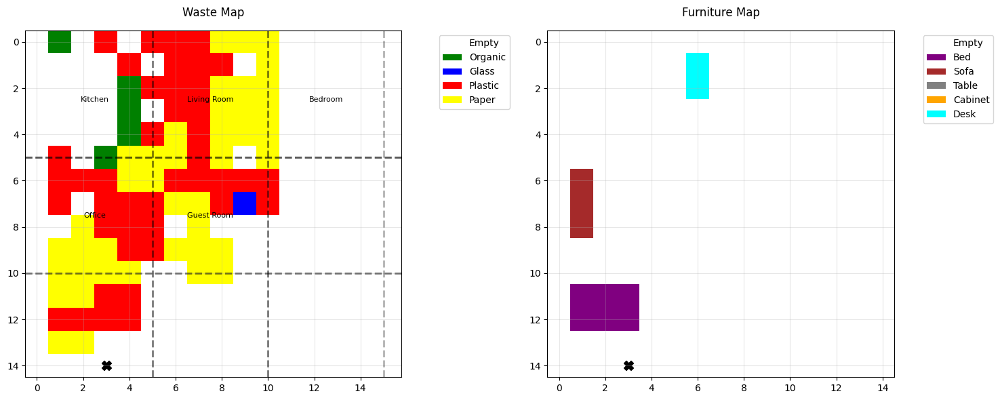

Step 83: Reward = -0.083, Total = 748.573


<Figure size 1600x2000 with 0 Axes>

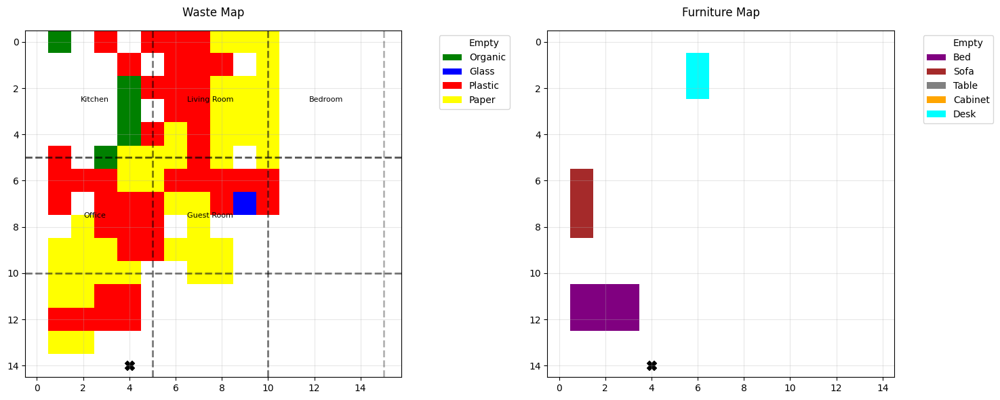

Step 84: Reward = -0.084, Total = 748.489


<Figure size 1600x2000 with 0 Axes>

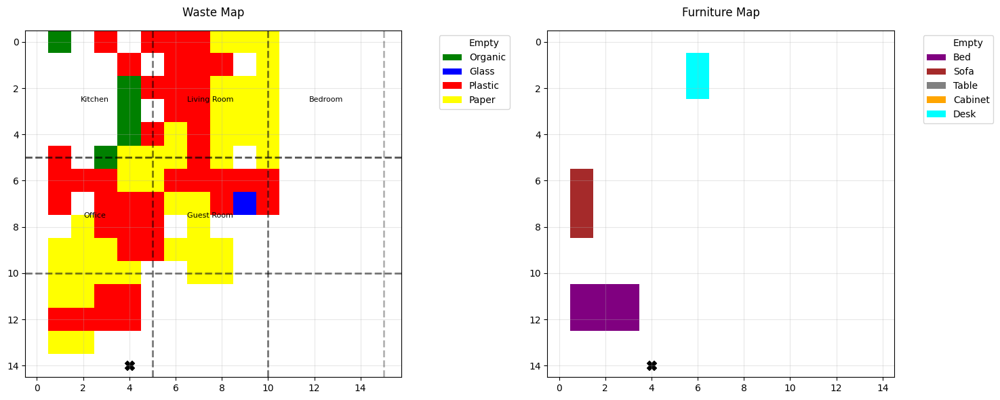

Step 85: Reward = -0.085, Total = 748.404


<Figure size 1600x2000 with 0 Axes>

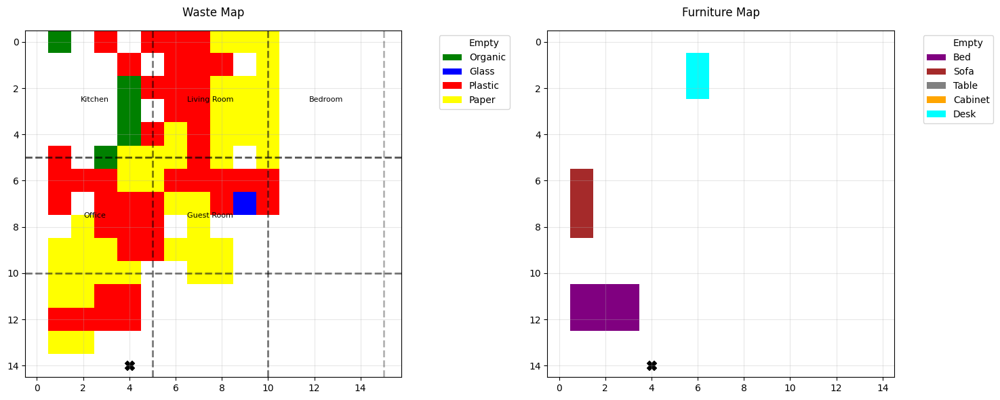

Step 86: Reward = 0.414, Total = 748.818


<Figure size 1600x2000 with 0 Axes>

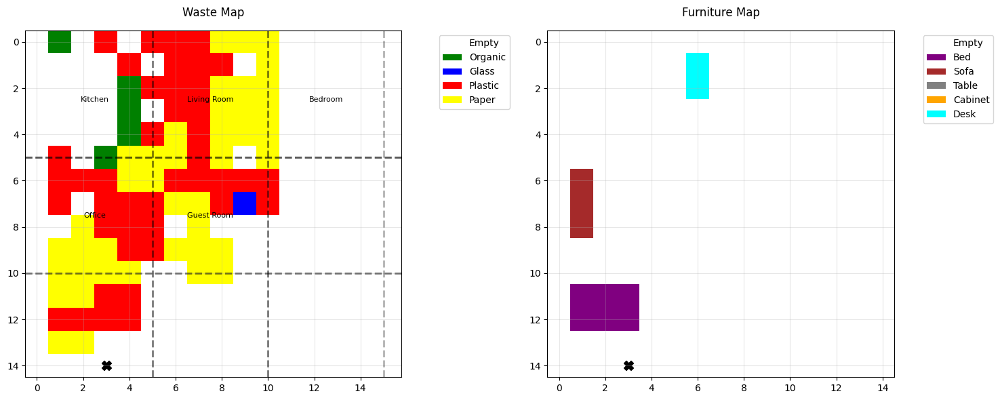

Step 87: Reward = -0.08700000000000001, Total = 748.731


<Figure size 1600x2000 with 0 Axes>

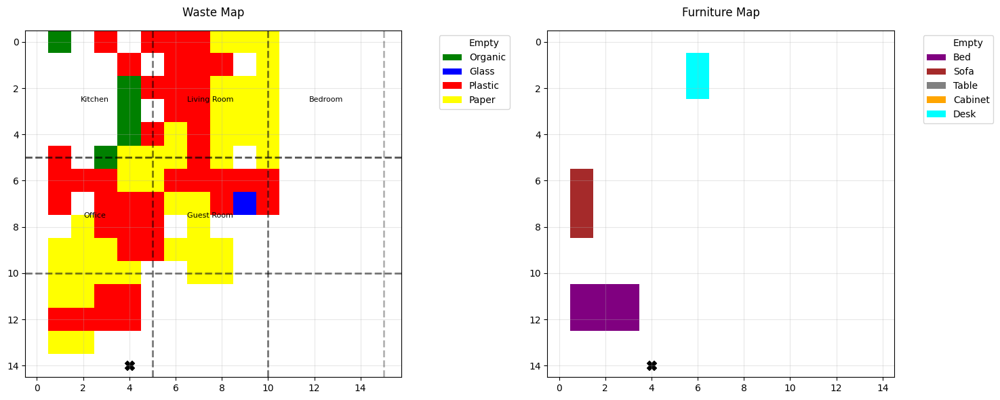

Step 88: Reward = 0.912, Total = 749.643


<Figure size 1600x2000 with 0 Axes>

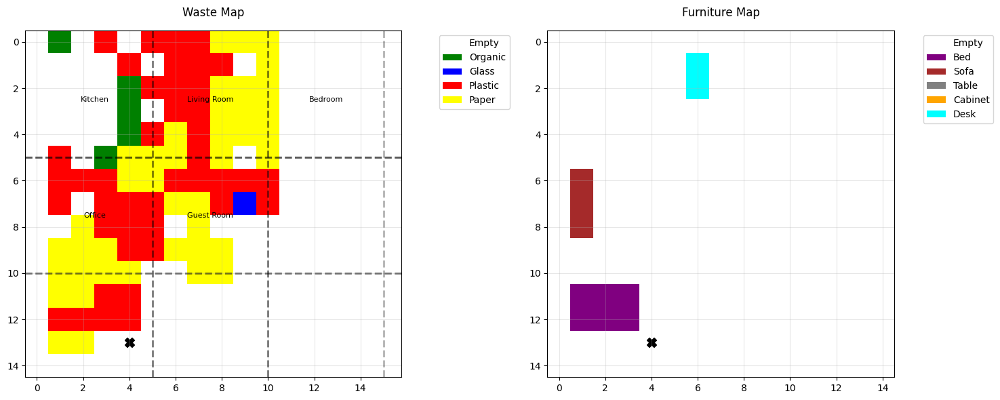

Step 89: Reward = 1.911, Total = 751.554


<Figure size 1600x2000 with 0 Axes>

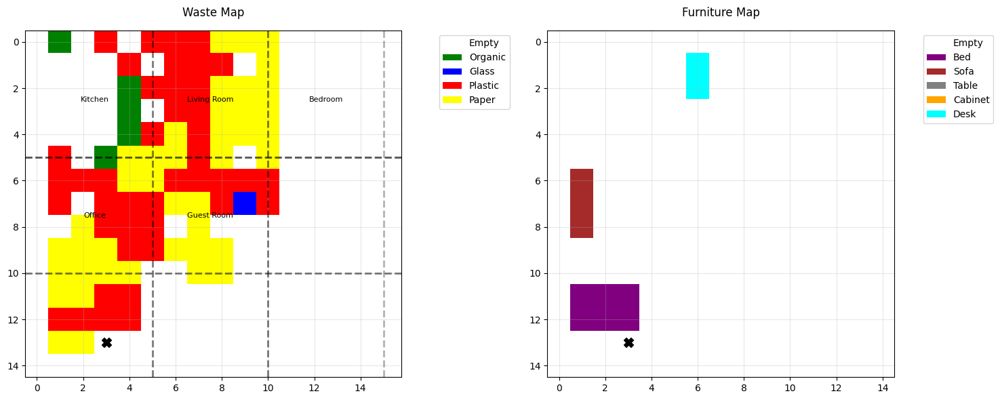

Step 90: Reward = -2, Total = 749.554


<Figure size 1600x2000 with 0 Axes>

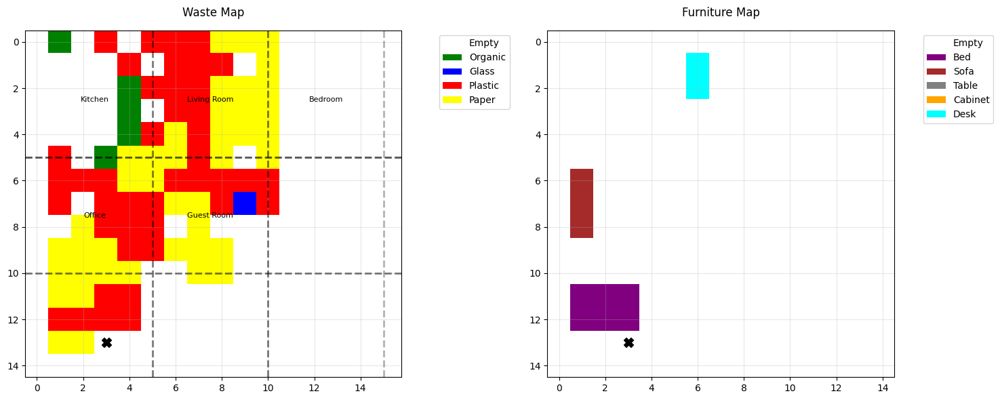

Step 91: Reward = 0.40900000000000003, Total = 749.963


<Figure size 1600x2000 with 0 Axes>

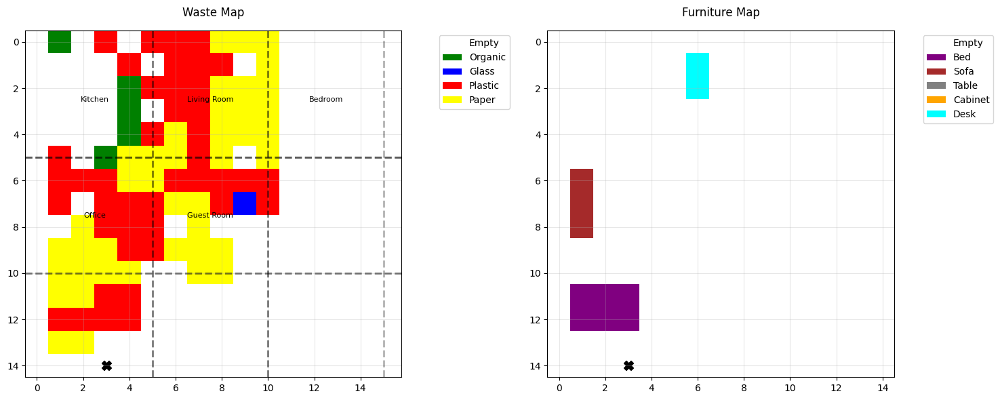

Step 92: Reward = -0.092, Total = 749.871


<Figure size 1600x2000 with 0 Axes>

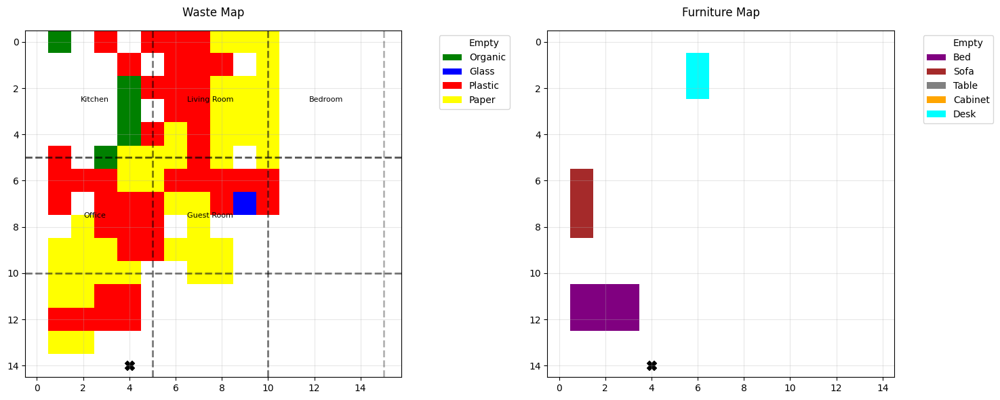

Step 93: Reward = -0.093, Total = 749.778


<Figure size 1600x2000 with 0 Axes>

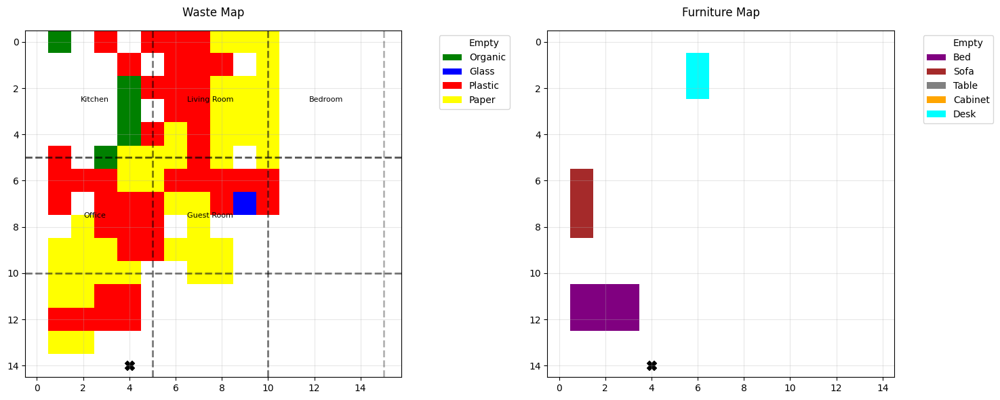

Step 94: Reward = 0.906, Total = 750.684


<Figure size 1600x2000 with 0 Axes>

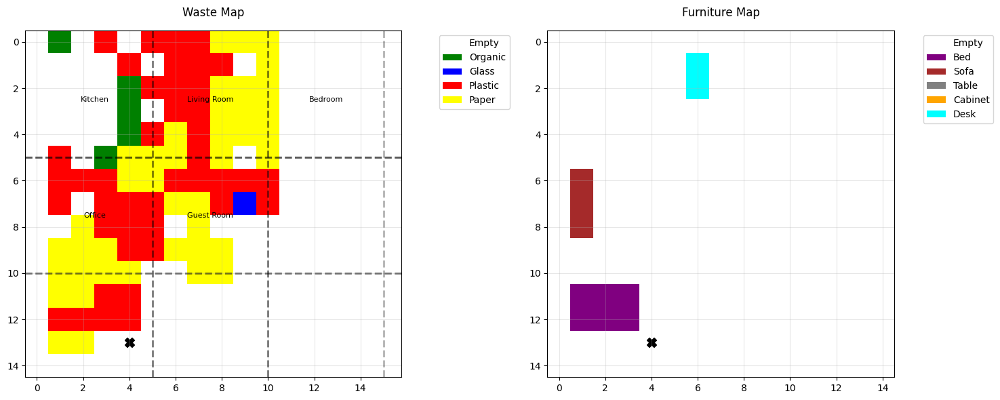

Step 95: Reward = -0.095, Total = 750.5889999999999


<Figure size 1600x2000 with 0 Axes>

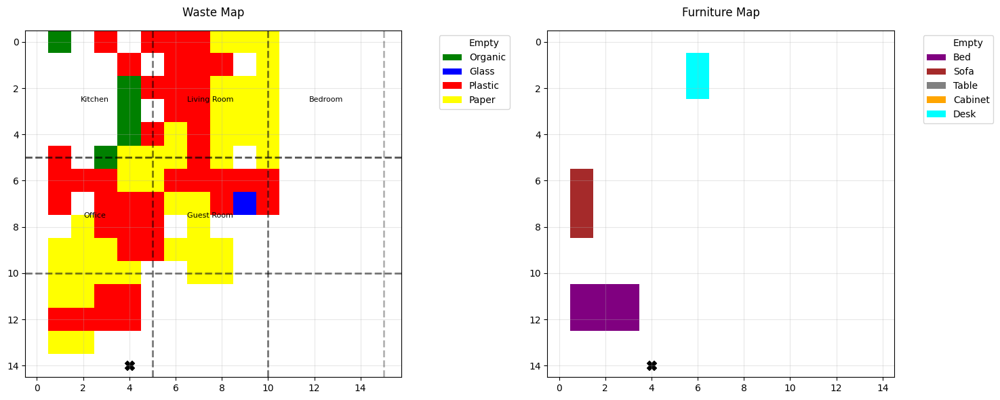

Step 96: Reward = 0.904, Total = 751.4929999999999


<Figure size 1600x2000 with 0 Axes>

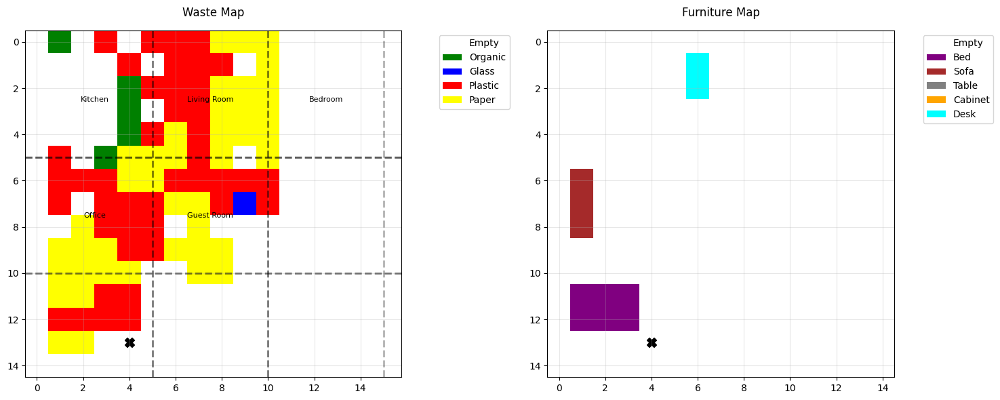

Step 97: Reward = -0.097, Total = 751.396


<Figure size 1600x2000 with 0 Axes>

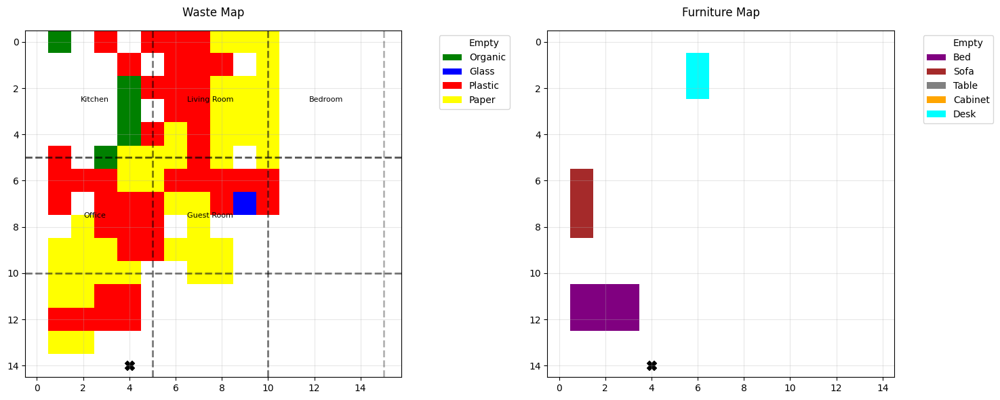

Step 98: Reward = -0.098, Total = 751.298


<Figure size 1600x2000 with 0 Axes>

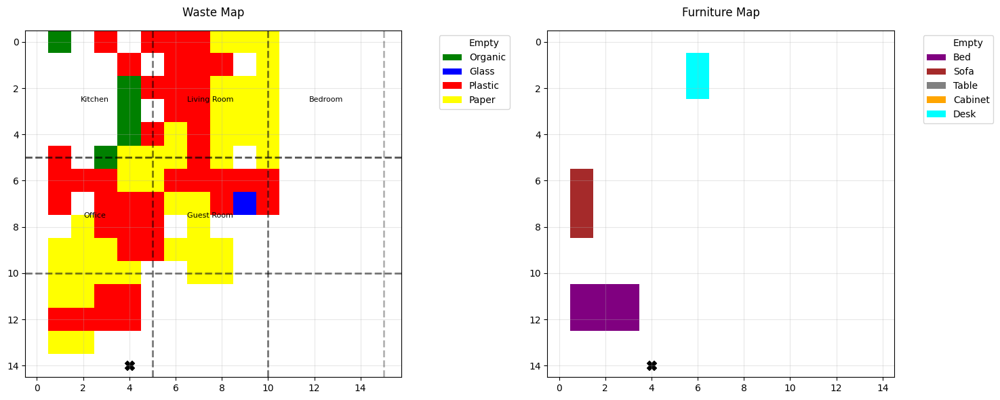

Step 99: Reward = 0.401, Total = 751.699


<Figure size 1600x2000 with 0 Axes>

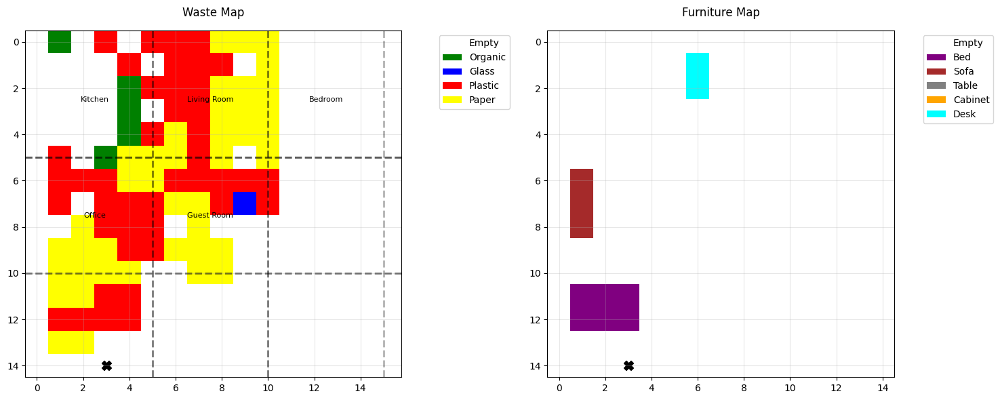

Step 100: Reward = 0.4, Total = 752.0989999999999
Test completed. Total reward: 752.0989999999999


In [ ]:
test(CleaningRobotEnv(map_size=15, rooms=None, max_time_steps=150), trained_agent, max_steps = 100)